# Ocean eddy tracking SATELLITE

In [1]:
# Importing all libraries.
from pylab import *
from netCDF4 import Dataset
%matplotlib inline
import os
import cmocean as cm
from trackeddy.tracking import *
from trackeddy.datastruct import *
from trackeddy.geometryfunc import *
from trackeddy.init import *
from trackeddy.physics import *
from trackeddy.plotfunc import *
from calendar import monthrange

In [2]:
year='1995'
monthsin=1
monthsend=3

In [3]:
print('Analizing the year ',year,'in the months[',monthsin,'-',monthsend,']')
inputfiles='/g/data/ua8/CMEMS_SeaLevel/v3-0/'+year+'/'

outfile='/g/data/v45/jm5970/trackeddy_out/'

ii=0

datashapetime=0
for month in range(monthsin,monthsend):
    datashapetime=datashapetime+monthrange(int(year), month)[1]

ncfile=Dataset(inputfiles+'dt_global_allsat_phy_l4_'+year+'0101_20170110.nc')
ssha=squeeze(ncfile.variables['sla'][:])
lon=ncfile.variables['longitude'][:]
lat=ncfile.variables['latitude'][:]

sshatime=zeros([datashapetime,shape(ssha)[0],shape(ssha)[1]])
ii=0
print('Start loading data')
for month in range(monthsin,monthsend):
    daysmonth=monthrange(int(year), month)[1]
    for days in range(1,daysmonth+1):
        ncfile=Dataset(inputfiles+'dt_global_allsat_phy_l4_'+year+'%02d'%month+'%02d'%daysmonth+'_20170110.nc')
        sshatime[ii,:,:]=squeeze(ncfile.variables['sla'][:])
        ii=ii+1
ssha=ma.masked_where(sshatime <= -2147483647, sshatime)
del sshatime
print('End loading data')

Analizing the year  1995 in the months[ 1 - 3 ]
Start loading data
End loading data


In [4]:
#areamap=array([[0,len(lon)],[0,len(lat)]])
areamap=array([[0,len(lon)],[0,int(len(lat)/3)]])

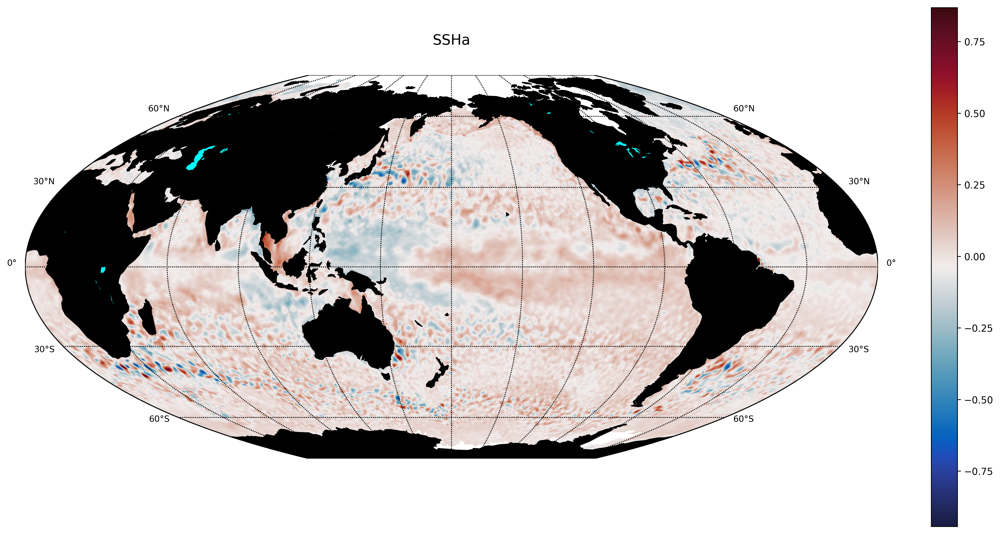

In [5]:
basemap_mplot(lon,lat,ssha[0,:,:],title="SSHa",projection='mbtfpq',lat_0=-90,lon_0=-180,\
              resolution='c',scale='Lin',vmin='',vmax='',cmap=cm.cm.balance,xan=1,yan=1,\
              figsize=(20,10),fontsize=15)
colorbar()

(<matplotlib.figure.Figure at 0x7f50fbe817b8>,
 array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f50fbe81d68>,
       dtype=object))

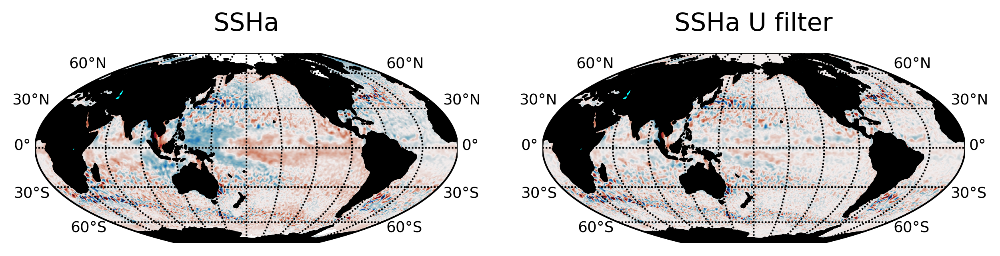

In [6]:
#Area in indexes, probably in the future it will be added an option for lon - lat coords.
nofilterdata = ssha[0,:,:]
nofilterdata = nofilterdata.filled(fill_value=0)
nofilterdata = nofilterdata - ndimage.uniform_filter(nofilterdata, size=50)
#data = ma.masked_array(nofilterdata, mask)
basemap_mplot(lon,lat,[ssha[0,:,:],nofilterdata],title=["SSHa","SSHa U filter"]\
              ,projection='mbtfpq',lat_0=-90,lon_0=-180,scale='Lin',cmap=cm.cm.balance\
              ,vmin=-0.5,vmax=0.5,xan=2,yan=1,figsize=(10,5),fontsize=15,dpi=300)

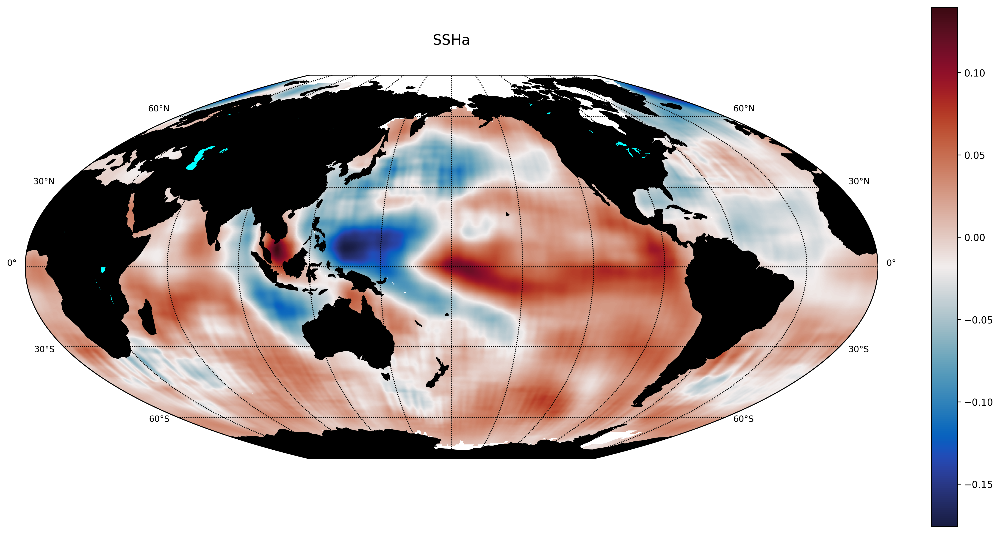

In [7]:
basemap_mplot(lon,lat,ssha[0,:,:]-nofilterdata,title="SSHa",projection='mbtfpq',lat_0=-90,lon_0=-180,\
              resolution='c',scale='Lin',vmin='',vmax='',cmap=cm.cm.balance,xan=1,yan=1,\
              figsize=(20,10),fontsize=15)
colorbar()

In [8]:
#Area in indexes, probably in the future it will be added an option for lon - lat coords.
#areamap=array([[0,int(len(lon)/10)],[0,int(len(lat)/3)]])
#areamap=array([[0,len(lon)],[0,int(len(lat)/3)]])
#areamap=array([[int(len(lon)/1.5),len(lon)-int(len(lon)/4)],[int(len(lat)/2),int(len(lat))]])
areamap=array([[0,len(lon)],[0,len(lat)]])
#areamap=array([[0,len(lon)],[int(len(lat)/3),int(len(lat)-len(lat)/3)]])
#areamap=array([[650,800],[200,400]])

In [9]:
areamap

array([[   0, 1440],
       [   0,  720]])

In [10]:
eddytd=analyseddyzt(ssha[0:2,:,:],lon,lat,0,1,1,ssha[0:2,:,:].max(),0.01,0.01\
                    ,data_meant='',areamap=areamap,mask=''\
                    ,eccenfit=0.85,gaussrsquarefit=0.7,ellipsrsquarefit=0.7\
                    ,maskopt='contour',sfilter='uniform',sfsize=50\
                    ,destdir='',physics='',diagnostics=False,plotdata=False,pprint=False)

 0% [====================>]100% | Elapsed Time:0 s | Estimated Time:0 s | Info: Init time |
 0% [====================>]100% | Elapsed Time:666 s | Estimated Time:666 s | Info: 1095 |


key:  eddyn_0 Level:  0.53


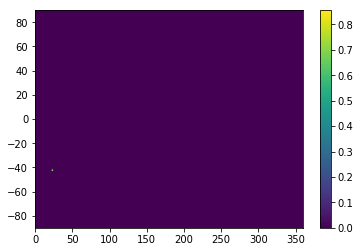

 0% [>                    ]0% | Elapsed Time:2 s | Estimated Time:3306 s | Info: eddyn_0 |key:  eddyn_1 Level:  0.5700000000000001


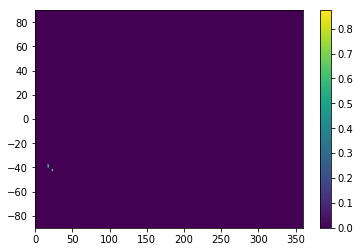

 0% [>                    ]0% | Elapsed Time:3 s | Estimated Time:2480 s | Info: eddyn_1 |key:  eddyn_2 Level:  0.66


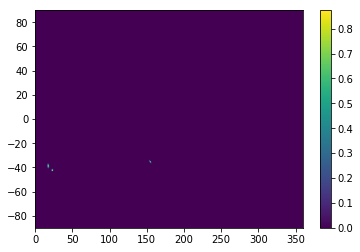

 0% [>                    ]0% | Elapsed Time:5 s | Estimated Time:2755 s | Info: eddyn_2 |key:  eddyn_3 Level:  0.74


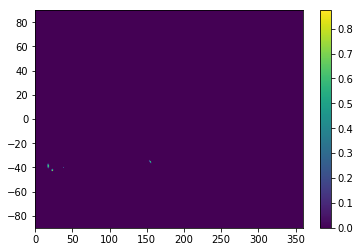

 0% [>                    ]0% | Elapsed Time:7 s | Estimated Time:2893 s | Info: eddyn_3 |key:  eddyn_4 Level:  0.5


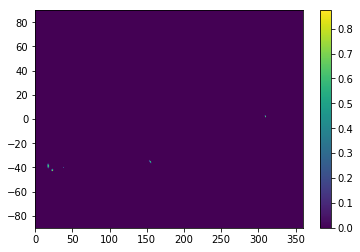

 0% [>                    ]0% | Elapsed Time:8 s | Estimated Time:2645 s | Info: eddyn_4 |key:  eddyn_5 Level:  0.47000000000000003


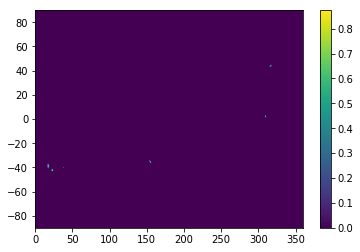

 0% [>                    ]0% | Elapsed Time:10 s | Estimated Time:2755 s | Info: eddyn_5 |key:  eddyn_6 Level:  0.5700000000000001


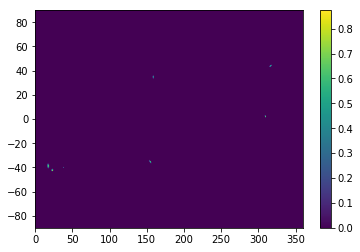

 0% [>                    ]0% | Elapsed Time:12 s | Estimated Time:2834 s | Info: eddyn_6 |key:  eddyn_7 Level:  0.63


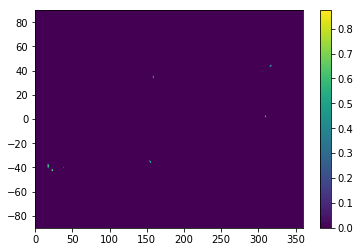

 0% [>                    ]0% | Elapsed Time:14 s | Estimated Time:2893 s | Info: eddyn_7 |key:  eddyn_8 Level:  0.5700000000000001


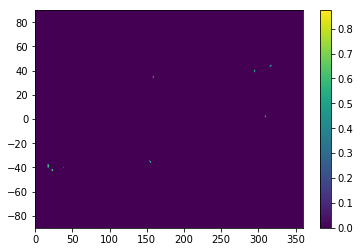

 0% [>                    ]1% | Elapsed Time:15 s | Estimated Time:2755 s | Info: eddyn_8 |key:  eddyn_9 Level:  0.47000000000000003


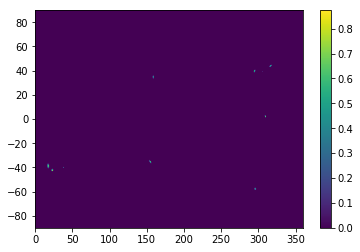

 0% [>                    ]1% | Elapsed Time:17 s | Estimated Time:2810 s | Info: eddyn_9 |key:  eddyn_10 Level:  0.48000000000000004


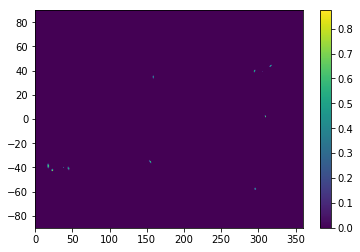

 0% [>                    ]1% | Elapsed Time:19 s | Estimated Time:2855 s | Info: eddyn_10 |key:  eddyn_11 Level:  0.36000000000000004


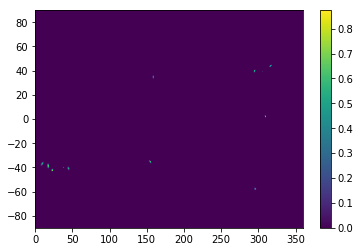

 0% [>                    ]1% | Elapsed Time:20 s | Estimated Time:2755 s | Info: eddyn_11 |key:  eddyn_12 Level:  0.38


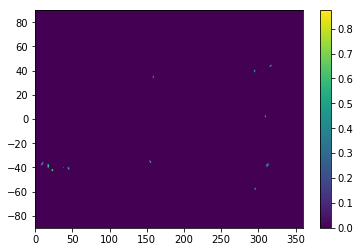

 0% [>                    ]1% | Elapsed Time:22 s | Estimated Time:2797 s | Info: eddyn_12 |key:  eddyn_13 Level:  0.5


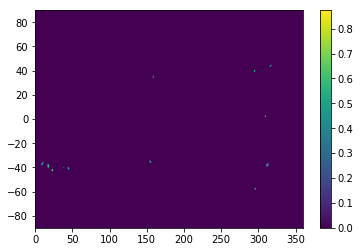

 0% [>                    ]1% | Elapsed Time:24 s | Estimated Time:2834 s | Info: eddyn_13 |key:  eddyn_14 Level:  0.33


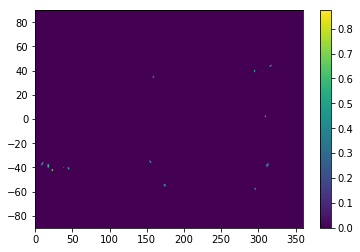

 0% [>                    ]1% | Elapsed Time:26 s | Estimated Time:2865 s | Info: eddyn_14 |key:  eddyn_15 Level:  0.23


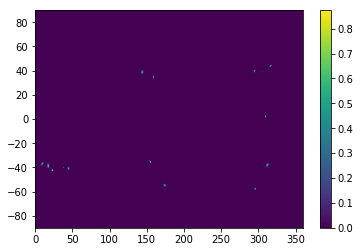

 0% [>                    ]1% | Elapsed Time:27 s | Estimated Time:2789 s | Info: eddyn_15 |key:  eddyn_16 Level:  0.24000000000000002


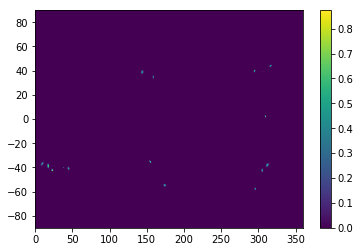

 0% [>                    ]1% | Elapsed Time:29 s | Estimated Time:2820 s | Info: eddyn_16 |key:  eddyn_17 Level:  0.36000000000000004


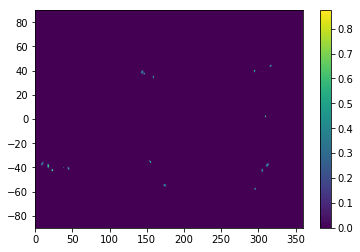

 0% [>                    ]1% | Elapsed Time:31 s | Estimated Time:2847 s | Info: eddyn_17 |key:  eddyn_18 Level:  0.17


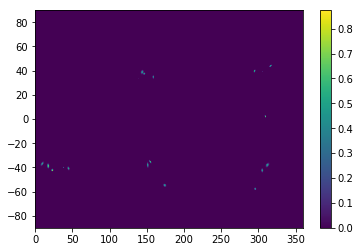

 0% [>                    ]1% | Elapsed Time:32 s | Estimated Time:2784 s | Info: eddyn_18 |key:  eddyn_19 Level:  0.25


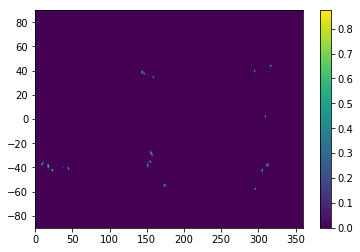

 0% [>                    ]1% | Elapsed Time:34 s | Estimated Time:2810 s | Info: eddyn_19 |key:  eddyn_20 Level:  0.19


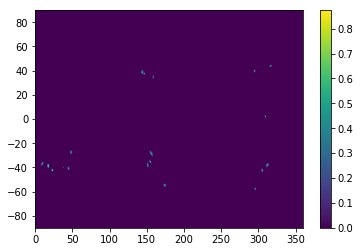

 0% [>                    ]1% | Elapsed Time:36 s | Estimated Time:2834 s | Info: eddyn_20 |key:  eddyn_21 Level:  0.15000000000000002


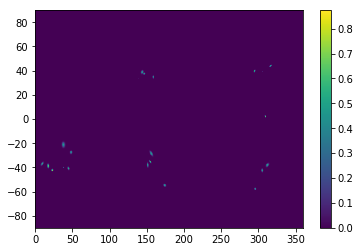

 0% [>                    ]1% | Elapsed Time:38 s | Estimated Time:2855 s | Info: eddyn_21 |key:  eddyn_22 Level:  0.39


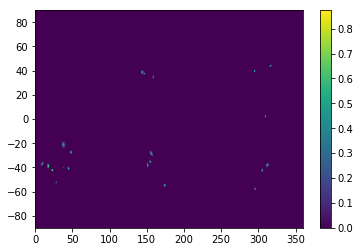

 0% [>                    ]1% | Elapsed Time:39 s | Estimated Time:2803 s | Info: eddyn_22 |key:  eddyn_23 Level:  0.06999999999999999


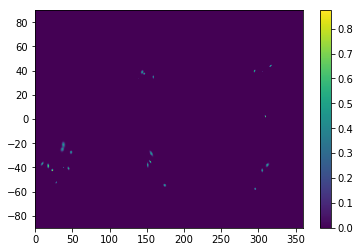

 0% [>                    ]1% | Elapsed Time:41 s | Estimated Time:2824 s | Info: eddyn_23 |key:  eddyn_24 Level:  0.22


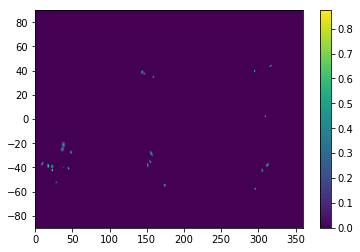

 0% [>                    ]2% | Elapsed Time:43 s | Estimated Time:2843 s | Info: eddyn_24 |key:  eddyn_25 Level:  0.34


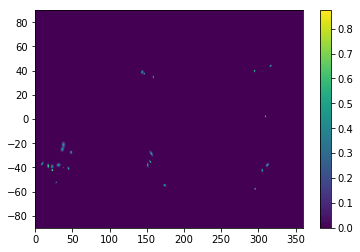

 0% [>                    ]2% | Elapsed Time:44 s | Estimated Time:2797 s | Info: eddyn_25 |key:  eddyn_26 Level:  0.38


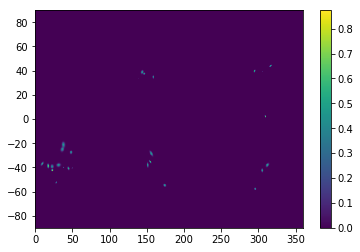

 0% [>                    ]2% | Elapsed Time:46 s | Estimated Time:2816 s | Info: eddyn_26 |key:  eddyn_27 Level:  0.37


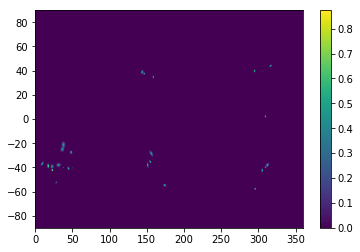

 0% [>                    ]2% | Elapsed Time:48 s | Estimated Time:2834 s | Info: eddyn_27 |key:  eddyn_28 Level:  0.31


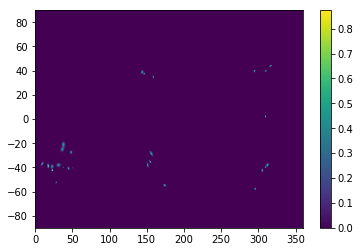

 0% [>                    ]2% | Elapsed Time:50 s | Estimated Time:2850 s | Info: eddyn_28 |key:  eddyn_29 Level:  0.25


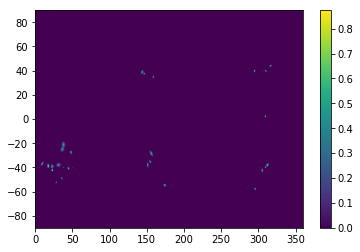

 0% [>                    ]2% | Elapsed Time:51 s | Estimated Time:2810 s | Info: eddyn_29 |key:  eddyn_30 Level:  0.34


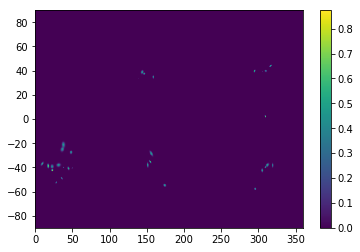

 0% [>                    ]2% | Elapsed Time:53 s | Estimated Time:2826 s | Info: eddyn_30 |key:  eddyn_31 Level:  0.22


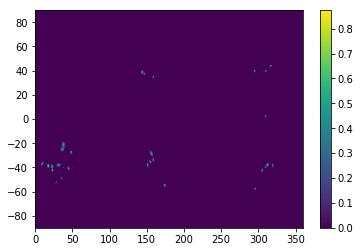

 0% [>                    ]2% | Elapsed Time:55 s | Estimated Time:2841 s | Info: eddyn_31 |key:  eddyn_32 Level:  0.15000000000000002


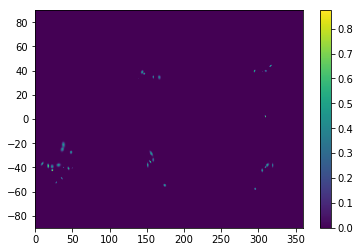

 0% [>                    ]2% | Elapsed Time:56 s | Estimated Time:2805 s | Info: eddyn_32 |key:  eddyn_33 Level:  0.09999999999999999


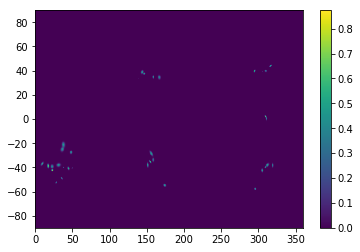

 0% [>                    ]2% | Elapsed Time:58 s | Estimated Time:2820 s | Info: eddyn_33 |key:  eddyn_34 Level:  0.37


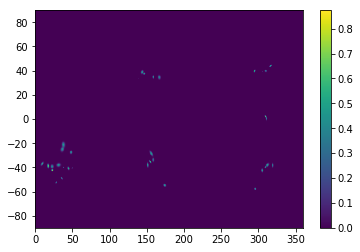

 0% [>                    ]2% | Elapsed Time:60 s | Estimated Time:2834 s | Info: eddyn_34 |key:  eddyn_35 Level:  0.2


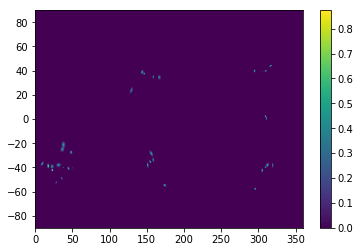

 0% [>                    ]2% | Elapsed Time:62 s | Estimated Time:2847 s | Info: eddyn_35 |key:  eddyn_36 Level:  0.31


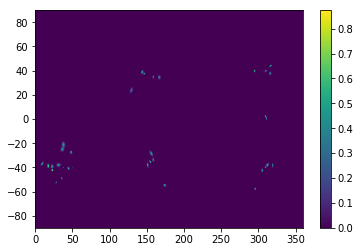

 0% [>                    ]2% | Elapsed Time:63 s | Estimated Time:2815 s | Info: eddyn_36 |key:  eddyn_37 Level:  0.33


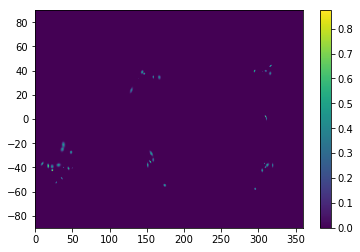

 0% [>                    ]2% | Elapsed Time:65 s | Estimated Time:2828 s | Info: eddyn_37 |key:  eddyn_38 Level:  0.29000000000000004


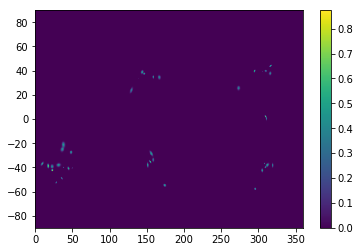

 0% [>                    ]2% | Elapsed Time:67 s | Estimated Time:2840 s | Info: eddyn_38 |key:  eddyn_39 Level:  0.17


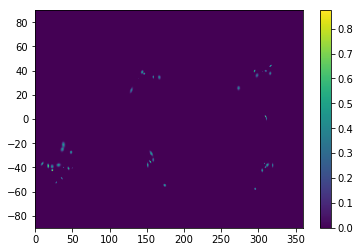

 0% [>                    ]2% | Elapsed Time:69 s | Estimated Time:2851 s | Info: eddyn_39 |key:  eddyn_40 Level:  0.22


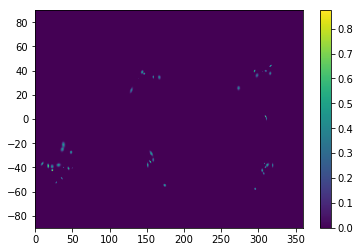

 0% [>                    ]2% | Elapsed Time:70 s | Estimated Time:2822 s | Info: eddyn_40 |key:  eddyn_41 Level:  0.14


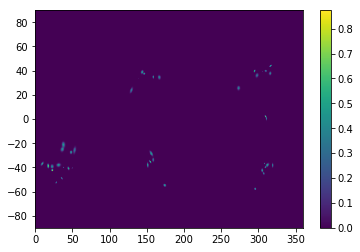

 0% [>                    ]3% | Elapsed Time:72 s | Estimated Time:2834 s | Info: eddyn_41 |key:  eddyn_42 Level:  0.34


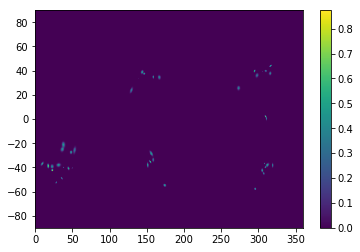

 0% [>                    ]3% | Elapsed Time:74 s | Estimated Time:2845 s | Info: eddyn_42 |key:  eddyn_43 Level:  0.25


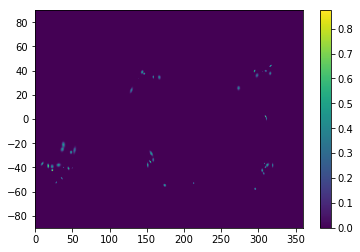

 0% [>                    ]3% | Elapsed Time:76 s | Estimated Time:2855 s | Info: eddyn_43 |key:  eddyn_44 Level:  0.31


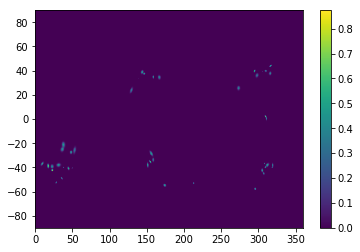

 0% [>                    ]3% | Elapsed Time:77 s | Estimated Time:2828 s | Info: eddyn_44 |key:  eddyn_45 Level:  0.17


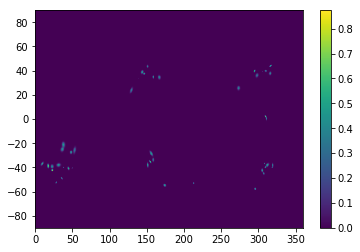

 0% [>                    ]3% | Elapsed Time:79 s | Estimated Time:2839 s | Info: eddyn_45 |key:  eddyn_46 Level:  0.33


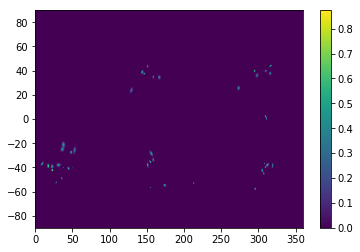

 0% [>                    ]3% | Elapsed Time:81 s | Estimated Time:2849 s | Info: eddyn_46 |key:  eddyn_47 Level:  0.18000000000000002


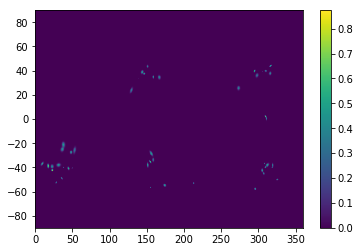

 0% [>                    ]3% | Elapsed Time:82 s | Estimated Time:2824 s | Info: eddyn_47 |key:  eddyn_48 Level:  0.24000000000000002


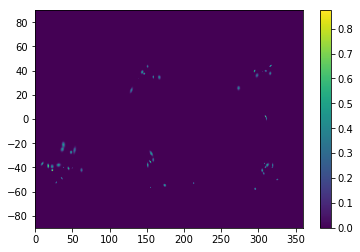

 0% [>                    ]3% | Elapsed Time:84 s | Estimated Time:2834 s | Info: eddyn_48 |key:  eddyn_49 Level:  0.15000000000000002


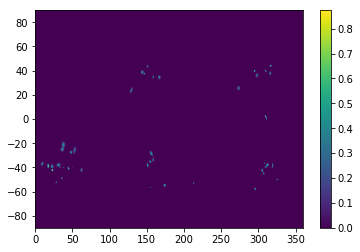

 0% [>                    ]3% | Elapsed Time:86 s | Estimated Time:2843 s | Info: eddyn_49 |key:  eddyn_50 Level:  0.21000000000000002


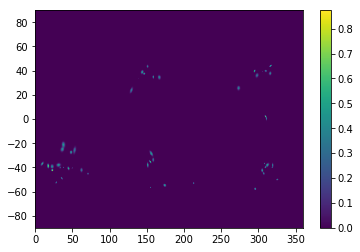

 0% [>                    ]3% | Elapsed Time:88 s | Estimated Time:2852 s | Info: eddyn_50 |key:  eddyn_51 Level:  0.32


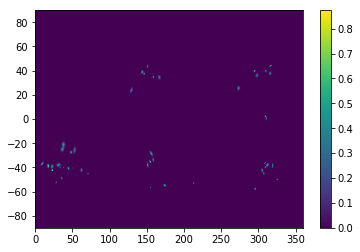

 0% [>                    ]3% | Elapsed Time:89 s | Estimated Time:2829 s | Info: eddyn_51 |key:  eddyn_52 Level:  0.22


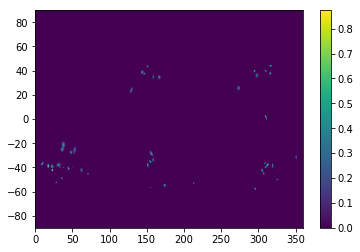

 0% [>                    ]3% | Elapsed Time:91 s | Estimated Time:2838 s | Info: eddyn_52 |key:  eddyn_53 Level:  0.21000000000000002


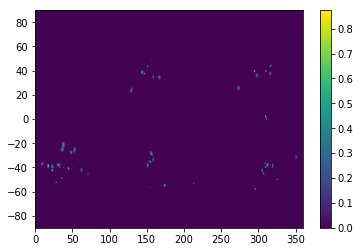

 0% [>                    ]3% | Elapsed Time:93 s | Estimated Time:2847 s | Info: eddyn_53 |key:  eddyn_54 Level:  0.25


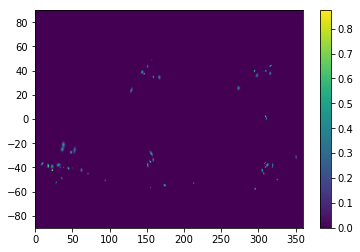

 0% [>                    ]3% | Elapsed Time:94 s | Estimated Time:2825 s | Info: eddyn_54 |key:  eddyn_55 Level:  0.16


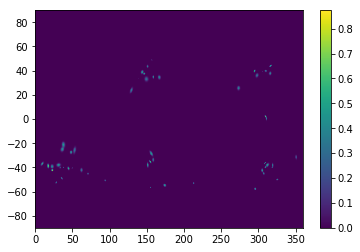

 0% [>                    ]3% | Elapsed Time:96 s | Estimated Time:2834 s | Info: eddyn_55 |key:  eddyn_56 Level:  0.24000000000000002


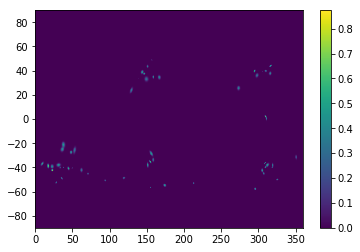

 0% [>                    ]3% | Elapsed Time:98 s | Estimated Time:2842 s | Info: eddyn_56 |key:  eddyn_57 Level:  0.17


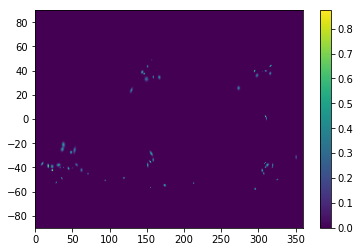

 0% [>                    ]4% | Elapsed Time:100 s | Estimated Time:2850 s | Info: eddyn_57 |key:  eddyn_58 Level:  0.21000000000000002


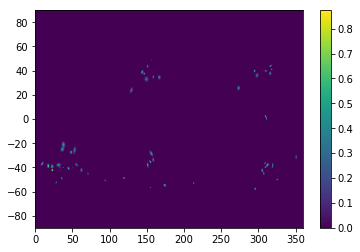

 0% [>                    ]4% | Elapsed Time:101 s | Estimated Time:2830 s | Info: eddyn_58 |key:  eddyn_59 Level:  0.25


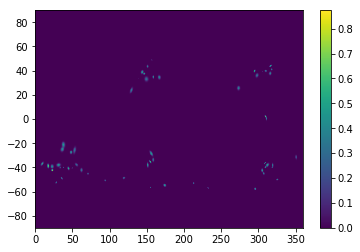

 0% [>                    ]4% | Elapsed Time:103 s | Estimated Time:2838 s | Info: eddyn_59 |key:  eddyn_60 Level:  0.22


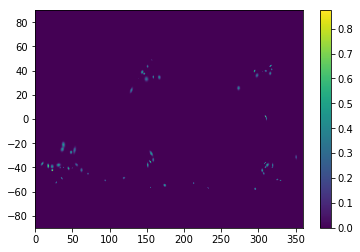

 0% [>                    ]4% | Elapsed Time:105 s | Estimated Time:2845 s | Info: eddyn_60 |key:  eddyn_61 Level:  0.26


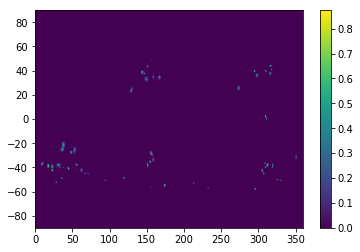

 0% [>                    ]4% | Elapsed Time:107 s | Estimated Time:2853 s | Info: eddyn_61 |key:  eddyn_62 Level:  0.2


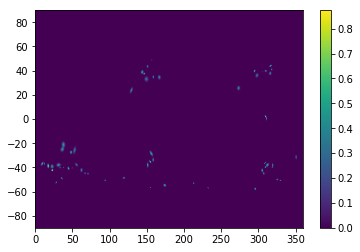

 0% [>                    ]4% | Elapsed Time:108 s | Estimated Time:2834 s | Info: eddyn_62 |key:  eddyn_63 Level:  0.17


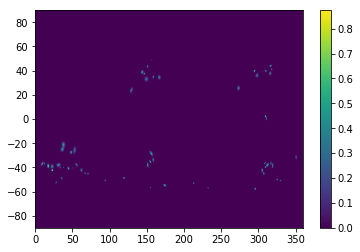

 0% [>                    ]4% | Elapsed Time:110 s | Estimated Time:2841 s | Info: eddyn_63 |key:  eddyn_64 Level:  0.27


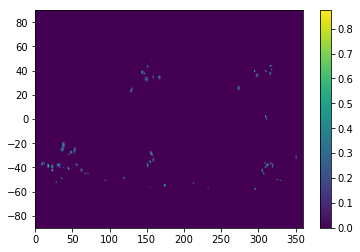

 0% [>                    ]4% | Elapsed Time:112 s | Estimated Time:2848 s | Info: eddyn_64 |key:  eddyn_65 Level:  0.15000000000000002


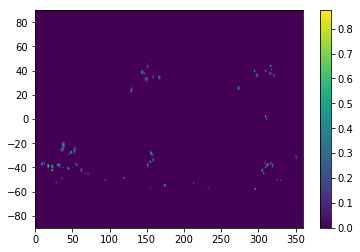

 0% [>                    ]4% | Elapsed Time:113 s | Estimated Time:2830 s | Info: eddyn_65 |key:  eddyn_66 Level:  0.21000000000000002


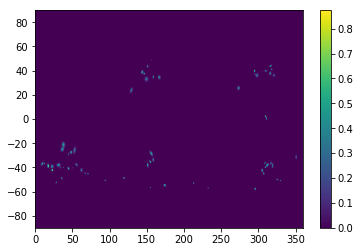

 0% [>                    ]4% | Elapsed Time:115 s | Estimated Time:2837 s | Info: eddyn_66 |key:  eddyn_67 Level:  0.15000000000000002


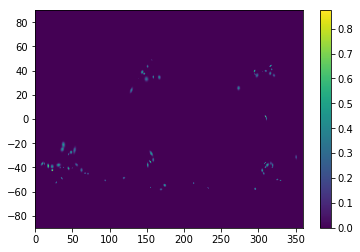

 0% [>                    ]4% | Elapsed Time:117 s | Estimated Time:2844 s | Info: eddyn_67 |key:  eddyn_68 Level:  0.21000000000000002


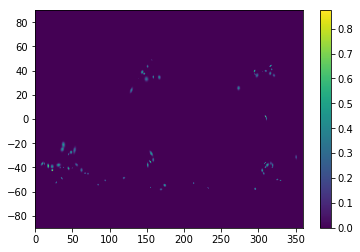

 0% [>                    ]4% | Elapsed Time:119 s | Estimated Time:2851 s | Info: eddyn_68 |key:  eddyn_69 Level:  0.13


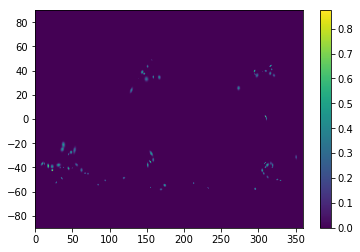

 0% [>                    ]4% | Elapsed Time:120 s | Estimated Time:2834 s | Info: eddyn_69 |key:  eddyn_70 Level:  0.18000000000000002


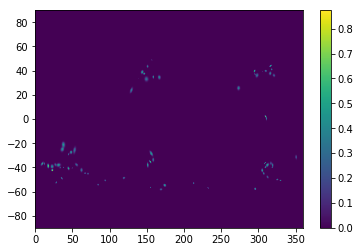

 0% [>                    ]4% | Elapsed Time:122 s | Estimated Time:2840 s | Info: eddyn_70 |key:  eddyn_71 Level:  0.23


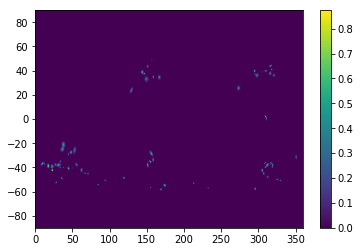

 0% [>                    ]4% | Elapsed Time:124 s | Estimated Time:2847 s | Info: eddyn_71 |key:  eddyn_72 Level:  0.28


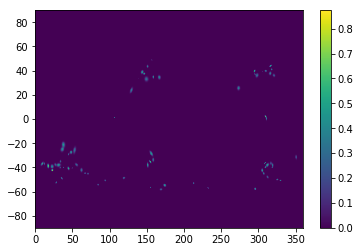

 0% [>                    ]4% | Elapsed Time:125 s | Estimated Time:2830 s | Info: eddyn_72 |key:  eddyn_73 Level:  0.19


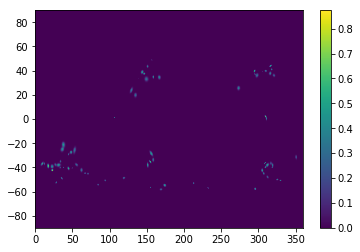

 0% [>                    ]4% | Elapsed Time:127 s | Estimated Time:2837 s | Info: eddyn_73 |key:  eddyn_74 Level:  0.22


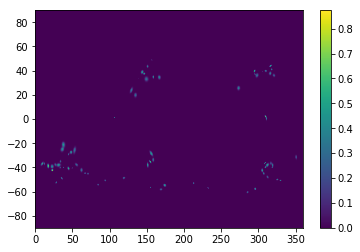

 0% [>                    ]5% | Elapsed Time:129 s | Estimated Time:2843 s | Info: eddyn_74 |key:  eddyn_75 Level:  0.25


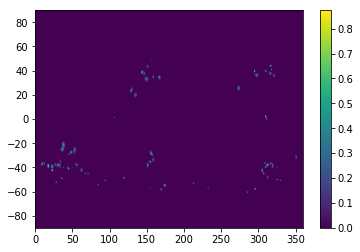

 0% [>                    ]5% | Elapsed Time:131 s | Estimated Time:2849 s | Info: eddyn_75 |key:  eddyn_76 Level:  0.19


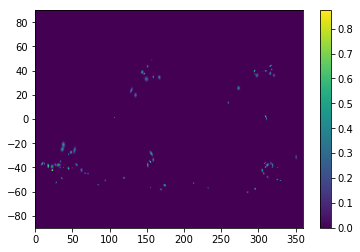

 0% [>                    ]5% | Elapsed Time:132 s | Estimated Time:2834 s | Info: eddyn_76 |key:  eddyn_77 Level:  0.08


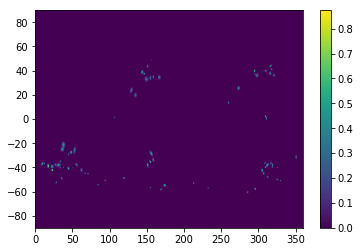

 0% [>                    ]5% | Elapsed Time:134 s | Estimated Time:2840 s | Info: eddyn_77 |key:  eddyn_78 Level:  0.25


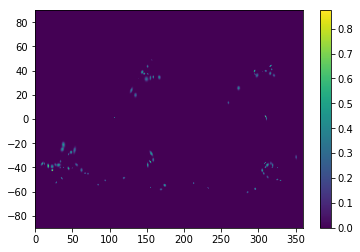

 0% [>                    ]5% | Elapsed Time:136 s | Estimated Time:2846 s | Info: eddyn_78 |key:  eddyn_79 Level:  0.21000000000000002


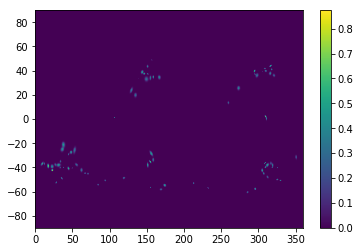

 0% [>                    ]5% | Elapsed Time:137 s | Estimated Time:2831 s | Info: eddyn_79 |key:  eddyn_80 Level:  0.2


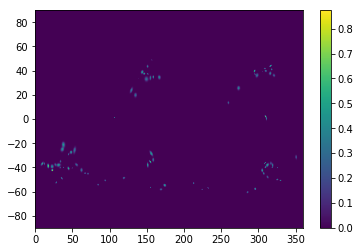

 0% [>                    ]5% | Elapsed Time:139 s | Estimated Time:2837 s | Info: eddyn_80 |key:  eddyn_81 Level:  0.16


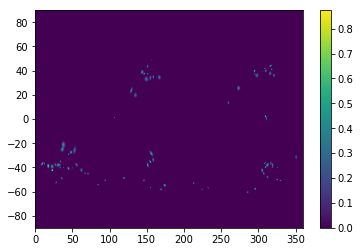

 0% [>                    ]5% | Elapsed Time:141 s | Estimated Time:2842 s | Info: eddyn_81 |key:  eddyn_82 Level:  0.2


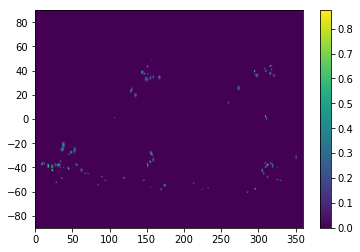

 0% [=>                   ]5% | Elapsed Time:143 s | Estimated Time:2848 s | Info: eddyn_82 |key:  eddyn_83 Level:  0.25


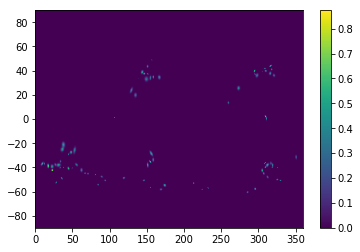

 0% [=>                   ]5% | Elapsed Time:144 s | Estimated Time:2834 s | Info: eddyn_83 |key:  eddyn_84 Level:  0.05


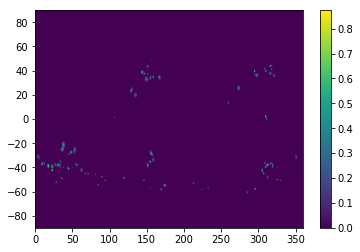

 0% [=>                   ]5% | Elapsed Time:146 s | Estimated Time:2839 s | Info: eddyn_84 |key:  eddyn_85 Level:  0.26


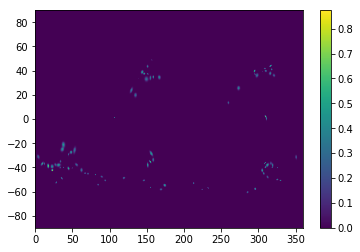

 0% [=>                   ]5% | Elapsed Time:148 s | Estimated Time:2845 s | Info: eddyn_85 |key:  eddyn_86 Level:  0.14


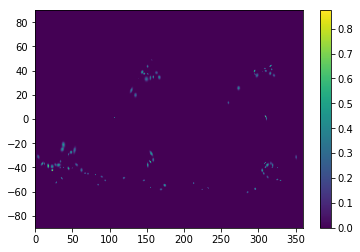

 0% [=>                   ]5% | Elapsed Time:149 s | Estimated Time:2831 s | Info: eddyn_86 |key:  eddyn_87 Level:  0.15000000000000002


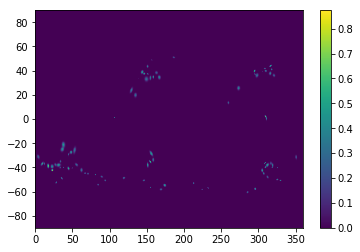

 0% [=>                   ]5% | Elapsed Time:151 s | Estimated Time:2836 s | Info: eddyn_87 |key:  eddyn_88 Level:  0.21000000000000002


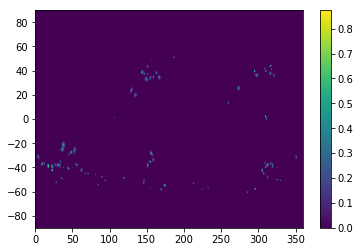

 0% [=>                   ]5% | Elapsed Time:153 s | Estimated Time:2842 s | Info: eddyn_88 |key:  eddyn_89 Level:  0.25


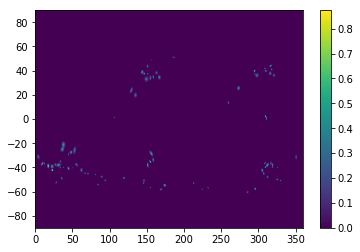

 0% [=>                   ]5% | Elapsed Time:155 s | Estimated Time:2847 s | Info: eddyn_89 |key:  eddyn_90 Level:  0.22


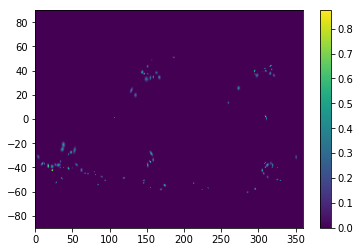

 0% [=>                   ]6% | Elapsed Time:156 s | Estimated Time:2834 s | Info: eddyn_90 |key:  eddyn_91 Level:  0.23


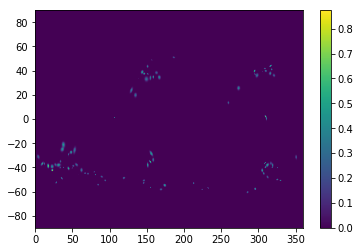

 0% [=>                   ]6% | Elapsed Time:158 s | Estimated Time:2839 s | Info: eddyn_91 |key:  eddyn_92 Level:  0.19


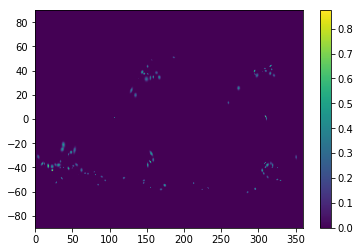

 0% [=>                   ]6% | Elapsed Time:160 s | Estimated Time:2844 s | Info: eddyn_92 |key:  eddyn_93 Level:  0.23


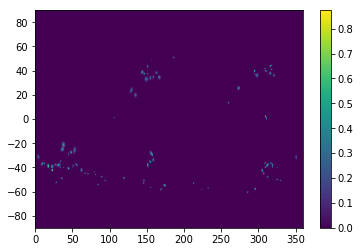

 0% [=>                   ]6% | Elapsed Time:161 s | Estimated Time:2831 s | Info: eddyn_93 |key:  eddyn_94 Level:  0.21000000000000002


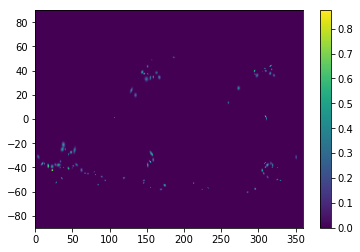

 0% [=>                   ]6% | Elapsed Time:163 s | Estimated Time:2836 s | Info: eddyn_94 |key:  eddyn_95 Level:  0.22


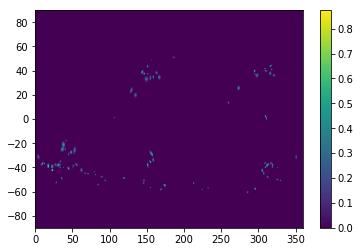

 0% [=>                   ]6% | Elapsed Time:165 s | Estimated Time:2841 s | Info: eddyn_95 |key:  eddyn_96 Level:  0.21000000000000002


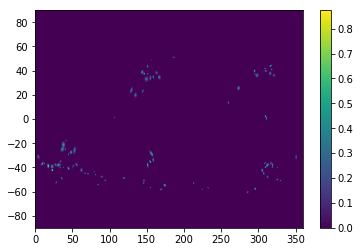

 0% [=>                   ]6% | Elapsed Time:167 s | Estimated Time:2846 s | Info: eddyn_96 |key:  eddyn_97 Level:  0.15000000000000002


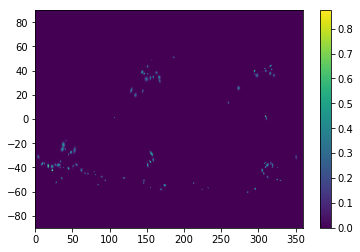

 0% [=>                   ]6% | Elapsed Time:168 s | Estimated Time:2834 s | Info: eddyn_97 |key:  eddyn_98 Level:  0.09999999999999999


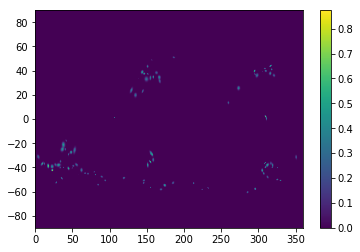

 0% [=>                   ]6% | Elapsed Time:170 s | Estimated Time:2838 s | Info: eddyn_98 |key:  eddyn_99 Level:  0.2


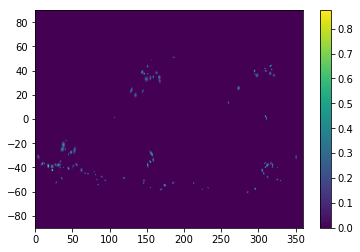

 0% [=>                   ]6% | Elapsed Time:172 s | Estimated Time:2843 s | Info: eddyn_99 |key:  eddyn_100 Level:  0.15000000000000002


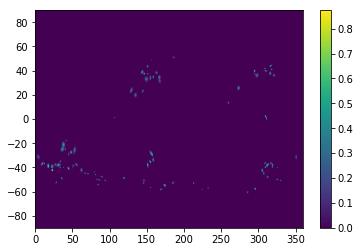

 0% [=>                   ]6% | Elapsed Time:173 s | Estimated Time:2831 s | Info: eddyn_100 |key:  eddyn_101 Level:  0.09999999999999999


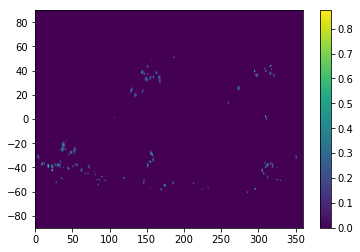

 0% [=>                   ]6% | Elapsed Time:175 s | Estimated Time:2836 s | Info: eddyn_101 |key:  eddyn_102 Level:  0.15000000000000002


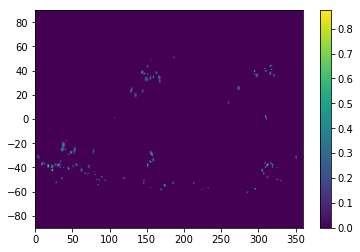

 0% [=>                   ]6% | Elapsed Time:177 s | Estimated Time:2841 s | Info: eddyn_102 |key:  eddyn_103 Level:  0.21000000000000002


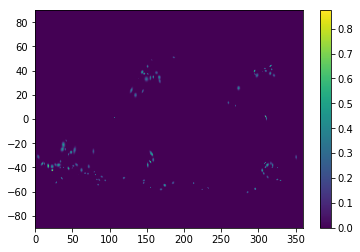

 0% [=>                   ]6% | Elapsed Time:178 s | Estimated Time:2829 s | Info: eddyn_103 |key:  eddyn_104 Level:  0.14


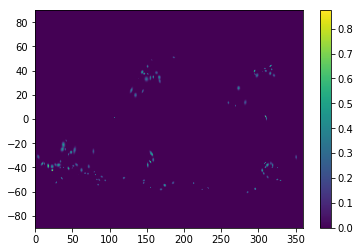

 0% [=>                   ]6% | Elapsed Time:180 s | Estimated Time:2834 s | Info: eddyn_104 |key:  eddyn_105 Level:  0.14


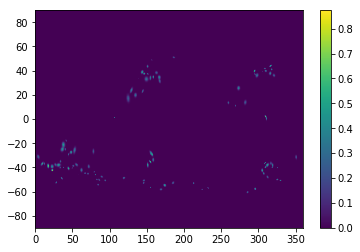

 0% [=>                   ]6% | Elapsed Time:182 s | Estimated Time:2838 s | Info: eddyn_105 |key:  eddyn_106 Level:  0.24000000000000002


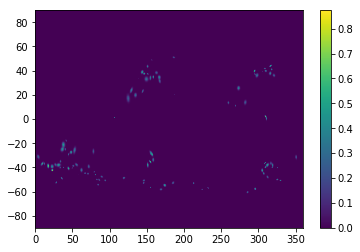

 0% [=>                   ]6% | Elapsed Time:183 s | Estimated Time:2827 s | Info: eddyn_106 |key:  eddyn_107 Level:  0.23


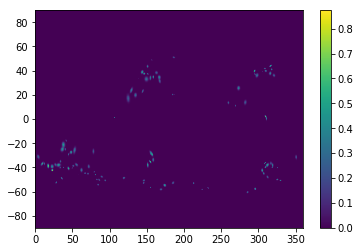

 0% [=>                   ]7% | Elapsed Time:185 s | Estimated Time:2832 s | Info: eddyn_107 |key:  eddyn_108 Level:  0.12


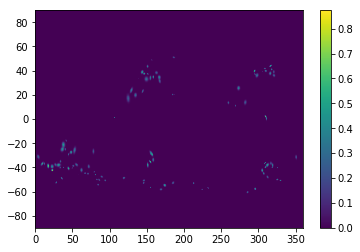

 0% [=>                   ]7% | Elapsed Time:187 s | Estimated Time:2836 s | Info: eddyn_108 |key:  eddyn_109 Level:  0.12


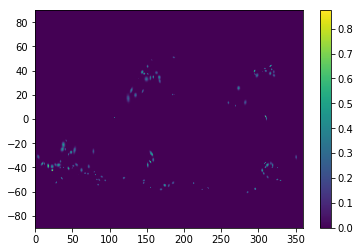

 0% [=>                   ]7% | Elapsed Time:189 s | Estimated Time:2840 s | Info: eddyn_109 |key:  eddyn_110 Level:  0.18000000000000002


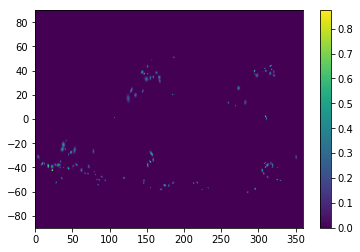

 0% [=>                   ]7% | Elapsed Time:190 s | Estimated Time:2829 s | Info: eddyn_110 |key:  eddyn_111 Level:  0.13


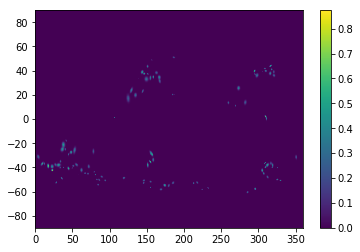

 0% [=>                   ]7% | Elapsed Time:192 s | Estimated Time:2834 s | Info: eddyn_111 |key:  eddyn_112 Level:  0.14


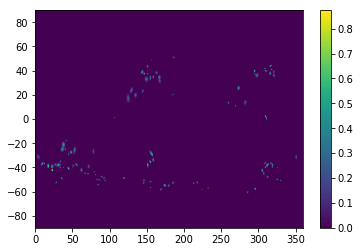

 0% [=>                   ]7% | Elapsed Time:194 s | Estimated Time:2838 s | Info: eddyn_112 |key:  eddyn_113 Level:  0.18000000000000002


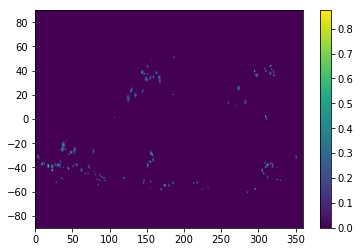

 0% [=>                   ]7% | Elapsed Time:196 s | Estimated Time:2842 s | Info: eddyn_113 |key:  eddyn_114 Level:  0.09


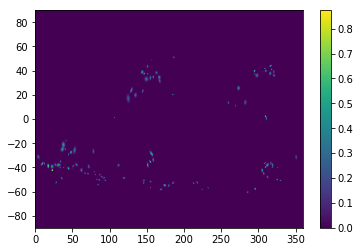

 0% [=>                   ]7% | Elapsed Time:197 s | Estimated Time:2832 s | Info: eddyn_114 |key:  eddyn_115 Level:  0.23


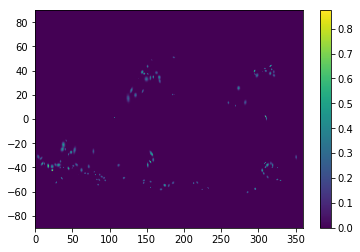

 0% [=>                   ]7% | Elapsed Time:199 s | Estimated Time:2836 s | Info: eddyn_115 |key:  eddyn_116 Level:  0.09


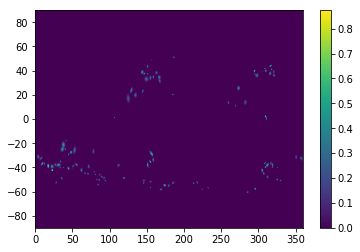

 0% [=>                   ]7% | Elapsed Time:201 s | Estimated Time:2840 s | Info: eddyn_116 |key:  eddyn_117 Level:  0.2


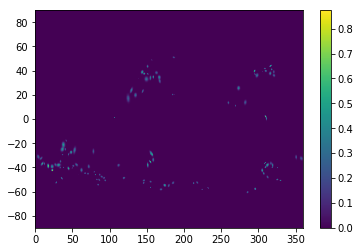

 0% [=>                   ]7% | Elapsed Time:202 s | Estimated Time:2830 s | Info: eddyn_117 |key:  eddyn_118 Level:  0.09


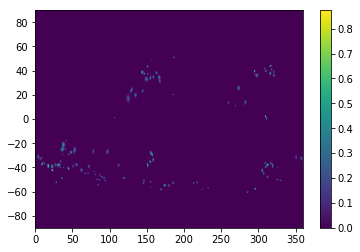

 0% [=>                   ]7% | Elapsed Time:204 s | Estimated Time:2834 s | Info: eddyn_118 |key:  eddyn_119 Level:  0.12


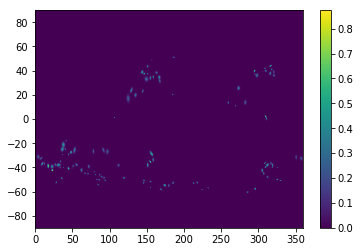

 0% [=>                   ]7% | Elapsed Time:206 s | Estimated Time:2838 s | Info: eddyn_119 |key:  eddyn_120 Level:  0.05


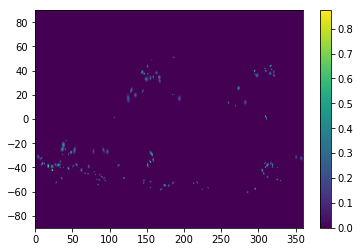

 0% [=>                   ]7% | Elapsed Time:208 s | Estimated Time:2842 s | Info: eddyn_120 |key:  eddyn_121 Level:  0.15000000000000002


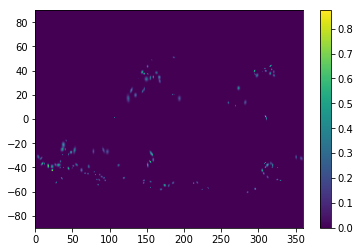

 0% [=>                   ]7% | Elapsed Time:209 s | Estimated Time:2832 s | Info: eddyn_121 |key:  eddyn_122 Level:  0.08


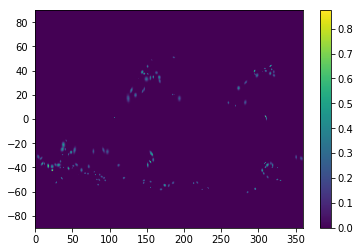

 0% [=>                   ]7% | Elapsed Time:211 s | Estimated Time:2836 s | Info: eddyn_122 |key:  eddyn_123 Level:  0.18000000000000002


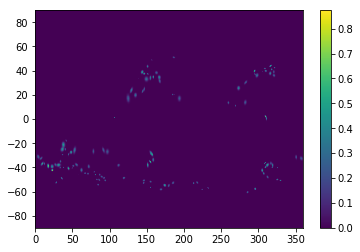

 0% [=>                   ]8% | Elapsed Time:213 s | Estimated Time:2839 s | Info: eddyn_123 |key:  eddyn_124 Level:  0.21000000000000002


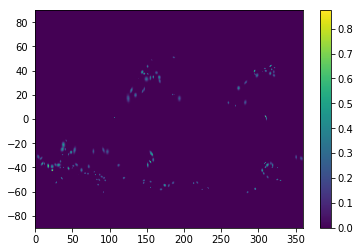

 0% [=>                   ]8% | Elapsed Time:215 s | Estimated Time:2843 s | Info: eddyn_124 |key:  eddyn_125 Level:  0.19


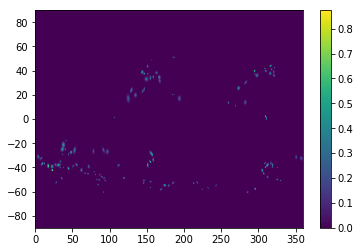

 0% [=>                   ]8% | Elapsed Time:216 s | Estimated Time:2834 s | Info: eddyn_125 |key:  eddyn_126 Level:  0.2


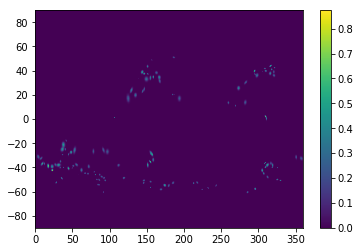

 0% [=>                   ]8% | Elapsed Time:218 s | Estimated Time:2837 s | Info: eddyn_126 |key:  eddyn_127 Level:  0.2


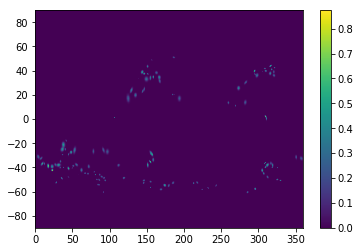

 0% [=>                   ]8% | Elapsed Time:220 s | Estimated Time:2841 s | Info: eddyn_127 |key:  eddyn_128 Level:  0.04


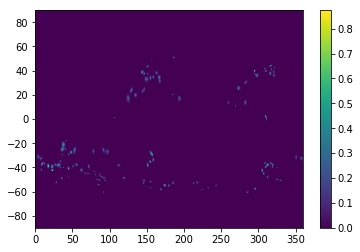

 0% [=>                   ]8% | Elapsed Time:221 s | Estimated Time:2832 s | Info: eddyn_128 |key:  eddyn_129 Level:  0.22


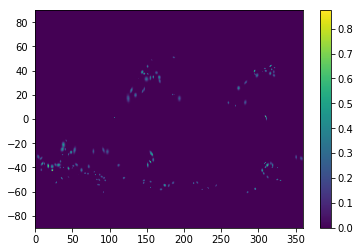

 0% [=>                   ]8% | Elapsed Time:223 s | Estimated Time:2836 s | Info: eddyn_129 |key:  eddyn_130 Level:  0.11


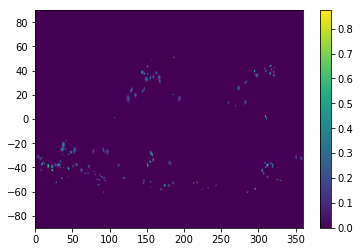

 0% [=>                   ]8% | Elapsed Time:225 s | Estimated Time:2839 s | Info: eddyn_130 |key:  eddyn_131 Level:  0.12


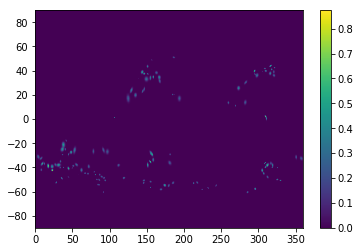

 0% [=>                   ]8% | Elapsed Time:226 s | Estimated Time:2830 s | Info: eddyn_131 |key:  eddyn_132 Level:  0.15000000000000002


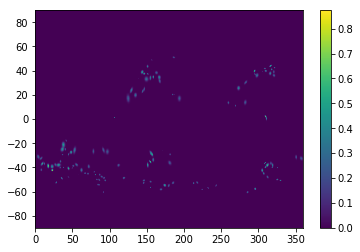

 0% [=>                   ]8% | Elapsed Time:228 s | Estimated Time:2834 s | Info: eddyn_132 |key:  eddyn_133 Level:  0.19


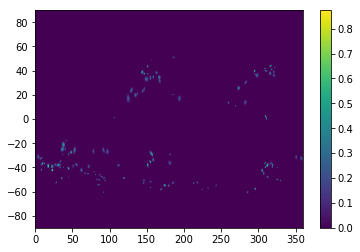

 0% [=>                   ]8% | Elapsed Time:230 s | Estimated Time:2837 s | Info: eddyn_133 |key:  eddyn_134 Level:  0.12


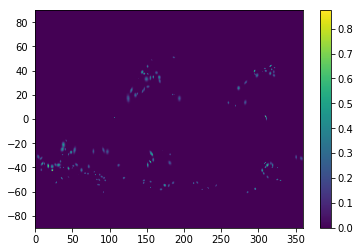

 0% [=>                   ]8% | Elapsed Time:232 s | Estimated Time:2841 s | Info: eddyn_134 |key:  eddyn_135 Level:  0.13


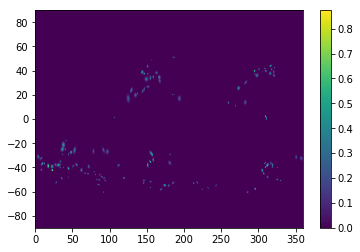

 0% [=>                   ]8% | Elapsed Time:233 s | Estimated Time:2832 s | Info: eddyn_135 |key:  eddyn_136 Level:  0.17


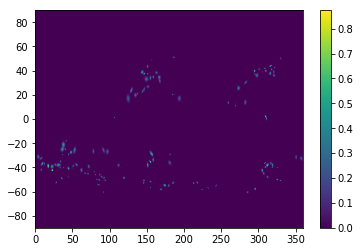

 0% [=>                   ]8% | Elapsed Time:235 s | Estimated Time:2835 s | Info: eddyn_136 |key:  eddyn_137 Level:  0.15000000000000002


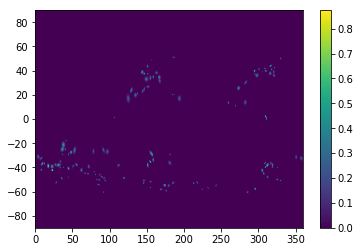

 0% [=>                   ]8% | Elapsed Time:237 s | Estimated Time:2839 s | Info: eddyn_137 |key:  eddyn_138 Level:  0.17


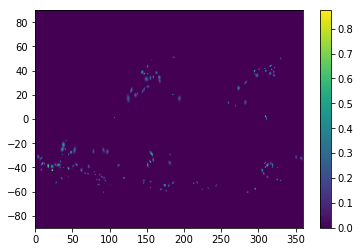

 0% [=>                   ]8% | Elapsed Time:238 s | Estimated Time:2830 s | Info: eddyn_138 |key:  eddyn_139 Level:  0.21000000000000002


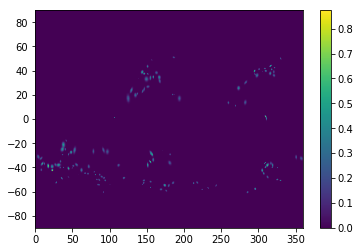

 0% [=>                   ]8% | Elapsed Time:240 s | Estimated Time:2834 s | Info: eddyn_139 |key:  eddyn_140 Level:  0.16


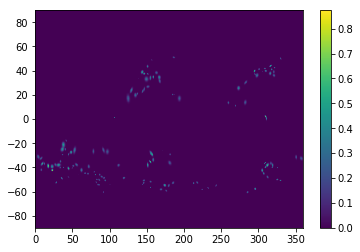

 0% [=>                   ]9% | Elapsed Time:242 s | Estimated Time:2837 s | Info: eddyn_140 |key:  eddyn_141 Level:  0.18000000000000002


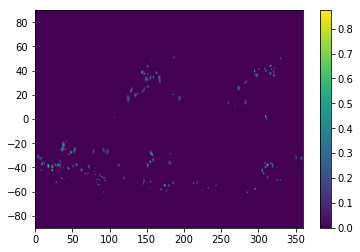

 0% [=>                   ]9% | Elapsed Time:243 s | Estimated Time:2829 s | Info: eddyn_141 |key:  eddyn_142 Level:  0.17


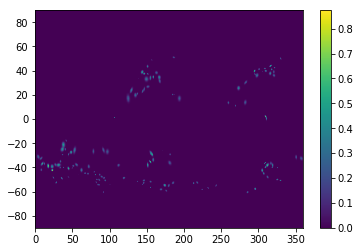

 0% [=>                   ]9% | Elapsed Time:245 s | Estimated Time:2832 s | Info: eddyn_142 |key:  eddyn_143 Level:  0.15000000000000002


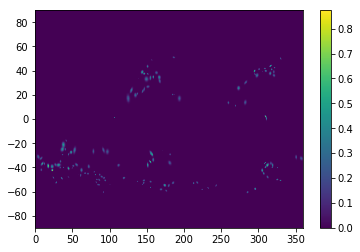

 0% [=>                   ]9% | Elapsed Time:247 s | Estimated Time:2835 s | Info: eddyn_143 |key:  eddyn_144 Level:  0.15000000000000002


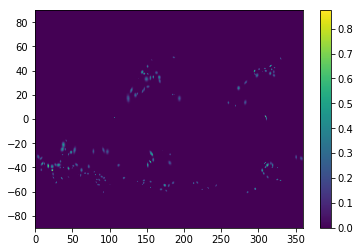

 0% [=>                   ]9% | Elapsed Time:248 s | Estimated Time:2827 s | Info: eddyn_144 |key:  eddyn_145 Level:  0.17


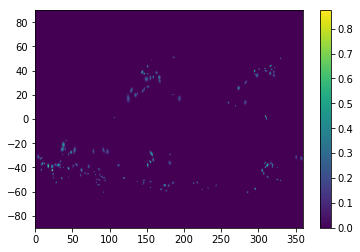

 0% [=>                   ]9% | Elapsed Time:250 s | Estimated Time:2830 s | Info: eddyn_145 |key:  eddyn_146 Level:  0.2


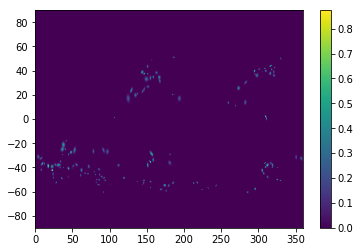

 0% [=>                   ]9% | Elapsed Time:252 s | Estimated Time:2834 s | Info: eddyn_146 |key:  eddyn_147 Level:  0.01


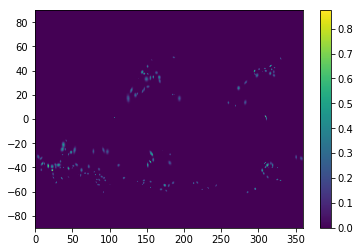

 0% [=>                   ]9% | Elapsed Time:253 s | Estimated Time:2826 s | Info: eddyn_147 |key:  eddyn_148 Level:  0.21000000000000002


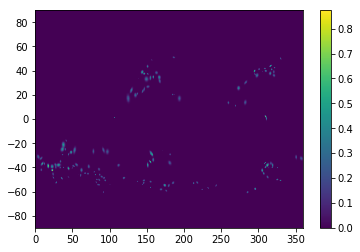

 0% [=>                   ]9% | Elapsed Time:255 s | Estimated Time:2829 s | Info: eddyn_148 |key:  eddyn_149 Level:  0.13


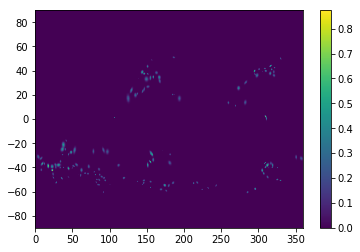

 0% [=>                   ]9% | Elapsed Time:257 s | Estimated Time:2832 s | Info: eddyn_149 |key:  eddyn_150 Level:  0.08


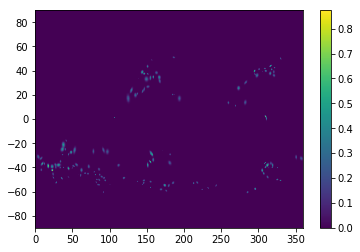

 0% [=>                   ]9% | Elapsed Time:258 s | Estimated Time:2824 s | Info: eddyn_150 |key:  eddyn_151 Level:  0.06999999999999999


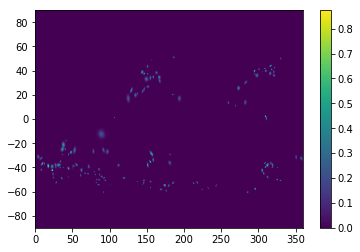

 0% [=>                   ]9% | Elapsed Time:260 s | Estimated Time:2828 s | Info: eddyn_151 |key:  eddyn_152 Level:  0.17


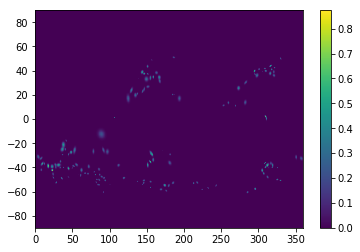

 0% [=>                   ]9% | Elapsed Time:262 s | Estimated Time:2831 s | Info: eddyn_152 |key:  eddyn_153 Level:  0.18000000000000002


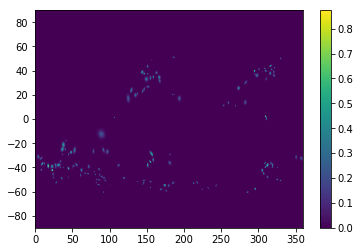

 0% [=>                   ]9% | Elapsed Time:264 s | Estimated Time:2834 s | Info: eddyn_153 |key:  eddyn_154 Level:  0.18000000000000002


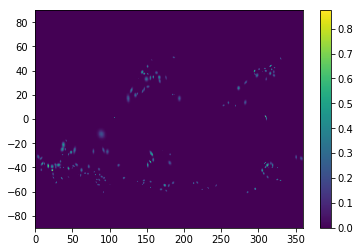

 0% [=>                   ]9% | Elapsed Time:265 s | Estimated Time:2826 s | Info: eddyn_154 |key:  eddyn_155 Level:  0.19


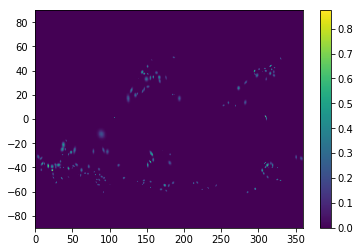

 0% [=>                   ]9% | Elapsed Time:267 s | Estimated Time:2829 s | Info: eddyn_155 |key:  eddyn_156 Level:  0.16


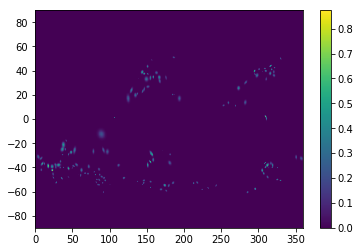

 0% [=>                   ]9% | Elapsed Time:269 s | Estimated Time:2832 s | Info: eddyn_156 |key:  eddyn_157 Level:  0.19


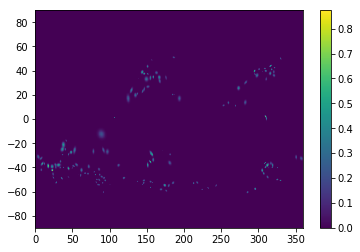

 0% [=>                   ]10% | Elapsed Time:270 s | Estimated Time:2825 s | Info: eddyn_157 |key:  eddyn_158 Level:  0.16


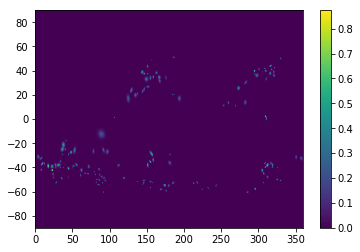

 0% [=>                   ]10% | Elapsed Time:272 s | Estimated Time:2828 s | Info: eddyn_158 |key:  eddyn_159 Level:  0.2


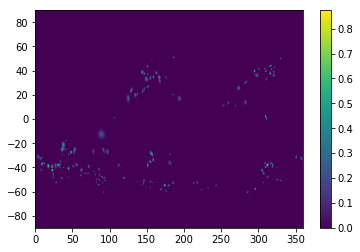

 0% [=>                   ]10% | Elapsed Time:274 s | Estimated Time:2831 s | Info: eddyn_159 |key:  eddyn_160 Level:  0.11


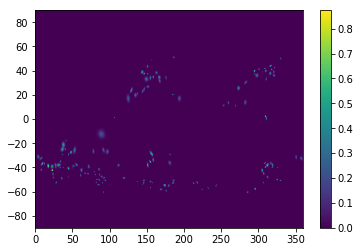

 0% [=>                   ]10% | Elapsed Time:275 s | Estimated Time:2823 s | Info: eddyn_160 |key:  eddyn_161 Level:  0.13


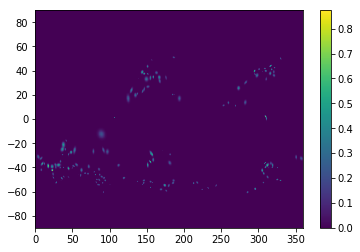

 0% [=>                   ]10% | Elapsed Time:277 s | Estimated Time:2826 s | Info: eddyn_161 |key:  eddyn_162 Level:  0.14


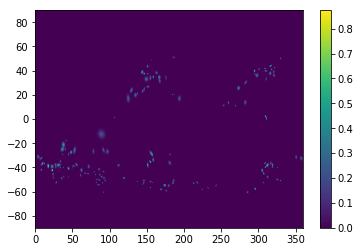

 0% [=>                   ]10% | Elapsed Time:279 s | Estimated Time:2829 s | Info: eddyn_162 |key:  eddyn_163 Level:  0.19


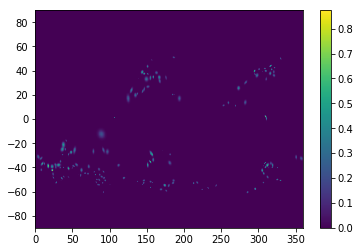

 0% [=>                   ]10% | Elapsed Time:281 s | Estimated Time:2832 s | Info: eddyn_163 |key:  eddyn_164 Level:  0.09


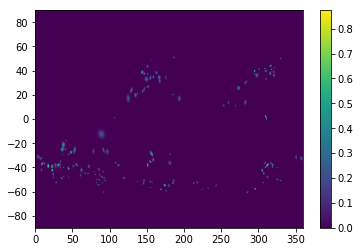

 0% [=>                   ]10% | Elapsed Time:282 s | Estimated Time:2825 s | Info: eddyn_164 |key:  eddyn_165 Level:  0.09999999999999999


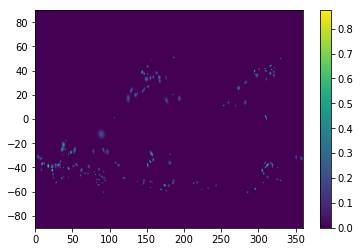

 0% [==>                  ]10% | Elapsed Time:284 s | Estimated Time:2828 s | Info: eddyn_165 |key:  eddyn_166 Level:  0.09


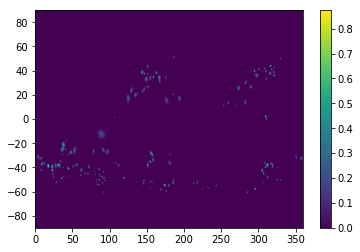

 0% [==>                  ]10% | Elapsed Time:286 s | Estimated Time:2831 s | Info: eddyn_166 |key:  eddyn_167 Level:  0.15000000000000002


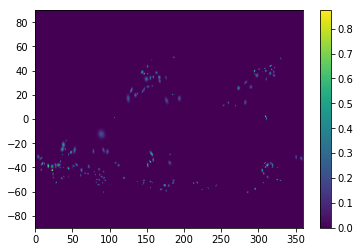

 0% [==>                  ]10% | Elapsed Time:287 s | Estimated Time:2824 s | Info: eddyn_167 |key:  eddyn_168 Level:  0.17


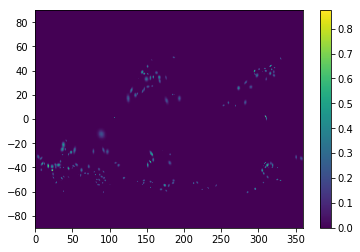

 0% [==>                  ]10% | Elapsed Time:289 s | Estimated Time:2827 s | Info: eddyn_168 |key:  eddyn_169 Level:  0.19


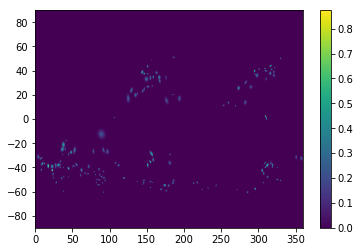

 0% [==>                  ]10% | Elapsed Time:291 s | Estimated Time:2830 s | Info: eddyn_169 |key:  eddyn_170 Level:  0.16


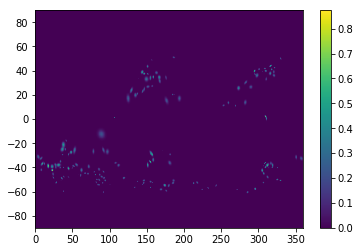

 0% [==>                  ]10% | Elapsed Time:292 s | Estimated Time:2823 s | Info: eddyn_170 |key:  eddyn_171 Level:  0.17


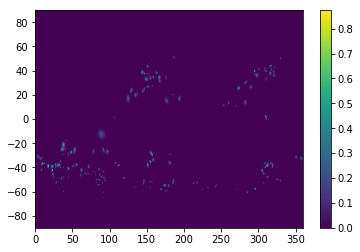

 0% [==>                  ]10% | Elapsed Time:294 s | Estimated Time:2825 s | Info: eddyn_171 |key:  eddyn_172 Level:  0.18000000000000002


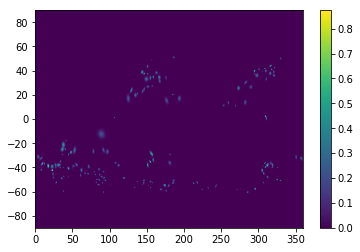

 0% [==>                  ]10% | Elapsed Time:296 s | Estimated Time:2828 s | Info: eddyn_172 |key:  eddyn_173 Level:  0.13


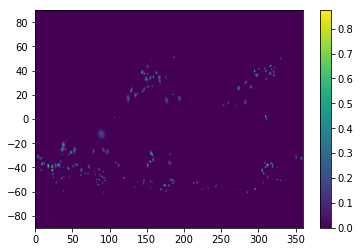

 0% [==>                  ]11% | Elapsed Time:297 s | Estimated Time:2822 s | Info: eddyn_173 |key:  eddyn_174 Level:  0.09999999999999999


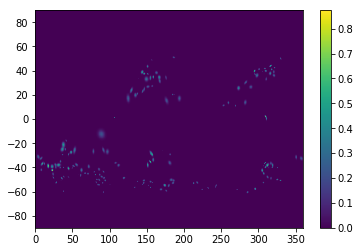

 0% [==>                  ]11% | Elapsed Time:299 s | Estimated Time:2824 s | Info: eddyn_174 |key:  eddyn_175 Level:  0.12


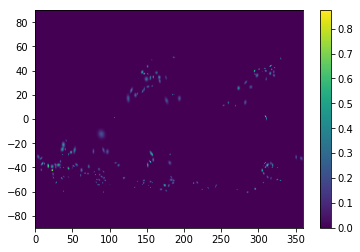

 0% [==>                  ]11% | Elapsed Time:301 s | Estimated Time:2827 s | Info: eddyn_175 |key:  eddyn_176 Level:  0.14


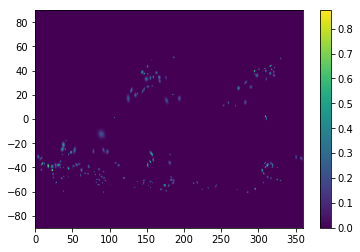

 0% [==>                  ]11% | Elapsed Time:303 s | Estimated Time:2830 s | Info: eddyn_176 |key:  eddyn_177 Level:  0.19


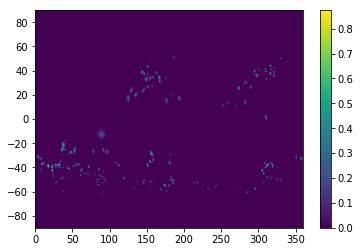

 0% [==>                  ]11% | Elapsed Time:304 s | Estimated Time:2823 s | Info: eddyn_177 |key:  eddyn_178 Level:  0.13


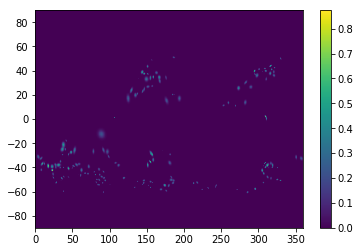

 0% [==>                  ]11% | Elapsed Time:306 s | Estimated Time:2826 s | Info: eddyn_178 |key:  eddyn_179 Level:  0.08


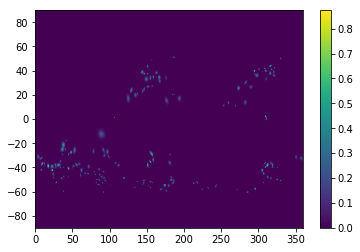

 0% [==>                  ]11% | Elapsed Time:308 s | Estimated Time:2828 s | Info: eddyn_179 |key:  eddyn_180 Level:  0.04


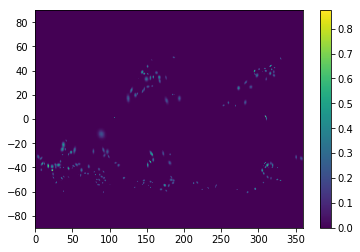

 0% [==>                  ]11% | Elapsed Time:309 s | Estimated Time:2822 s | Info: eddyn_180 |key:  eddyn_181 Level:  0.12


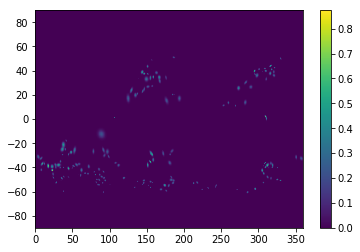

 0% [==>                  ]11% | Elapsed Time:311 s | Estimated Time:2825 s | Info: eddyn_181 |key:  eddyn_182 Level:  0.13


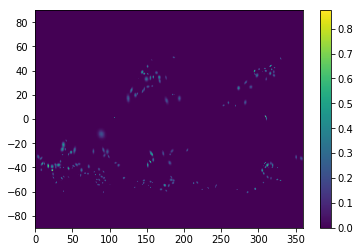

 0% [==>                  ]11% | Elapsed Time:313 s | Estimated Time:2827 s | Info: eddyn_182 |key:  eddyn_183 Level:  0.16


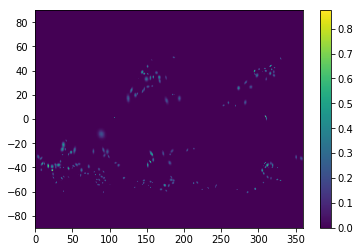

 0% [==>                  ]11% | Elapsed Time:315 s | Estimated Time:2830 s | Info: eddyn_183 |key:  eddyn_184 Level:  0.17


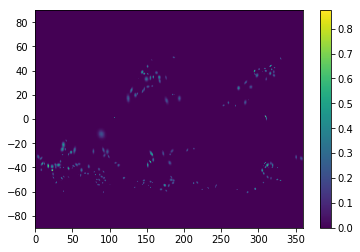

 0% [==>                  ]11% | Elapsed Time:316 s | Estimated Time:2824 s | Info: eddyn_184 |key:  eddyn_185 Level:  0.13


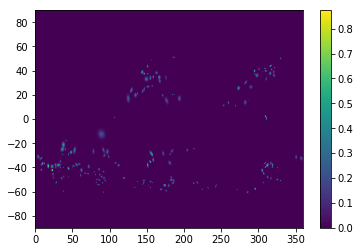

 0% [==>                  ]11% | Elapsed Time:318 s | Estimated Time:2826 s | Info: eddyn_185 |key:  eddyn_186 Level:  0.12


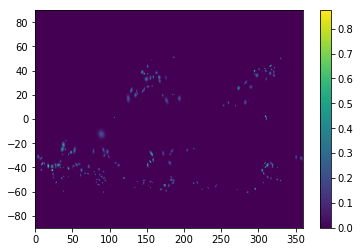

 0% [==>                  ]11% | Elapsed Time:320 s | Estimated Time:2829 s | Info: eddyn_186 |key:  eddyn_187 Level:  0.09999999999999999


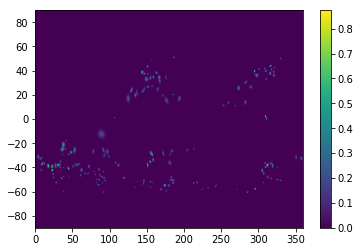

 0% [==>                  ]11% | Elapsed Time:321 s | Estimated Time:2822 s | Info: eddyn_187 |key:  eddyn_188 Level:  0.14


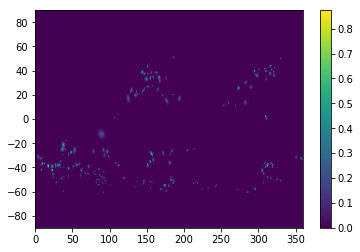

 0% [==>                  ]11% | Elapsed Time:323 s | Estimated Time:2825 s | Info: eddyn_188 |key:  eddyn_189 Level:  0.17


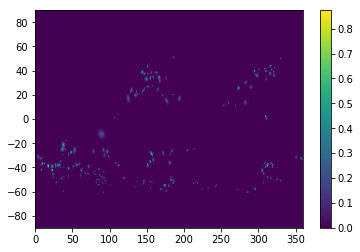

 0% [==>                  ]11% | Elapsed Time:325 s | Estimated Time:2828 s | Info: eddyn_189 |key:  eddyn_190 Level:  0.17


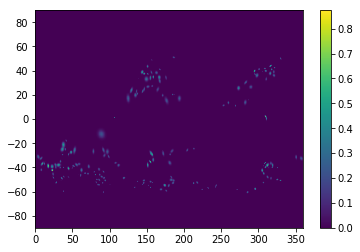

 0% [==>                  ]12% | Elapsed Time:326 s | Estimated Time:2821 s | Info: eddyn_190 |key:  eddyn_191 Level:  0.09999999999999999


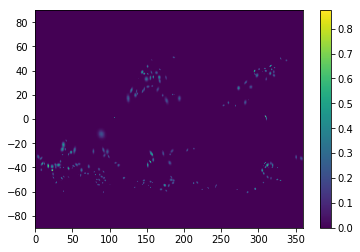

 0% [==>                  ]12% | Elapsed Time:328 s | Estimated Time:2824 s | Info: eddyn_191 |key:  eddyn_192 Level:  0.17


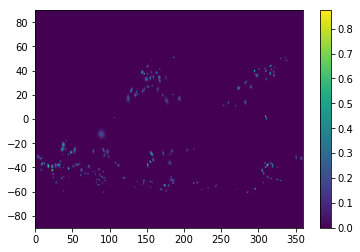

 0% [==>                  ]12% | Elapsed Time:330 s | Estimated Time:2826 s | Info: eddyn_192 |key:  eddyn_193 Level:  0.16


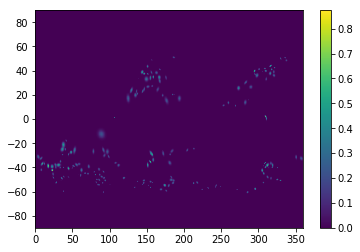

 0% [==>                  ]12% | Elapsed Time:332 s | Estimated Time:2829 s | Info: eddyn_193 |key:  eddyn_194 Level:  0.14


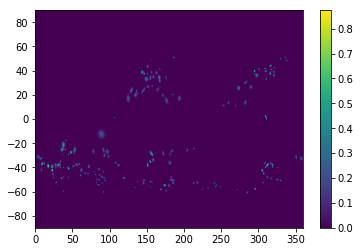

 0% [==>                  ]12% | Elapsed Time:333 s | Estimated Time:2823 s | Info: eddyn_194 |key:  eddyn_195 Level:  0.17


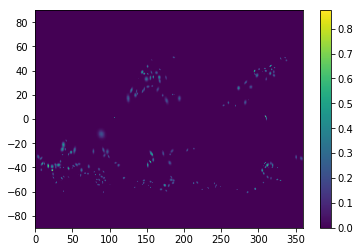

 0% [==>                  ]12% | Elapsed Time:335 s | Estimated Time:2825 s | Info: eddyn_195 |key:  eddyn_196 Level:  0.13


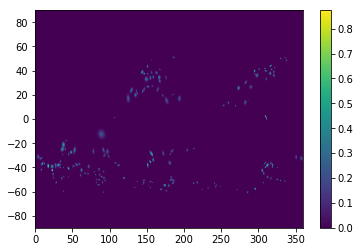

 0% [==>                  ]12% | Elapsed Time:337 s | Estimated Time:2828 s | Info: eddyn_196 |key:  eddyn_197 Level:  0.17


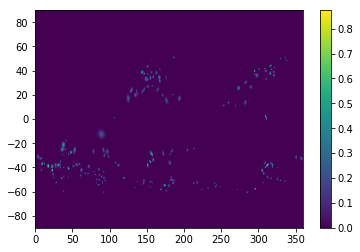

 0% [==>                  ]12% | Elapsed Time:338 s | Estimated Time:2822 s | Info: eddyn_197 |key:  eddyn_198 Level:  0.14


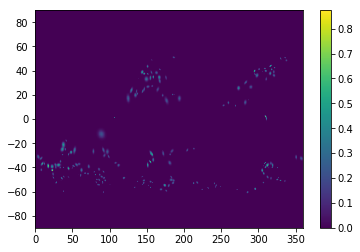

 0% [==>                  ]12% | Elapsed Time:340 s | Estimated Time:2824 s | Info: eddyn_198 |key:  eddyn_199 Level:  0.18000000000000002


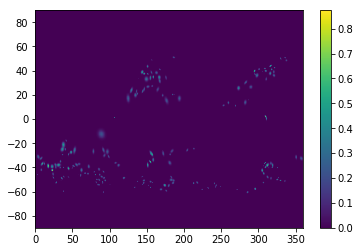

 0% [==>                  ]12% | Elapsed Time:342 s | Estimated Time:2827 s | Info: eddyn_199 |key:  eddyn_200 Level:  0.18000000000000002


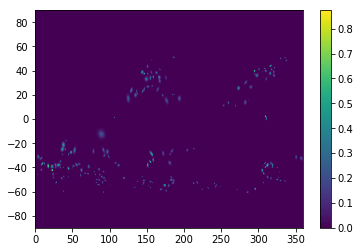

 0% [==>                  ]12% | Elapsed Time:343 s | Estimated Time:2821 s | Info: eddyn_200 |key:  eddyn_201 Level:  0.17


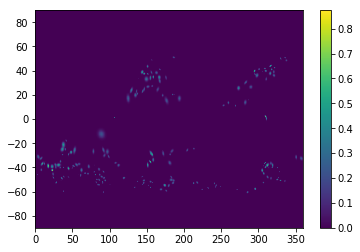

 0% [==>                  ]12% | Elapsed Time:345 s | Estimated Time:2823 s | Info: eddyn_201 |key:  eddyn_202 Level:  0.11


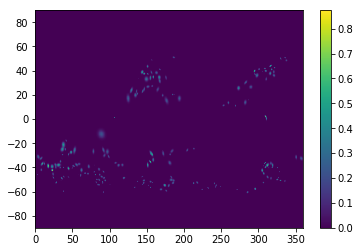

 0% [==>                  ]12% | Elapsed Time:347 s | Estimated Time:2826 s | Info: eddyn_202 |key:  eddyn_203 Level:  0.18000000000000002


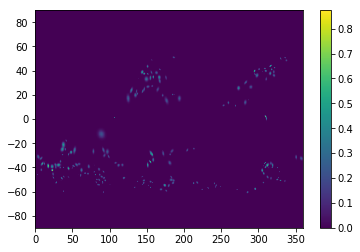

 0% [==>                  ]12% | Elapsed Time:348 s | Estimated Time:2820 s | Info: eddyn_203 |key:  eddyn_204 Level:  0.060000000000000005


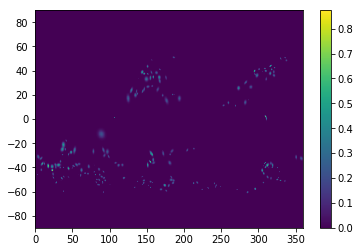

 0% [==>                  ]12% | Elapsed Time:350 s | Estimated Time:2822 s | Info: eddyn_204 |key:  eddyn_205 Level:  0.06999999999999999


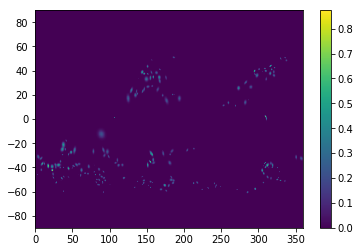

 0% [==>                  ]12% | Elapsed Time:352 s | Estimated Time:2825 s | Info: eddyn_205 |key:  eddyn_206 Level:  0.15000000000000002


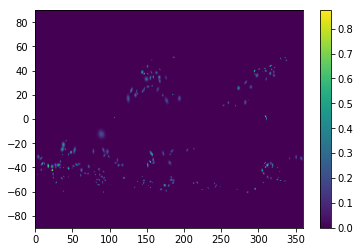

 0% [==>                  ]13% | Elapsed Time:353 s | Estimated Time:2819 s | Info: eddyn_206 |key:  eddyn_207 Level:  0.12


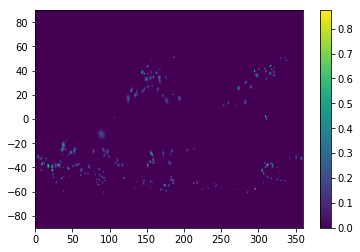

 0% [==>                  ]13% | Elapsed Time:355 s | Estimated Time:2821 s | Info: eddyn_207 |key:  eddyn_208 Level:  0.13


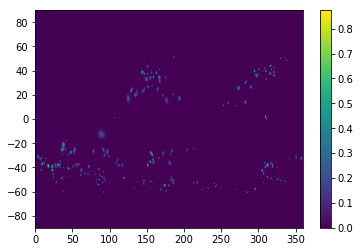

 0% [==>                  ]13% | Elapsed Time:357 s | Estimated Time:2824 s | Info: eddyn_208 |key:  eddyn_209 Level:  0.06999999999999999


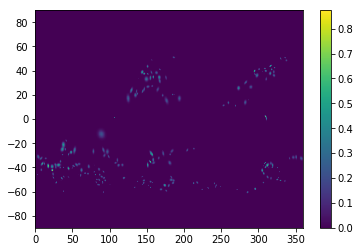

 0% [==>                  ]13% | Elapsed Time:358 s | Estimated Time:2818 s | Info: eddyn_209 |key:  eddyn_210 Level:  0.03


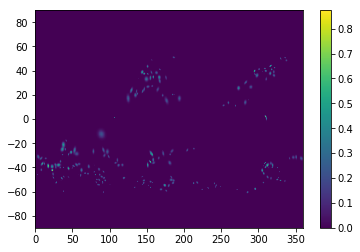

 0% [==>                  ]13% | Elapsed Time:360 s | Estimated Time:2820 s | Info: eddyn_210 |key:  eddyn_211 Level:  0.08


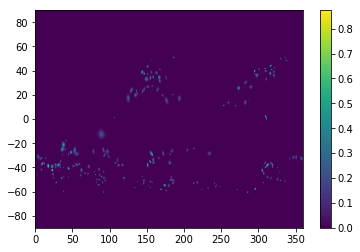

 0% [==>                  ]13% | Elapsed Time:362 s | Estimated Time:2823 s | Info: eddyn_211 |key:  eddyn_212 Level:  0.09


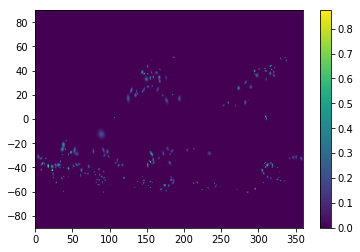

 0% [==>                  ]13% | Elapsed Time:363 s | Estimated Time:2817 s | Info: eddyn_212 |key:  eddyn_213 Level:  0.17


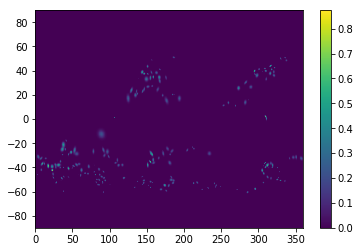

 0% [==>                  ]13% | Elapsed Time:365 s | Estimated Time:2819 s | Info: eddyn_213 |key:  eddyn_214 Level:  0.08


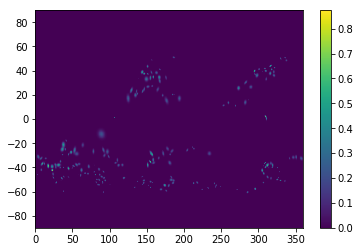

 0% [==>                  ]13% | Elapsed Time:367 s | Estimated Time:2822 s | Info: eddyn_214 |key:  eddyn_215 Level:  0.060000000000000005


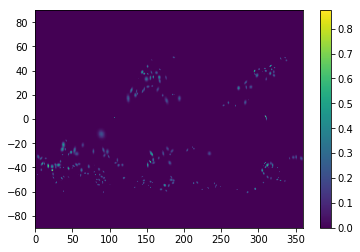

 0% [==>                  ]13% | Elapsed Time:368 s | Estimated Time:2816 s | Info: eddyn_215 |key:  eddyn_216 Level:  0.14


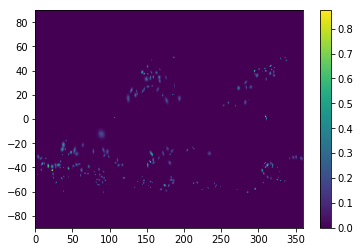

 0% [==>                  ]13% | Elapsed Time:370 s | Estimated Time:2818 s | Info: eddyn_216 |key:  eddyn_217 Level:  0.17


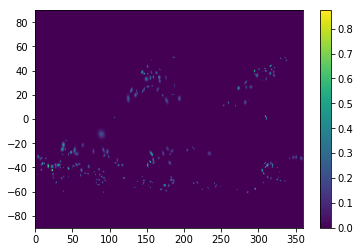

 0% [==>                  ]13% | Elapsed Time:372 s | Estimated Time:2821 s | Info: eddyn_217 |key:  eddyn_218 Level:  0.17


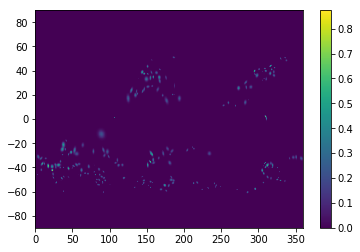

 0% [==>                  ]13% | Elapsed Time:373 s | Estimated Time:2815 s | Info: eddyn_218 |key:  eddyn_219 Level:  0.18000000000000002


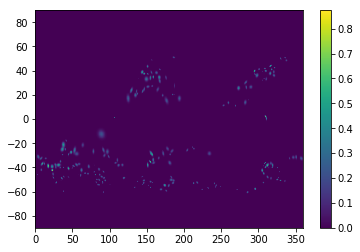

 0% [==>                  ]13% | Elapsed Time:375 s | Estimated Time:2818 s | Info: eddyn_219 |key:  eddyn_220 Level:  0.17


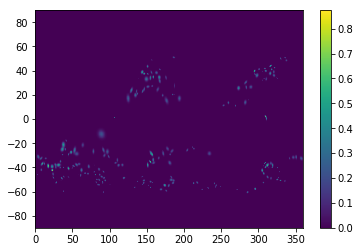

 0% [==>                  ]13% | Elapsed Time:377 s | Estimated Time:2820 s | Info: eddyn_220 |key:  eddyn_221 Level:  0.12


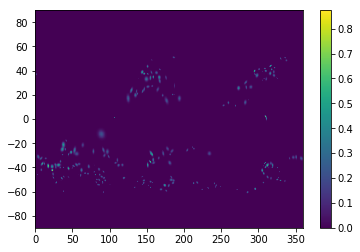

 0% [==>                  ]13% | Elapsed Time:379 s | Estimated Time:2822 s | Info: eddyn_221 |key:  eddyn_222 Level:  0.17


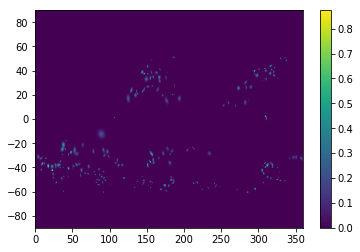

 0% [==>                  ]13% | Elapsed Time:380 s | Estimated Time:2817 s | Info: eddyn_222 |key:  eddyn_223 Level:  0.17


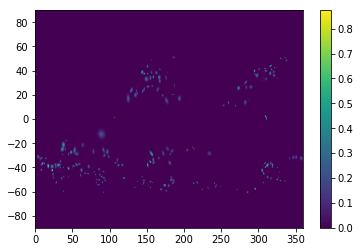

 0% [==>                  ]14% | Elapsed Time:382 s | Estimated Time:2819 s | Info: eddyn_223 |key:  eddyn_224 Level:  0.15000000000000002


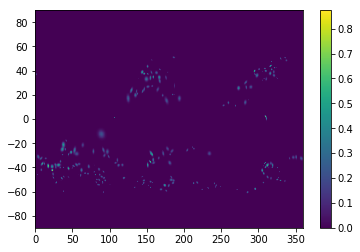

 0% [==>                  ]14% | Elapsed Time:384 s | Estimated Time:2821 s | Info: eddyn_224 |key:  eddyn_225 Level:  0.15000000000000002


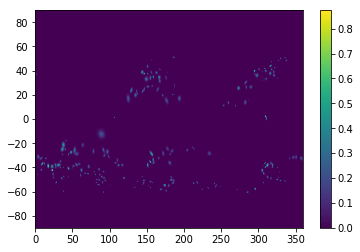

 0% [==>                  ]14% | Elapsed Time:386 s | Estimated Time:2823 s | Info: eddyn_225 |key:  eddyn_226 Level:  0.09999999999999999


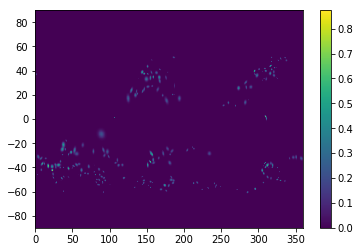

 0% [==>                  ]14% | Elapsed Time:387 s | Estimated Time:2818 s | Info: eddyn_226 |key:  eddyn_227 Level:  0.15000000000000002


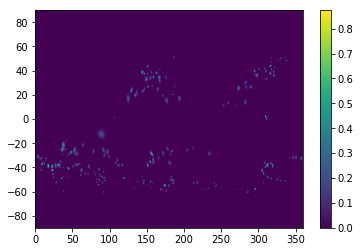

 0% [==>                  ]14% | Elapsed Time:389 s | Estimated Time:2820 s | Info: eddyn_227 |key:  eddyn_228 Level:  0.16


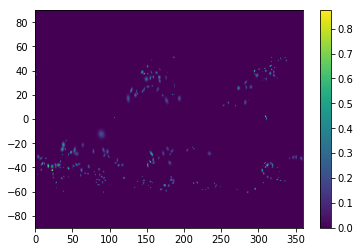

 0% [==>                  ]14% | Elapsed Time:391 s | Estimated Time:2822 s | Info: eddyn_228 |key:  eddyn_229 Level:  0.13


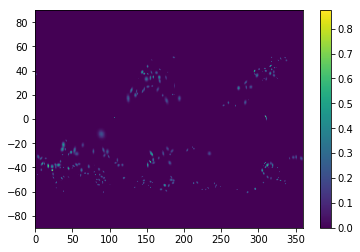

 0% [==>                  ]14% | Elapsed Time:392 s | Estimated Time:2817 s | Info: eddyn_229 |key:  eddyn_230 Level:  0.13


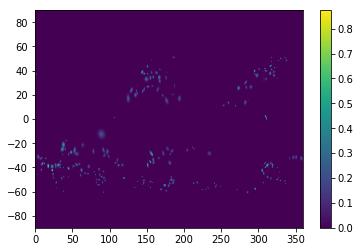

 0% [==>                  ]14% | Elapsed Time:394 s | Estimated Time:2819 s | Info: eddyn_230 |key:  eddyn_231 Level:  0.12


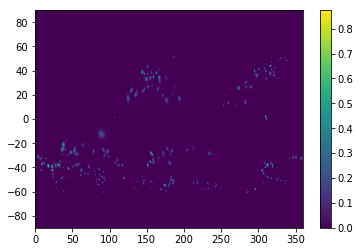

 0% [==>                  ]14% | Elapsed Time:396 s | Estimated Time:2822 s | Info: eddyn_231 |key:  eddyn_232 Level:  0.09999999999999999


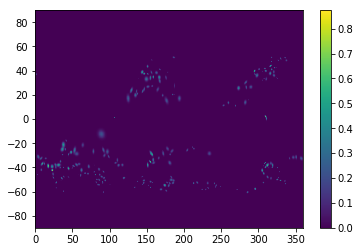

 0% [==>                  ]14% | Elapsed Time:398 s | Estimated Time:2824 s | Info: eddyn_232 |key:  eddyn_233 Level:  0.17


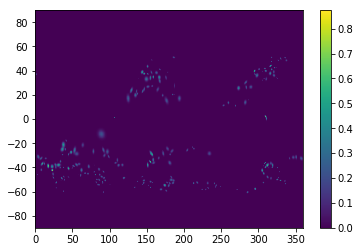

 0% [==>                  ]14% | Elapsed Time:399 s | Estimated Time:2819 s | Info: eddyn_233 |key:  eddyn_234 Level:  0.12


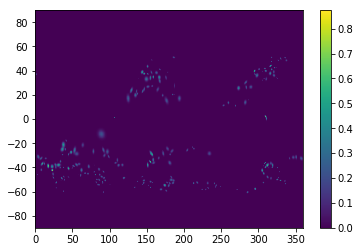

 0% [==>                  ]14% | Elapsed Time:401 s | Estimated Time:2821 s | Info: eddyn_234 |key:  eddyn_235 Level:  0.11


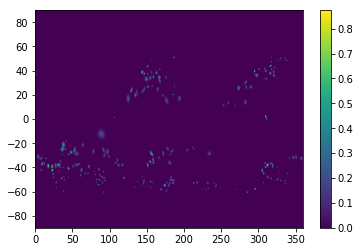

 0% [==>                  ]14% | Elapsed Time:403 s | Estimated Time:2823 s | Info: eddyn_235 |key:  eddyn_236 Level:  0.16


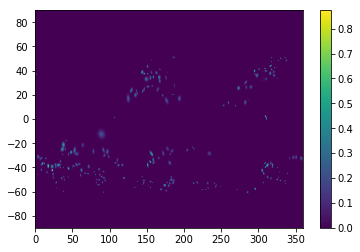

 0% [==>                  ]14% | Elapsed Time:404 s | Estimated Time:2818 s | Info: eddyn_236 |key:  eddyn_237 Level:  0.11


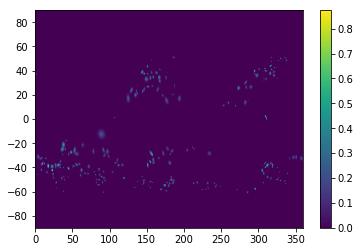

 0% [==>                  ]14% | Elapsed Time:406 s | Estimated Time:2820 s | Info: eddyn_237 |key:  eddyn_238 Level:  0.12


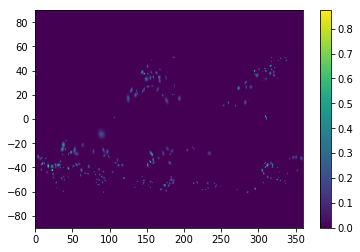

 0% [==>                  ]14% | Elapsed Time:408 s | Estimated Time:2822 s | Info: eddyn_238 |key:  eddyn_239 Level:  0.09999999999999999


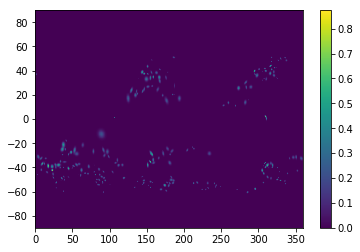

 0% [==>                  ]15% | Elapsed Time:410 s | Estimated Time:2824 s | Info: eddyn_239 |key:  eddyn_240 Level:  0.12


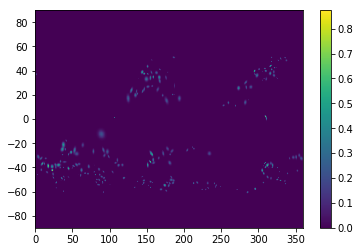

 0% [==>                  ]15% | Elapsed Time:411 s | Estimated Time:2819 s | Info: eddyn_240 |key:  eddyn_241 Level:  0.04


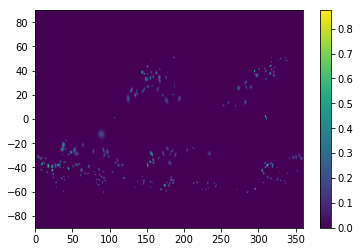

 0% [==>                  ]15% | Elapsed Time:413 s | Estimated Time:2821 s | Info: eddyn_241 |key:  eddyn_242 Level:  0.13


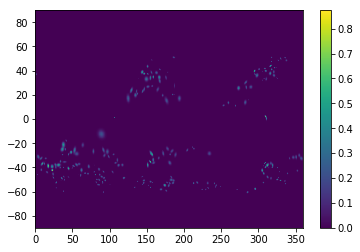

 0% [==>                  ]15% | Elapsed Time:415 s | Estimated Time:2823 s | Info: eddyn_242 |key:  eddyn_243 Level:  0.060000000000000005


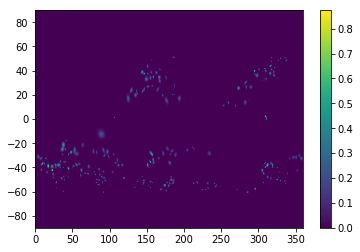

 0% [==>                  ]15% | Elapsed Time:416 s | Estimated Time:2818 s | Info: eddyn_243 |key:  eddyn_244 Level:  0.14


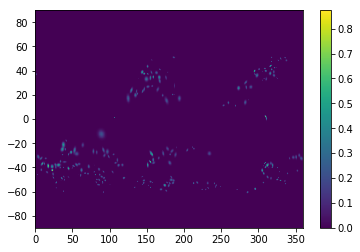

 0% [==>                  ]15% | Elapsed Time:418 s | Estimated Time:2820 s | Info: eddyn_244 |key:  eddyn_245 Level:  0.09999999999999999


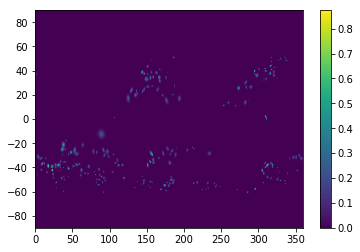

 0% [==>                  ]15% | Elapsed Time:420 s | Estimated Time:2822 s | Info: eddyn_245 |key:  eddyn_246 Level:  0.16


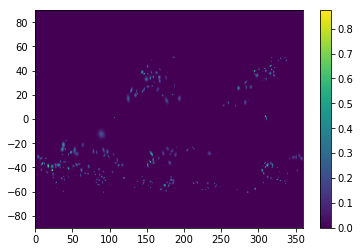

 0% [==>                  ]15% | Elapsed Time:422 s | Estimated Time:2824 s | Info: eddyn_246 |key:  eddyn_247 Level:  0.09999999999999999


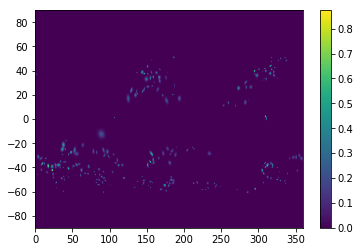

 0% [===>                 ]15% | Elapsed Time:423 s | Estimated Time:2819 s | Info: eddyn_247 |key:  eddyn_248 Level:  0.060000000000000005


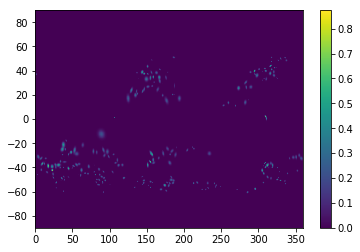

 0% [===>                 ]15% | Elapsed Time:425 s | Estimated Time:2821 s | Info: eddyn_248 |key:  eddyn_249 Level:  0.11


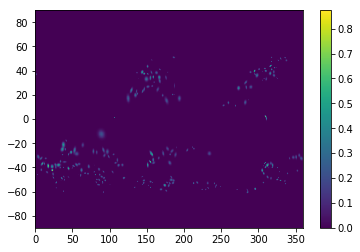

 0% [===>                 ]15% | Elapsed Time:427 s | Estimated Time:2823 s | Info: eddyn_249 |key:  eddyn_250 Level:  0.08


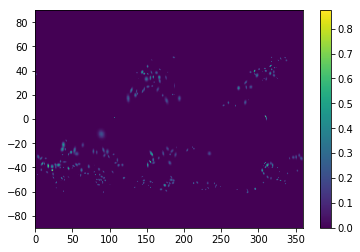

 0% [===>                 ]15% | Elapsed Time:428 s | Estimated Time:2819 s | Info: eddyn_250 |key:  eddyn_251 Level:  0.13


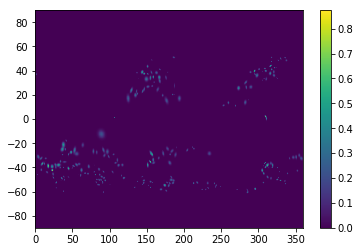

 0% [===>                 ]15% | Elapsed Time:430 s | Estimated Time:2821 s | Info: eddyn_251 |key:  eddyn_252 Level:  0.05


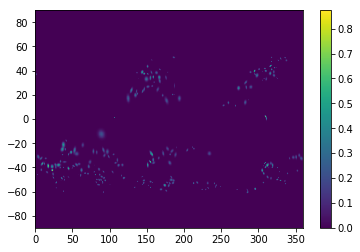

 0% [===>                 ]15% | Elapsed Time:432 s | Estimated Time:2823 s | Info: eddyn_252 |key:  eddyn_253 Level:  0.13


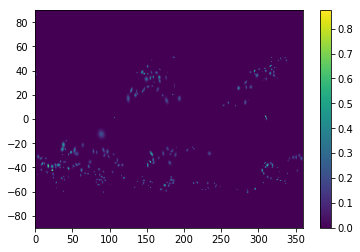

 0% [===>                 ]15% | Elapsed Time:434 s | Estimated Time:2824 s | Info: eddyn_253 |key:  eddyn_254 Level:  0.06999999999999999


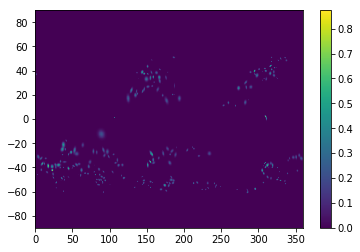

 0% [===>                 ]15% | Elapsed Time:435 s | Estimated Time:2820 s | Info: eddyn_254 |key:  eddyn_255 Level:  0.05


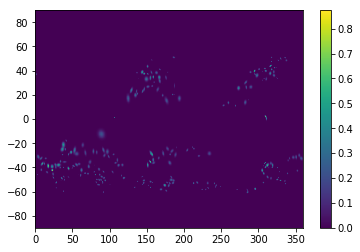

 0% [===>                 ]15% | Elapsed Time:437 s | Estimated Time:2822 s | Info: eddyn_255 |key:  eddyn_256 Level:  0.06999999999999999


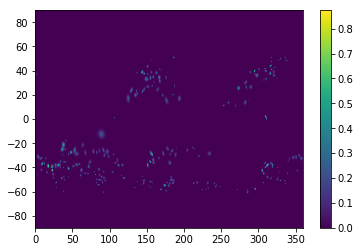

 0% [===>                 ]16% | Elapsed Time:439 s | Estimated Time:2824 s | Info: eddyn_256 |key:  eddyn_257 Level:  0.09


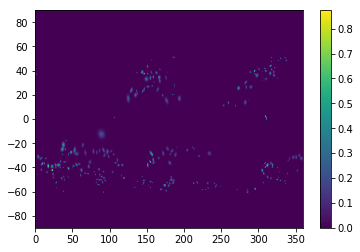

 0% [===>                 ]16% | Elapsed Time:440 s | Estimated Time:2819 s | Info: eddyn_257 |key:  eddyn_258 Level:  0.12


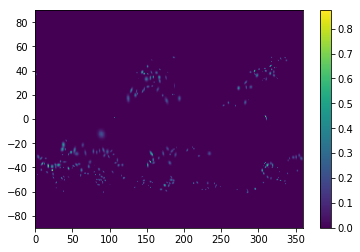

 0% [===>                 ]16% | Elapsed Time:442 s | Estimated Time:2821 s | Info: eddyn_258 |key:  eddyn_259 Level:  0.09999999999999999


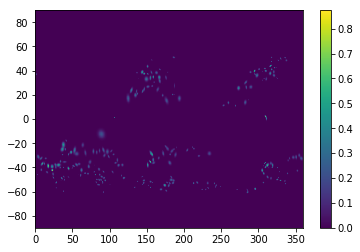

 0% [===>                 ]16% | Elapsed Time:444 s | Estimated Time:2823 s | Info: eddyn_259 |key:  eddyn_260 Level:  0.05


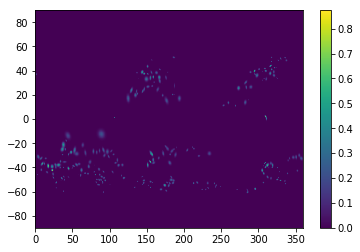

 0% [===>                 ]16% | Elapsed Time:445 s | Estimated Time:2818 s | Info: eddyn_260 |key:  eddyn_261 Level:  0.16


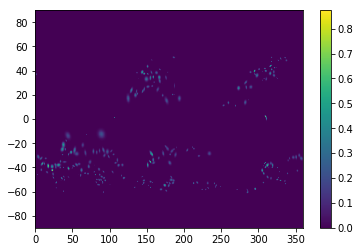

 0% [===>                 ]16% | Elapsed Time:447 s | Estimated Time:2820 s | Info: eddyn_261 |key:  eddyn_262 Level:  0.15000000000000002


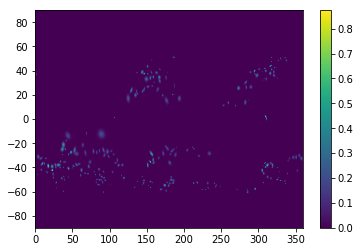

 0% [===>                 ]16% | Elapsed Time:449 s | Estimated Time:2822 s | Info: eddyn_262 |key:  eddyn_263 Level:  0.06999999999999999


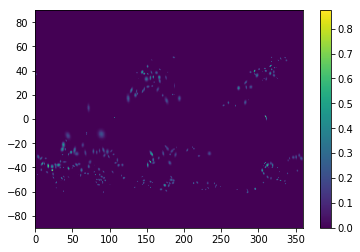

 0% [===>                 ]16% | Elapsed Time:450 s | Estimated Time:2818 s | Info: eddyn_263 |key:  eddyn_264 Level:  0.13


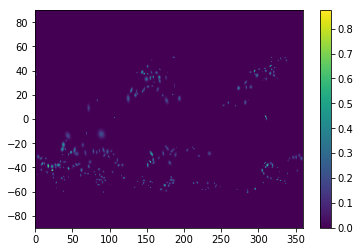

 0% [===>                 ]16% | Elapsed Time:452 s | Estimated Time:2819 s | Info: eddyn_264 |key:  eddyn_265 Level:  0.09


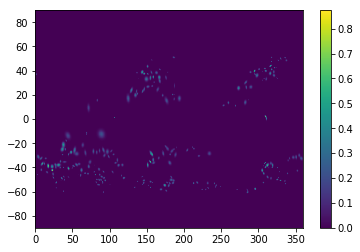

 0% [===>                 ]16% | Elapsed Time:454 s | Estimated Time:2821 s | Info: eddyn_265 |key:  eddyn_266 Level:  0.16


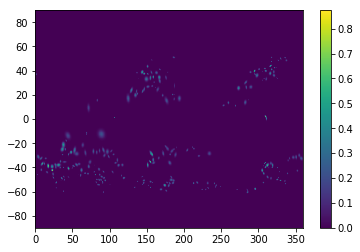

 0% [===>                 ]16% | Elapsed Time:455 s | Estimated Time:2817 s | Info: eddyn_266 |key:  eddyn_267 Level:  0.16


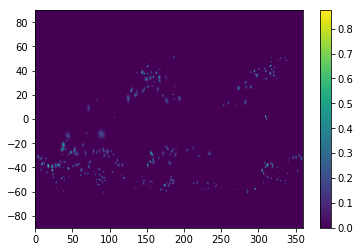

 0% [===>                 ]16% | Elapsed Time:457 s | Estimated Time:2819 s | Info: eddyn_267 |key:  eddyn_268 Level:  0.08


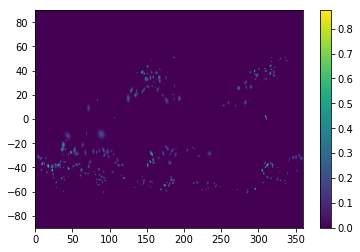

 0% [===>                 ]16% | Elapsed Time:459 s | Estimated Time:2821 s | Info: eddyn_268 |key:  eddyn_269 Level:  0.16


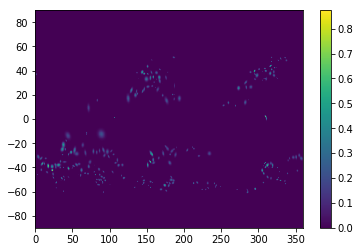

 0% [===>                 ]16% | Elapsed Time:460 s | Estimated Time:2816 s | Info: eddyn_269 |key:  eddyn_270 Level:  0.09999999999999999


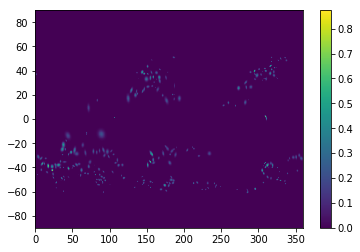

 0% [===>                 ]16% | Elapsed Time:462 s | Estimated Time:2818 s | Info: eddyn_270 |key:  eddyn_271 Level:  0.12


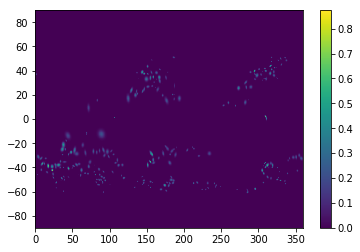

 0% [===>                 ]16% | Elapsed Time:464 s | Estimated Time:2820 s | Info: eddyn_271 |key:  eddyn_272 Level:  0.09999999999999999


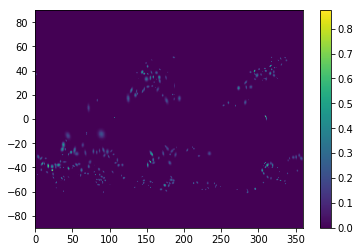

 0% [===>                 ]17% | Elapsed Time:466 s | Estimated Time:2822 s | Info: eddyn_272 |key:  eddyn_273 Level:  0.14


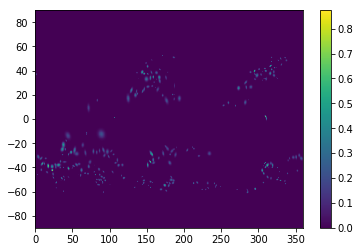

 0% [===>                 ]17% | Elapsed Time:467 s | Estimated Time:2817 s | Info: eddyn_273 |key:  eddyn_274 Level:  0.12


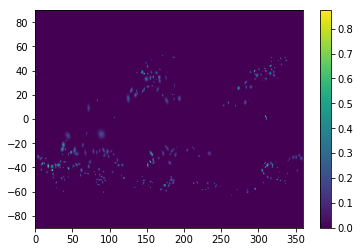

 0% [===>                 ]17% | Elapsed Time:469 s | Estimated Time:2819 s | Info: eddyn_274 |key:  eddyn_275 Level:  0.11


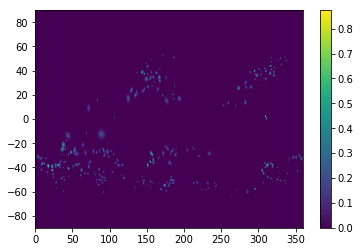

 0% [===>                 ]17% | Elapsed Time:471 s | Estimated Time:2821 s | Info: eddyn_275 |key:  eddyn_276 Level:  0.13


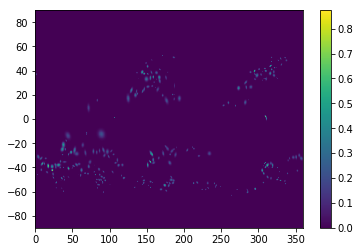

 0% [===>                 ]17% | Elapsed Time:472 s | Estimated Time:2817 s | Info: eddyn_276 |key:  eddyn_277 Level:  0.09999999999999999


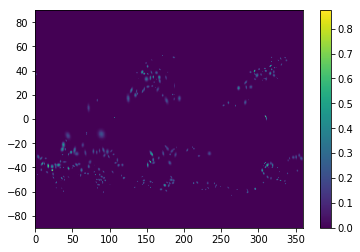

 0% [===>                 ]17% | Elapsed Time:474 s | Estimated Time:2818 s | Info: eddyn_277 |key:  eddyn_278 Level:  0.09


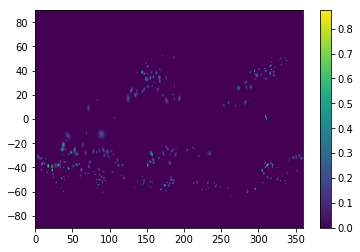

 0% [===>                 ]17% | Elapsed Time:476 s | Estimated Time:2820 s | Info: eddyn_278 |key:  eddyn_279 Level:  0.06999999999999999


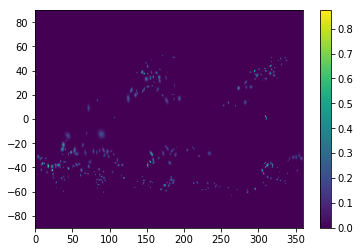

 0% [===>                 ]17% | Elapsed Time:477 s | Estimated Time:2816 s | Info: eddyn_279 |key:  eddyn_280 Level:  0.12


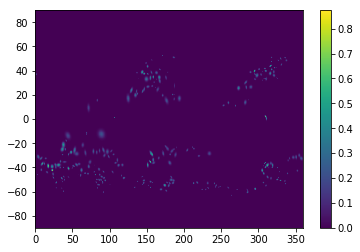

 0% [===>                 ]17% | Elapsed Time:479 s | Estimated Time:2818 s | Info: eddyn_280 |key:  eddyn_281 Level:  0.08


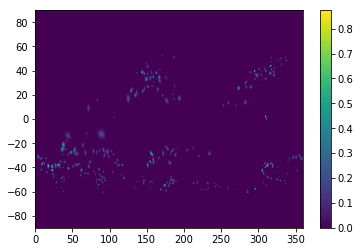

 0% [===>                 ]17% | Elapsed Time:481 s | Estimated Time:2819 s | Info: eddyn_281 |key:  eddyn_282 Level:  0.12


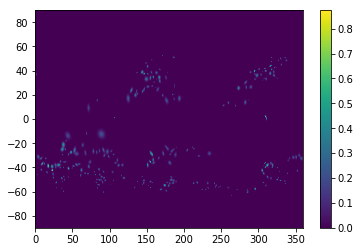

 0% [===>                 ]17% | Elapsed Time:483 s | Estimated Time:2821 s | Info: eddyn_282 |key:  eddyn_283 Level:  0.13


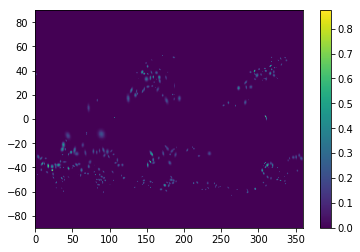

 0% [===>                 ]17% | Elapsed Time:484 s | Estimated Time:2817 s | Info: eddyn_283 |key:  eddyn_284 Level:  0.14


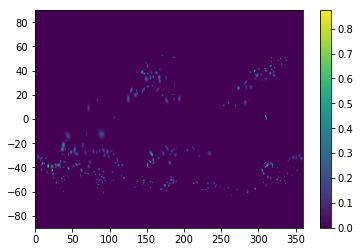

 0% [===>                 ]17% | Elapsed Time:486 s | Estimated Time:2819 s | Info: eddyn_284 |key:  eddyn_285 Level:  0.15000000000000002


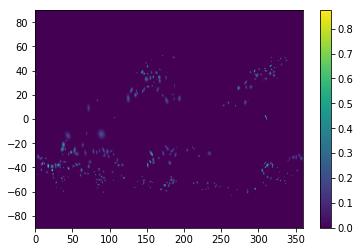

 0% [===>                 ]17% | Elapsed Time:488 s | Estimated Time:2821 s | Info: eddyn_285 |key:  eddyn_286 Level:  0.15000000000000002


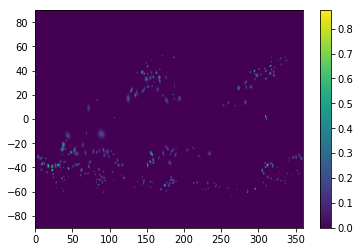

 0% [===>                 ]17% | Elapsed Time:489 s | Estimated Time:2816 s | Info: eddyn_286 |key:  eddyn_287 Level:  0.12


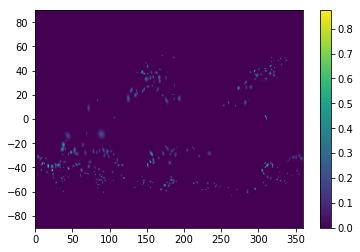

 0% [===>                 ]17% | Elapsed Time:491 s | Estimated Time:2818 s | Info: eddyn_287 |key:  eddyn_288 Level:  0.15000000000000002


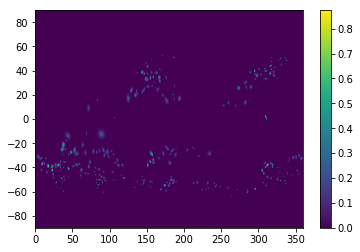

 0% [===>                 ]17% | Elapsed Time:493 s | Estimated Time:2820 s | Info: eddyn_288 |key:  eddyn_289 Level:  0.15000000000000002


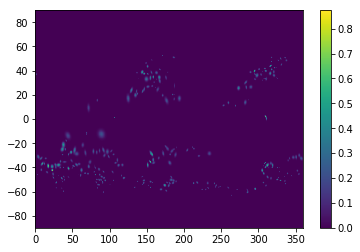

 0% [===>                 ]18% | Elapsed Time:495 s | Estimated Time:2822 s | Info: eddyn_289 |key:  eddyn_290 Level:  0.06999999999999999


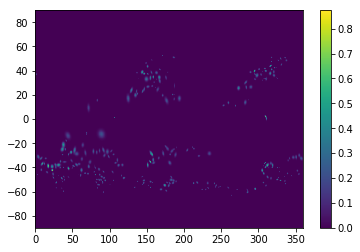

 0% [===>                 ]18% | Elapsed Time:496 s | Estimated Time:2817 s | Info: eddyn_290 |key:  eddyn_291 Level:  0.09


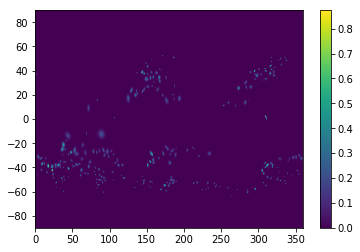

 0% [===>                 ]18% | Elapsed Time:498 s | Estimated Time:2819 s | Info: eddyn_291 |key:  eddyn_292 Level:  0.12


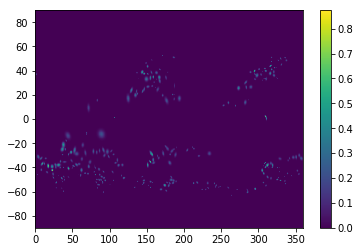

 0% [===>                 ]18% | Elapsed Time:500 s | Estimated Time:2821 s | Info: eddyn_292 |key:  eddyn_293 Level:  0.03


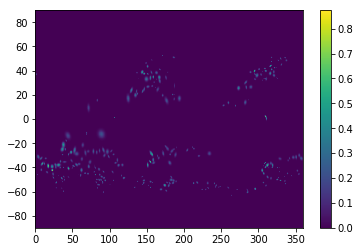

 0% [===>                 ]18% | Elapsed Time:518 s | Estimated Time:2912 s | Info: eddyn_293 |key:  eddyn_294 Level:  0.09


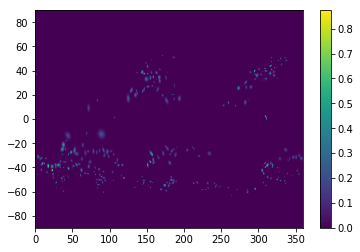

 0% [===>                 ]18% | Elapsed Time:520 s | Estimated Time:2914 s | Info: eddyn_294 |key:  eddyn_295 Level:  0.06999999999999999


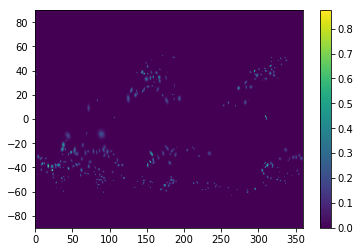

 0% [===>                 ]18% | Elapsed Time:522 s | Estimated Time:2915 s | Info: eddyn_295 |key:  eddyn_296 Level:  0.14


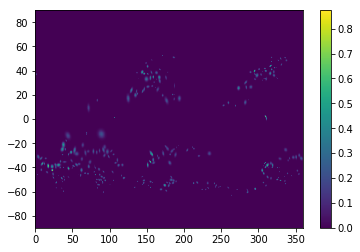

 0% [===>                 ]18% | Elapsed Time:523 s | Estimated Time:2911 s | Info: eddyn_296 |key:  eddyn_297 Level:  0.15000000000000002


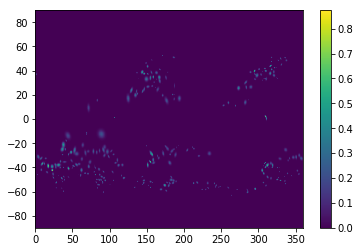

 0% [===>                 ]18% | Elapsed Time:525 s | Estimated Time:2912 s | Info: eddyn_297 |key:  eddyn_298 Level:  0.09


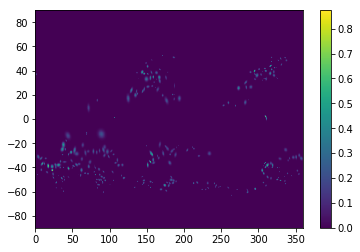

 0% [===>                 ]18% | Elapsed Time:527 s | Estimated Time:2913 s | Info: eddyn_298 |key:  eddyn_299 Level:  0.13


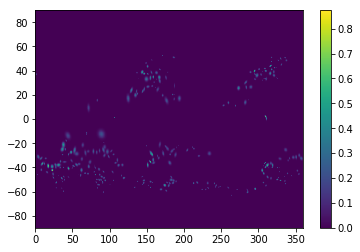

 0% [===>                 ]18% | Elapsed Time:528 s | Estimated Time:2909 s | Info: eddyn_299 |key:  eddyn_300 Level:  0.09


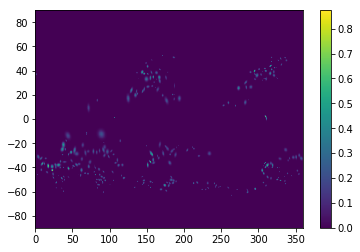

 0% [===>                 ]18% | Elapsed Time:530 s | Estimated Time:2911 s | Info: eddyn_300 |key:  eddyn_301 Level:  0.15000000000000002


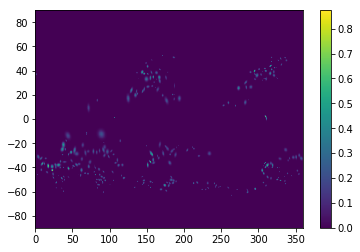

 0% [===>                 ]18% | Elapsed Time:532 s | Estimated Time:2912 s | Info: eddyn_301 |key:  eddyn_302 Level:  0.14


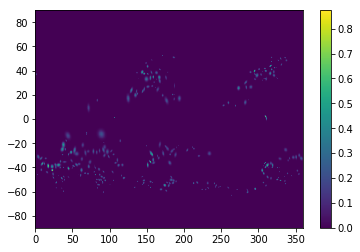

 0% [===>                 ]18% | Elapsed Time:533 s | Estimated Time:2908 s | Info: eddyn_302 |key:  eddyn_303 Level:  0.15000000000000002


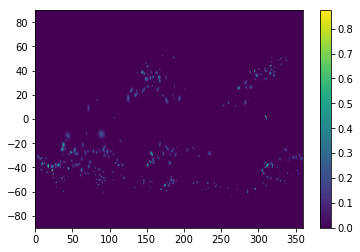

 0% [===>                 ]18% | Elapsed Time:535 s | Estimated Time:2909 s | Info: eddyn_303 |key:  eddyn_304 Level:  0.11


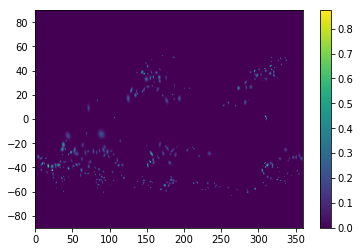

 0% [===>                 ]18% | Elapsed Time:537 s | Estimated Time:2910 s | Info: eddyn_304 |key:  eddyn_305 Level:  0.13


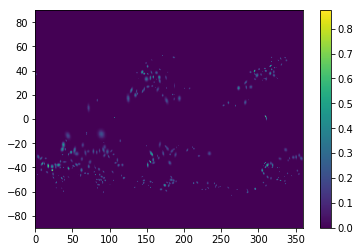

 0% [===>                 ]19% | Elapsed Time:539 s | Estimated Time:2912 s | Info: eddyn_305 |key:  eddyn_306 Level:  0.14


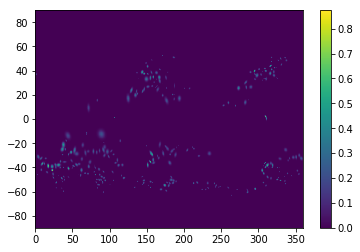

 0% [===>                 ]19% | Elapsed Time:540 s | Estimated Time:2908 s | Info: eddyn_306 |key:  eddyn_307 Level:  0.14


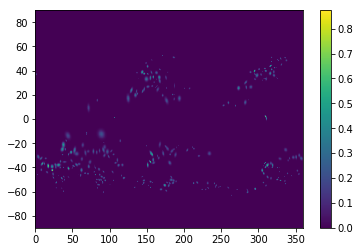

 0% [===>                 ]19% | Elapsed Time:542 s | Estimated Time:2909 s | Info: eddyn_307 |key:  eddyn_308 Level:  0.15000000000000002


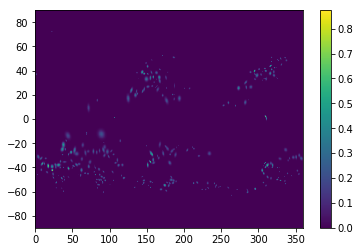

 0% [===>                 ]19% | Elapsed Time:544 s | Estimated Time:2910 s | Info: eddyn_308 |key:  eddyn_309 Level:  0.09999999999999999


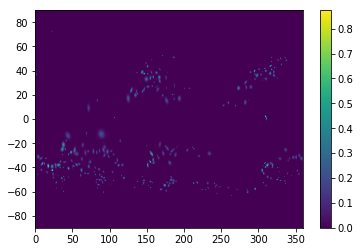

 0% [===>                 ]19% | Elapsed Time:546 s | Estimated Time:2911 s | Info: eddyn_309 |key:  eddyn_310 Level:  0.12


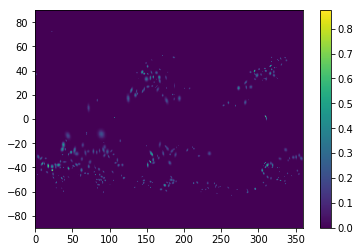

 0% [===>                 ]19% | Elapsed Time:547 s | Estimated Time:2907 s | Info: eddyn_310 |key:  eddyn_311 Level:  0.12


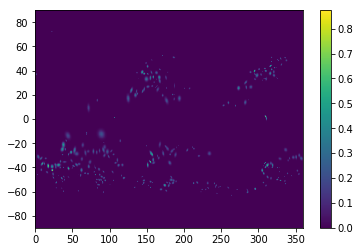

 0% [===>                 ]19% | Elapsed Time:549 s | Estimated Time:2909 s | Info: eddyn_311 |key:  eddyn_312 Level:  0.14


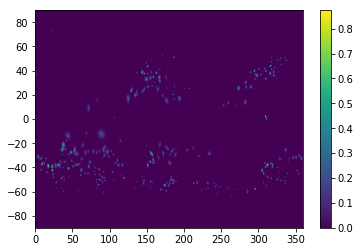

 0% [===>                 ]19% | Elapsed Time:551 s | Estimated Time:2910 s | Info: eddyn_312 |key:  eddyn_313 Level:  0.14


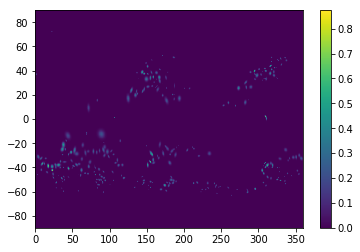

 0% [===>                 ]19% | Elapsed Time:552 s | Estimated Time:2906 s | Info: eddyn_313 |key:  eddyn_314 Level:  0.14


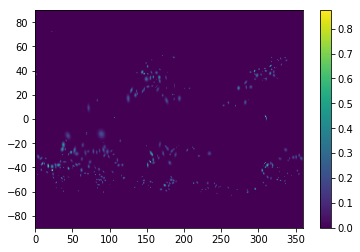

 0% [===>                 ]19% | Elapsed Time:554 s | Estimated Time:2907 s | Info: eddyn_314 |key:  eddyn_315 Level:  0.13


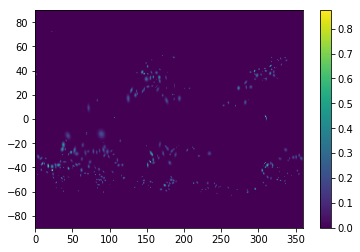

 0% [===>                 ]19% | Elapsed Time:556 s | Estimated Time:2908 s | Info: eddyn_315 |key:  eddyn_316 Level:  0.08


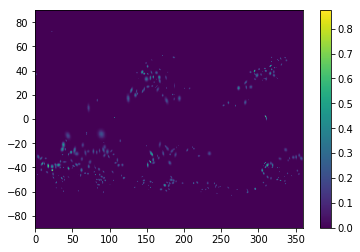

 0% [===>                 ]19% | Elapsed Time:558 s | Estimated Time:2910 s | Info: eddyn_316 |key:  eddyn_317 Level:  0.11


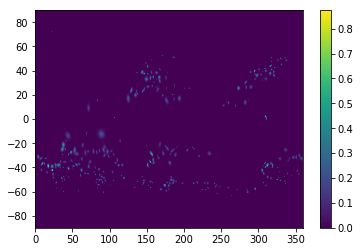

 0% [===>                 ]19% | Elapsed Time:559 s | Estimated Time:2906 s | Info: eddyn_317 |key:  eddyn_318 Level:  0.09999999999999999


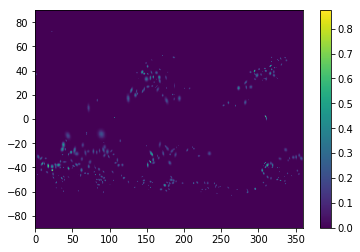

 0% [===>                 ]19% | Elapsed Time:561 s | Estimated Time:2907 s | Info: eddyn_318 |key:  eddyn_319 Level:  0.09


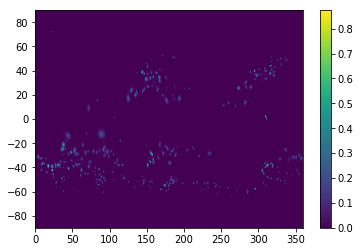

 0% [===>                 ]19% | Elapsed Time:563 s | Estimated Time:2908 s | Info: eddyn_319 |key:  eddyn_320 Level:  0.13


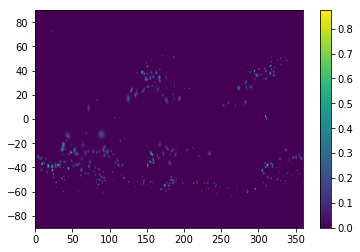

 0% [===>                 ]19% | Elapsed Time:564 s | Estimated Time:2904 s | Info: eddyn_320 |key:  eddyn_321 Level:  0.12


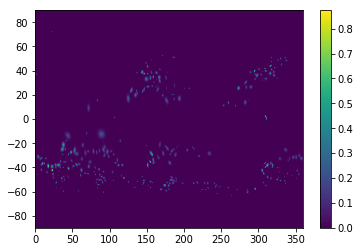

 0% [===>                 ]19% | Elapsed Time:566 s | Estimated Time:2906 s | Info: eddyn_321 |key:  eddyn_322 Level:  0.04


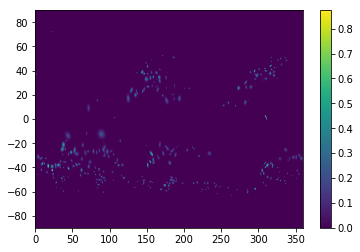

 0% [===>                 ]20% | Elapsed Time:568 s | Estimated Time:2907 s | Info: eddyn_322 |key:  eddyn_323 Level:  0.09999999999999999


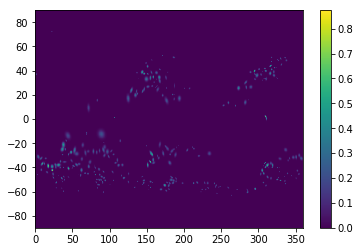

 0% [===>                 ]20% | Elapsed Time:569 s | Estimated Time:2903 s | Info: eddyn_323 |key:  eddyn_324 Level:  0.09999999999999999


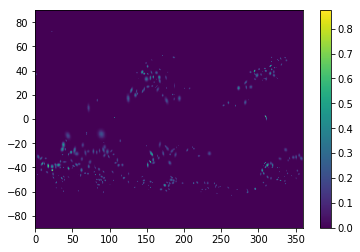

 0% [===>                 ]20% | Elapsed Time:571 s | Estimated Time:2904 s | Info: eddyn_324 |key:  eddyn_325 Level:  0.11


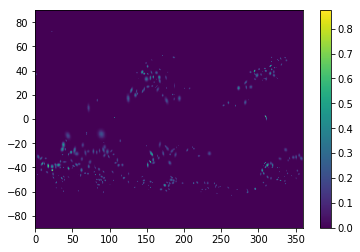

 0% [===>                 ]20% | Elapsed Time:573 s | Estimated Time:2905 s | Info: eddyn_325 |key:  eddyn_326 Level:  0.09999999999999999


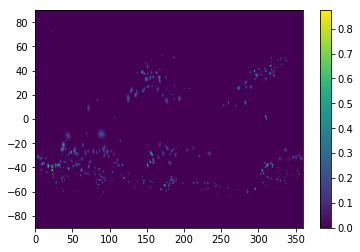

 0% [===>                 ]20% | Elapsed Time:574 s | Estimated Time:2902 s | Info: eddyn_326 |key:  eddyn_327 Level:  0.04


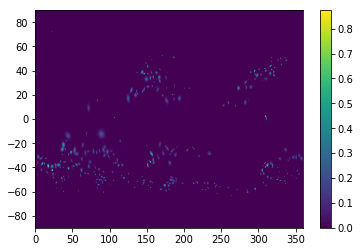

 0% [===>                 ]20% | Elapsed Time:576 s | Estimated Time:2903 s | Info: eddyn_327 |key:  eddyn_328 Level:  0.09


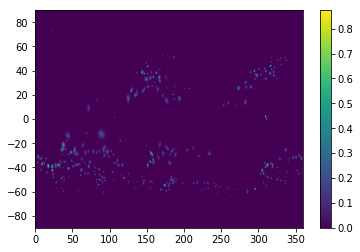

 0% [===>                 ]20% | Elapsed Time:578 s | Estimated Time:2904 s | Info: eddyn_328 |key:  eddyn_329 Level:  0.13


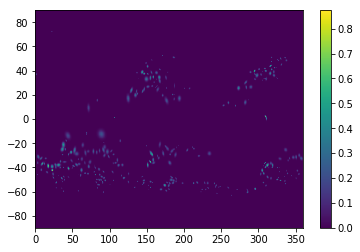

 0% [===>                 ]20% | Elapsed Time:579 s | Estimated Time:2900 s | Info: eddyn_329 |key:  eddyn_330 Level:  0.06999999999999999


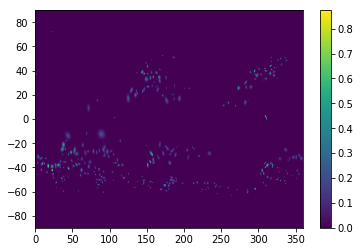

 0% [====>                ]20% | Elapsed Time:581 s | Estimated Time:2901 s | Info: eddyn_330 |key:  eddyn_331 Level:  0.060000000000000005


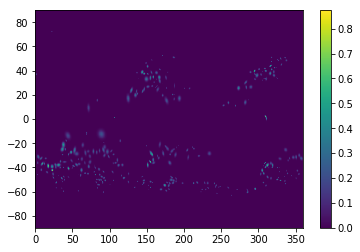

 0% [====>                ]20% | Elapsed Time:583 s | Estimated Time:2903 s | Info: eddyn_331 |key:  eddyn_332 Level:  0.060000000000000005


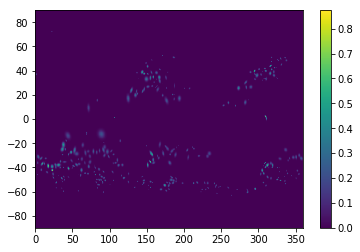

 0% [====>                ]20% | Elapsed Time:585 s | Estimated Time:2904 s | Info: eddyn_332 |key:  eddyn_333 Level:  0.12


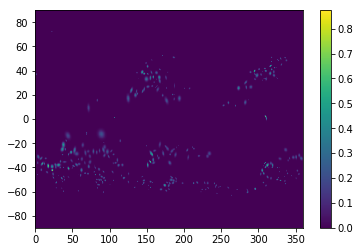

 0% [====>                ]20% | Elapsed Time:586 s | Estimated Time:2900 s | Info: eddyn_333 |key:  eddyn_334 Level:  0.08


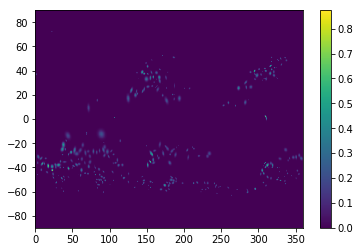

 0% [====>                ]20% | Elapsed Time:588 s | Estimated Time:2901 s | Info: eddyn_334 |key:  eddyn_335 Level:  0.04


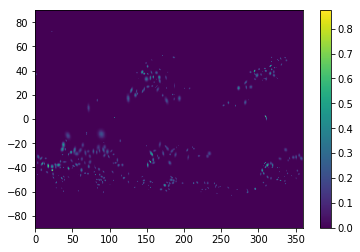

 0% [====>                ]20% | Elapsed Time:590 s | Estimated Time:2903 s | Info: eddyn_335 |key:  eddyn_336 Level:  0.09999999999999999


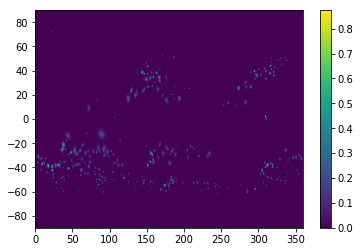

 0% [====>                ]20% | Elapsed Time:591 s | Estimated Time:2899 s | Info: eddyn_336 |key:  eddyn_337 Level:  0.02


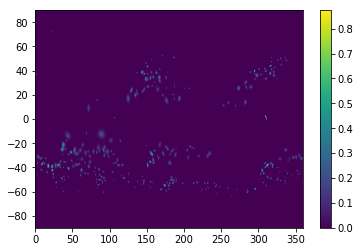

 0% [====>                ]20% | Elapsed Time:593 s | Estimated Time:2900 s | Info: eddyn_337 |key:  eddyn_338 Level:  0.08


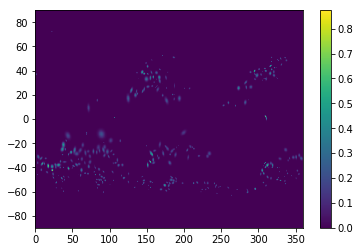

 0% [====>                ]21% | Elapsed Time:595 s | Estimated Time:2901 s | Info: eddyn_338 |key:  eddyn_339 Level:  0.12


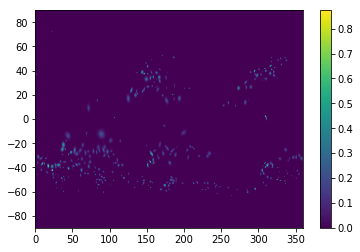

 0% [====>                ]21% | Elapsed Time:596 s | Estimated Time:2898 s | Info: eddyn_339 |key:  eddyn_340 Level:  0.05


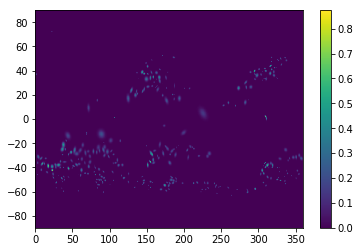

 0% [====>                ]21% | Elapsed Time:598 s | Estimated Time:2899 s | Info: eddyn_340 |key:  eddyn_341 Level:  0.14


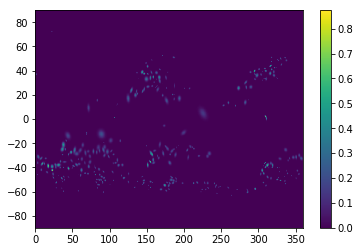

 0% [====>                ]21% | Elapsed Time:600 s | Estimated Time:2900 s | Info: eddyn_341 |key:  eddyn_342 Level:  0.060000000000000005


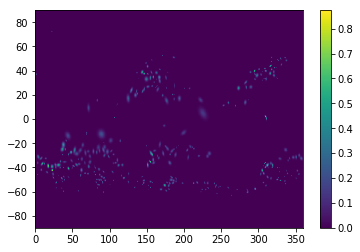

 0% [====>                ]21% | Elapsed Time:602 s | Estimated Time:2901 s | Info: eddyn_342 |key:  eddyn_343 Level:  0.08


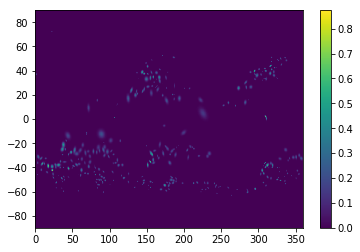

 0% [====>                ]21% | Elapsed Time:603 s | Estimated Time:2898 s | Info: eddyn_343 |key:  eddyn_344 Level:  0.14


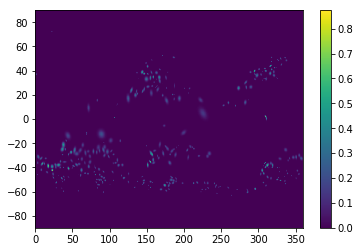

 0% [====>                ]21% | Elapsed Time:605 s | Estimated Time:2899 s | Info: eddyn_344 |key:  eddyn_345 Level:  0.06999999999999999


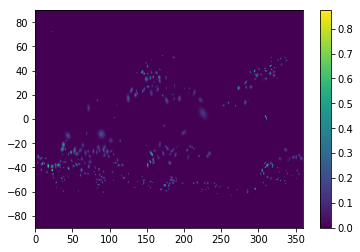

 0% [====>                ]21% | Elapsed Time:607 s | Estimated Time:2900 s | Info: eddyn_345 |key:  eddyn_346 Level:  0.13


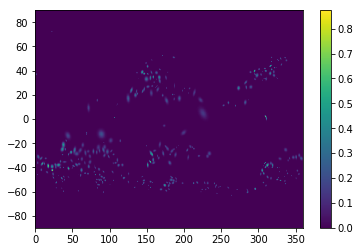

 0% [====>                ]21% | Elapsed Time:608 s | Estimated Time:2896 s | Info: eddyn_346 |key:  eddyn_347 Level:  0.13


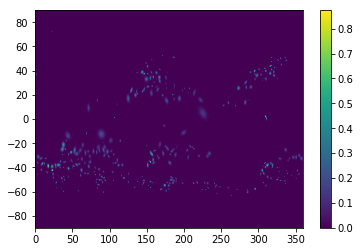

 0% [====>                ]21% | Elapsed Time:610 s | Estimated Time:2898 s | Info: eddyn_347 |key:  eddyn_348 Level:  0.09


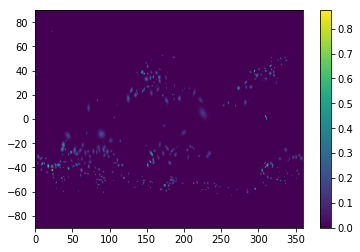

 0% [====>                ]21% | Elapsed Time:612 s | Estimated Time:2899 s | Info: eddyn_348 |key:  eddyn_349 Level:  0.12


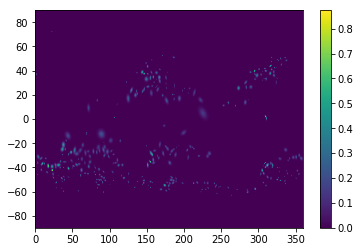

 0% [====>                ]21% | Elapsed Time:613 s | Estimated Time:2895 s | Info: eddyn_349 |key:  eddyn_350 Level:  0.06999999999999999


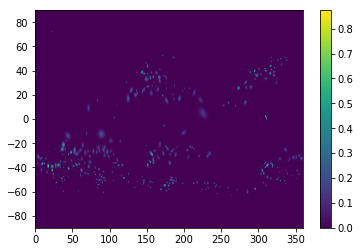

 0% [====>                ]21% | Elapsed Time:615 s | Estimated Time:2896 s | Info: eddyn_350 |key:  eddyn_351 Level:  0.12


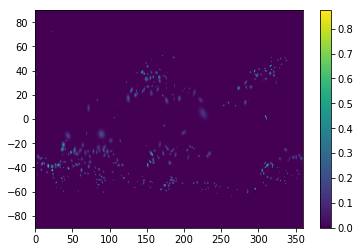

 0% [====>                ]21% | Elapsed Time:617 s | Estimated Time:2897 s | Info: eddyn_351 |key:  eddyn_352 Level:  0.060000000000000005


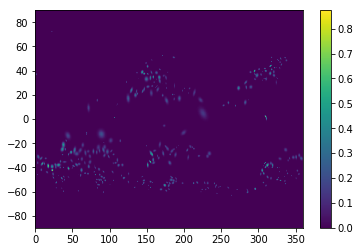

 0% [====>                ]21% | Elapsed Time:619 s | Estimated Time:2899 s | Info: eddyn_352 |key:  eddyn_353 Level:  0.12


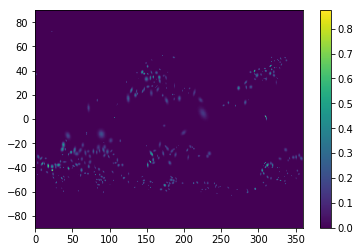

 0% [====>                ]21% | Elapsed Time:620 s | Estimated Time:2895 s | Info: eddyn_353 |key:  eddyn_354 Level:  0.12


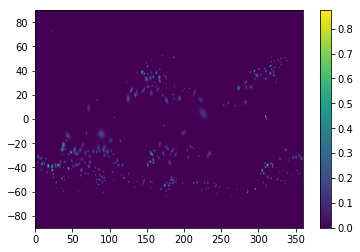

 0% [====>                ]21% | Elapsed Time:622 s | Estimated Time:2896 s | Info: eddyn_354 |key:  eddyn_355 Level:  0.12


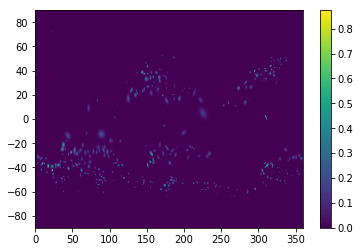

 0% [====>                ]22% | Elapsed Time:624 s | Estimated Time:2897 s | Info: eddyn_355 |key:  eddyn_356 Level:  0.08


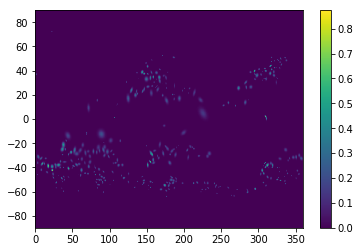

 0% [====>                ]22% | Elapsed Time:625 s | Estimated Time:2894 s | Info: eddyn_356 |key:  eddyn_357 Level:  0.13


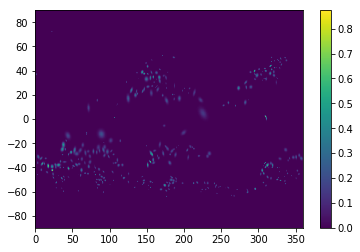

 0% [====>                ]22% | Elapsed Time:627 s | Estimated Time:2895 s | Info: eddyn_357 |key:  eddyn_358 Level:  0.13


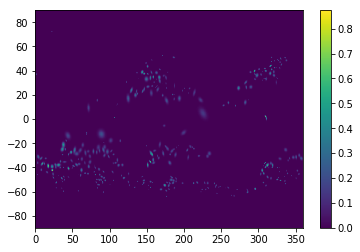

 0% [====>                ]22% | Elapsed Time:629 s | Estimated Time:2896 s | Info: eddyn_358 |key:  eddyn_359 Level:  0.13


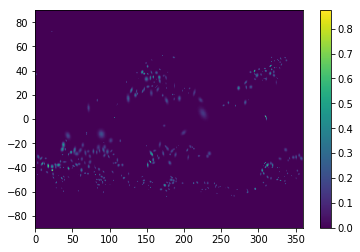

 0% [====>                ]22% | Elapsed Time:631 s | Estimated Time:2897 s | Info: eddyn_359 |key:  eddyn_360 Level:  0.11


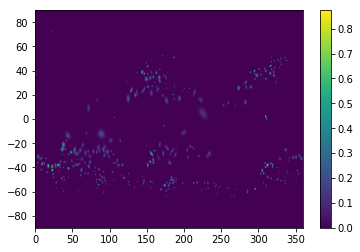

 0% [====>                ]22% | Elapsed Time:632 s | Estimated Time:2894 s | Info: eddyn_360 |key:  eddyn_361 Level:  0.09999999999999999


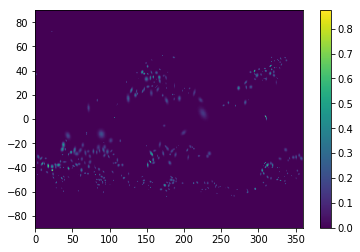

 0% [====>                ]22% | Elapsed Time:634 s | Estimated Time:2895 s | Info: eddyn_361 |key:  eddyn_362 Level:  0.08


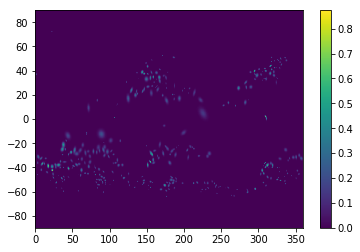

 0% [====>                ]22% | Elapsed Time:636 s | Estimated Time:2896 s | Info: eddyn_362 |key:  eddyn_363 Level:  0.11


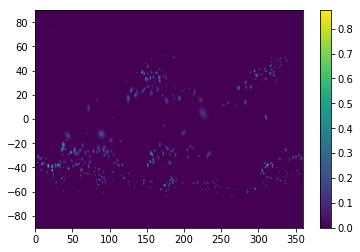

 0% [====>                ]22% | Elapsed Time:638 s | Estimated Time:2897 s | Info: eddyn_363 |key:  eddyn_364 Level:  0.11


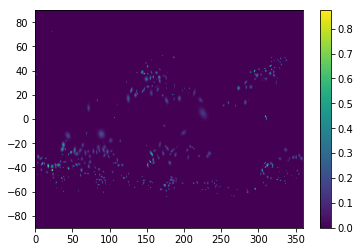

 0% [====>                ]22% | Elapsed Time:639 s | Estimated Time:2894 s | Info: eddyn_364 |key:  eddyn_365 Level:  0.12


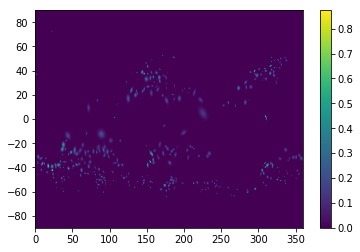

 0% [====>                ]22% | Elapsed Time:641 s | Estimated Time:2895 s | Info: eddyn_365 |key:  eddyn_366 Level:  0.05


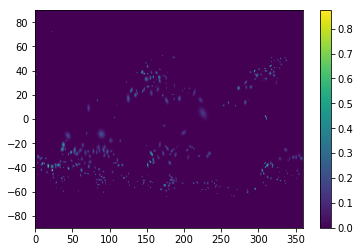

 0% [====>                ]22% | Elapsed Time:643 s | Estimated Time:2896 s | Info: eddyn_366 |key:  eddyn_367 Level:  0.13


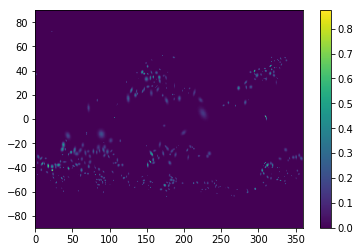

 0% [====>                ]22% | Elapsed Time:645 s | Estimated Time:2897 s | Info: eddyn_367 |key:  eddyn_368 Level:  0.08


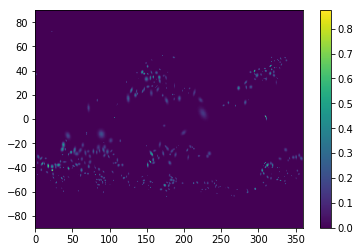

 0% [====>                ]22% | Elapsed Time:646 s | Estimated Time:2894 s | Info: eddyn_368 |key:  eddyn_369 Level:  0.08


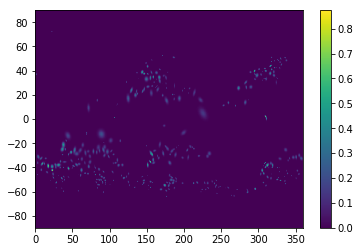

 0% [====>                ]22% | Elapsed Time:648 s | Estimated Time:2895 s | Info: eddyn_369 |key:  eddyn_370 Level:  0.13


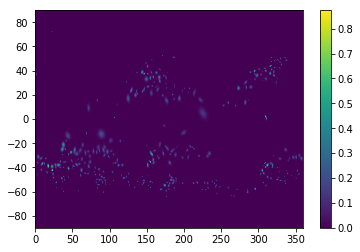

 0% [====>                ]22% | Elapsed Time:650 s | Estimated Time:2896 s | Info: eddyn_370 |key:  eddyn_371 Level:  0.04


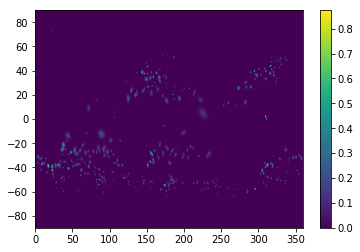

 0% [====>                ]23% | Elapsed Time:651 s | Estimated Time:2893 s | Info: eddyn_371 |key:  eddyn_372 Level:  0.11


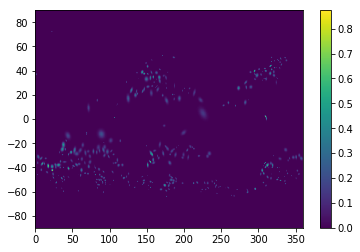

 0% [====>                ]23% | Elapsed Time:653 s | Estimated Time:2894 s | Info: eddyn_372 |key:  eddyn_373 Level:  0.09999999999999999


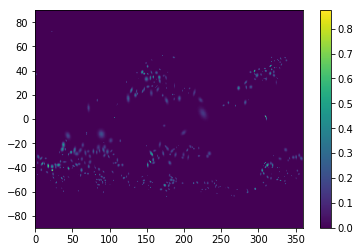

 0% [====>                ]23% | Elapsed Time:655 s | Estimated Time:2895 s | Info: eddyn_373 |key:  eddyn_374 Level:  0.13


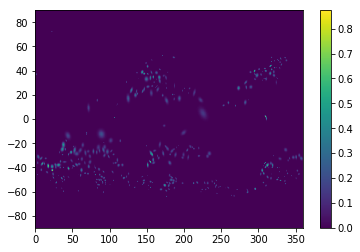

 0% [====>                ]23% | Elapsed Time:656 s | Estimated Time:2892 s | Info: eddyn_374 |key:  eddyn_375 Level:  0.09


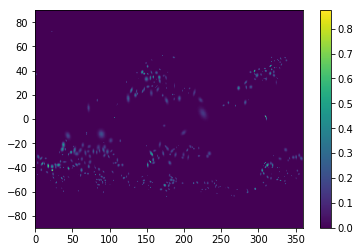

 0% [====>                ]23% | Elapsed Time:658 s | Estimated Time:2893 s | Info: eddyn_375 |key:  eddyn_376 Level:  0.06999999999999999


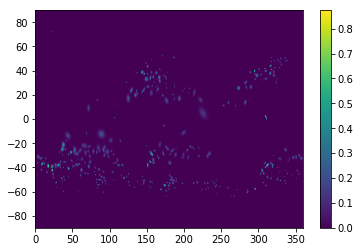

 0% [====>                ]23% | Elapsed Time:660 s | Estimated Time:2894 s | Info: eddyn_376 |key:  eddyn_377 Level:  0.13


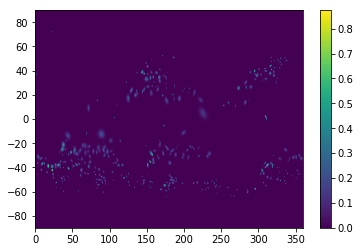

 0% [====>                ]23% | Elapsed Time:662 s | Estimated Time:2895 s | Info: eddyn_377 |key:  eddyn_378 Level:  0.13


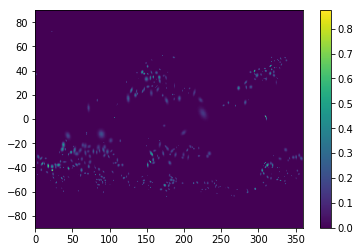

 0% [====>                ]23% | Elapsed Time:663 s | Estimated Time:2892 s | Info: eddyn_378 |key:  eddyn_379 Level:  0.08


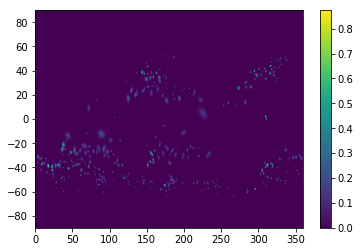

 0% [====>                ]23% | Elapsed Time:665 s | Estimated Time:2893 s | Info: eddyn_379 |key:  eddyn_380 Level:  0.12


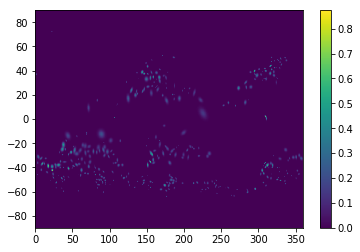

 0% [====>                ]23% | Elapsed Time:667 s | Estimated Time:2894 s | Info: eddyn_380 |key:  eddyn_381 Level:  0.06999999999999999


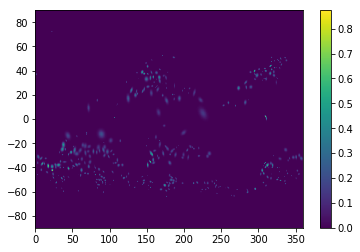

 0% [====>                ]23% | Elapsed Time:668 s | Estimated Time:2891 s | Info: eddyn_381 |key:  eddyn_382 Level:  0.11


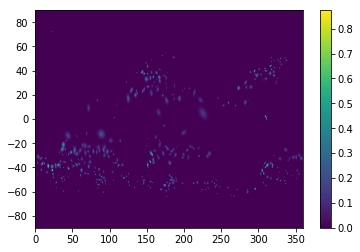

 0% [====>                ]23% | Elapsed Time:670 s | Estimated Time:2892 s | Info: eddyn_382 |key:  eddyn_383 Level:  0.13


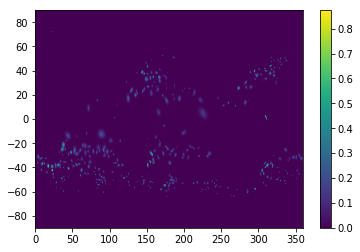

 0% [====>                ]23% | Elapsed Time:672 s | Estimated Time:2893 s | Info: eddyn_383 |key:  eddyn_384 Level:  0.08


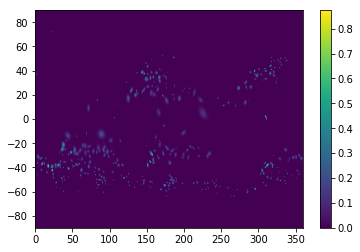

 0% [====>                ]23% | Elapsed Time:673 s | Estimated Time:2890 s | Info: eddyn_384 |key:  eddyn_385 Level:  0.12


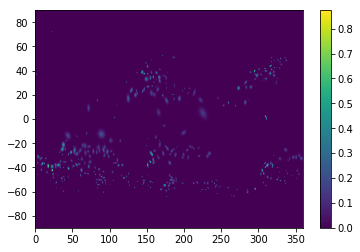

 0% [====>                ]23% | Elapsed Time:675 s | Estimated Time:2891 s | Info: eddyn_385 |key:  eddyn_386 Level:  0.12


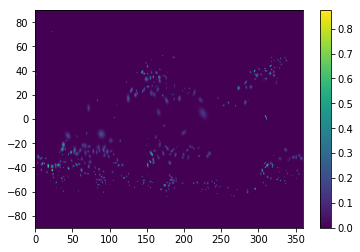

 0% [====>                ]23% | Elapsed Time:677 s | Estimated Time:2892 s | Info: eddyn_386 |key:  eddyn_387 Level:  0.04


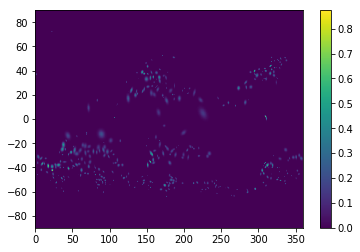

 0% [====>                ]23% | Elapsed Time:679 s | Estimated Time:2893 s | Info: eddyn_387 |key:  eddyn_388 Level:  0.11


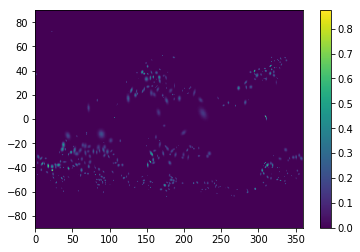

 0% [====>                ]24% | Elapsed Time:680 s | Estimated Time:2890 s | Info: eddyn_388 |key:  eddyn_389 Level:  0.060000000000000005


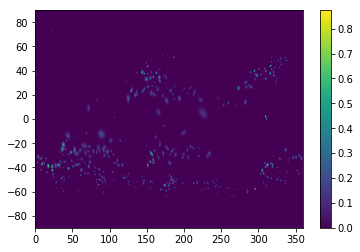

 0% [====>                ]24% | Elapsed Time:682 s | Estimated Time:2891 s | Info: eddyn_389 |key:  eddyn_390 Level:  0.11


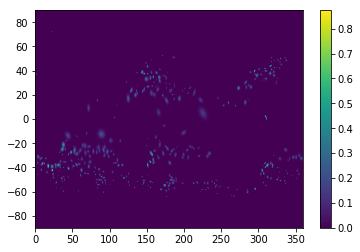

 0% [====>                ]24% | Elapsed Time:684 s | Estimated Time:2892 s | Info: eddyn_390 |key:  eddyn_391 Level:  0.05


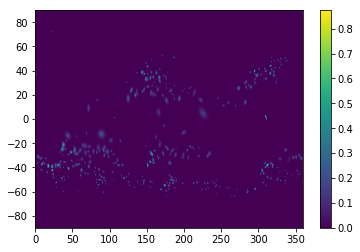

 0% [====>                ]24% | Elapsed Time:685 s | Estimated Time:2889 s | Info: eddyn_391 |key:  eddyn_392 Level:  0.09999999999999999


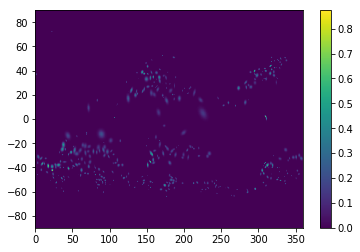

 0% [====>                ]24% | Elapsed Time:687 s | Estimated Time:2890 s | Info: eddyn_392 |key:  eddyn_393 Level:  0.12


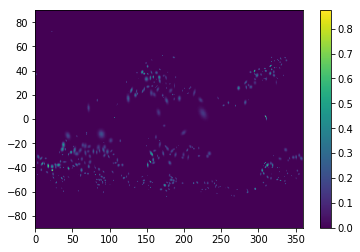

 0% [====>                ]24% | Elapsed Time:689 s | Estimated Time:2891 s | Info: eddyn_393 |key:  eddyn_394 Level:  0.06999999999999999


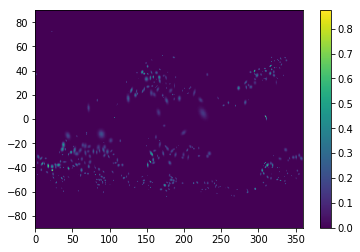

 0% [====>                ]24% | Elapsed Time:690 s | Estimated Time:2888 s | Info: eddyn_394 |key:  eddyn_395 Level:  0.08


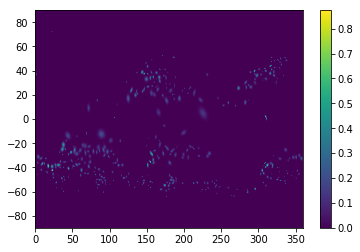

 0% [====>                ]24% | Elapsed Time:692 s | Estimated Time:2889 s | Info: eddyn_395 |key:  eddyn_396 Level:  0.09999999999999999


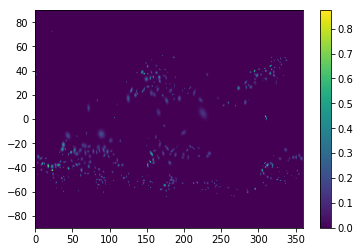

 0% [====>                ]24% | Elapsed Time:694 s | Estimated Time:2890 s | Info: eddyn_396 |key:  eddyn_397 Level:  0.12


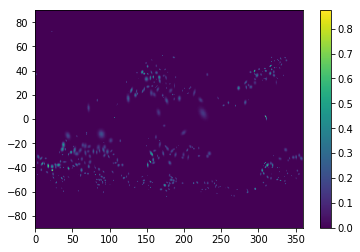

 0% [====>                ]24% | Elapsed Time:695 s | Estimated Time:2887 s | Info: eddyn_397 |key:  eddyn_398 Level:  0.12


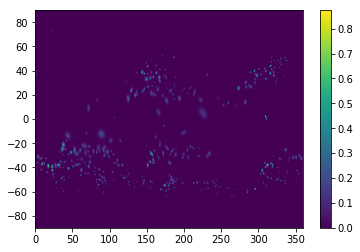

 0% [====>                ]24% | Elapsed Time:697 s | Estimated Time:2888 s | Info: eddyn_398 |key:  eddyn_399 Level:  0.12


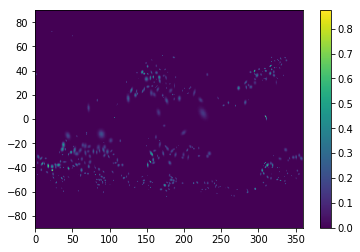

 0% [====>                ]24% | Elapsed Time:699 s | Estimated Time:2889 s | Info: eddyn_399 |key:  eddyn_400 Level:  0.09999999999999999


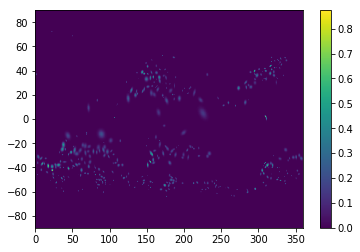

 0% [====>                ]24% | Elapsed Time:701 s | Estimated Time:2890 s | Info: eddyn_400 |key:  eddyn_401 Level:  0.12


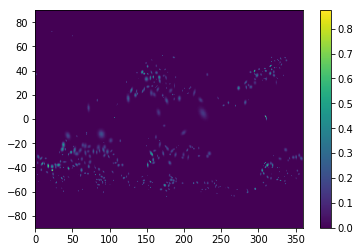

 0% [====>                ]24% | Elapsed Time:703 s | Estimated Time:2891 s | Info: eddyn_401 |key:  eddyn_402 Level:  0.09999999999999999


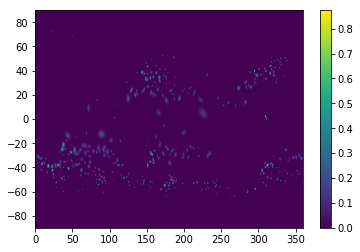

 0% [====>                ]24% | Elapsed Time:704 s | Estimated Time:2888 s | Info: eddyn_402 |key:  eddyn_403 Level:  0.09999999999999999


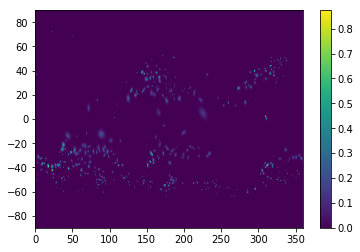

 0% [====>                ]24% | Elapsed Time:706 s | Estimated Time:2889 s | Info: eddyn_403 |key:  eddyn_404 Level:  0.06999999999999999


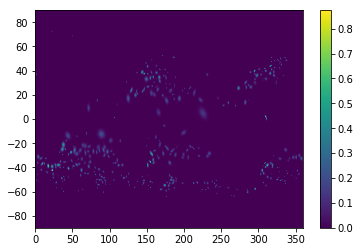

 0% [====>                ]25% | Elapsed Time:708 s | Estimated Time:2890 s | Info: eddyn_404 |key:  eddyn_405 Level:  0.11


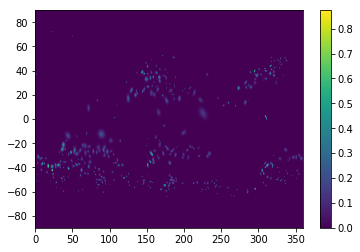

 0% [====>                ]25% | Elapsed Time:710 s | Estimated Time:2891 s | Info: eddyn_405 |key:  eddyn_406 Level:  0.06999999999999999


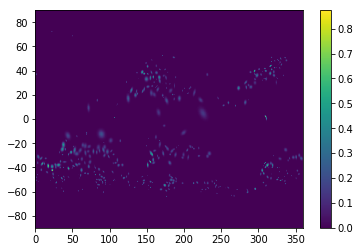

 0% [====>                ]25% | Elapsed Time:711 s | Estimated Time:2888 s | Info: eddyn_406 |key:  eddyn_407 Level:  0.12


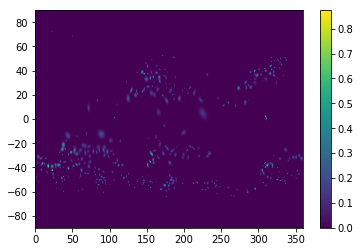

 0% [====>                ]25% | Elapsed Time:713 s | Estimated Time:2889 s | Info: eddyn_407 |key:  eddyn_408 Level:  0.04


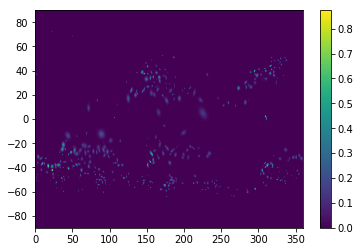

 0% [====>                ]25% | Elapsed Time:715 s | Estimated Time:2890 s | Info: eddyn_408 |key:  eddyn_409 Level:  0.12


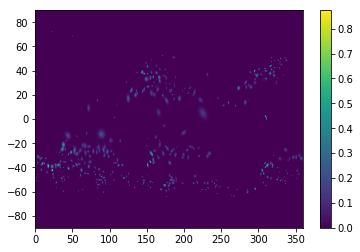

 0% [====>                ]25% | Elapsed Time:716 s | Estimated Time:2887 s | Info: eddyn_409 |key:  eddyn_410 Level:  0.060000000000000005


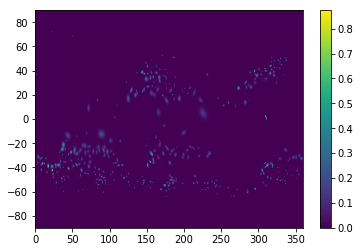

 0% [====>                ]25% | Elapsed Time:718 s | Estimated Time:2888 s | Info: eddyn_410 |key:  eddyn_411 Level:  0.09


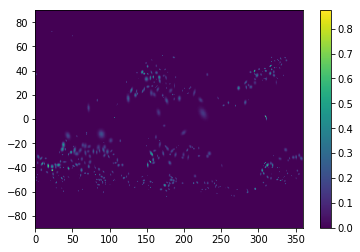

 0% [====>                ]25% | Elapsed Time:720 s | Estimated Time:2889 s | Info: eddyn_411 |key:  eddyn_412 Level:  0.09999999999999999


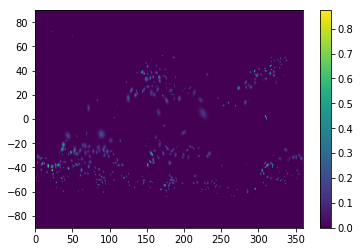

 0% [====>                ]25% | Elapsed Time:722 s | Estimated Time:2890 s | Info: eddyn_412 |key:  eddyn_413 Level:  0.08


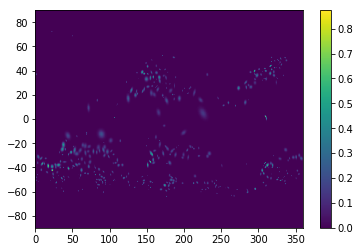

 0% [=====>               ]25% | Elapsed Time:723 s | Estimated Time:2887 s | Info: eddyn_413 |key:  eddyn_414 Level:  0.08


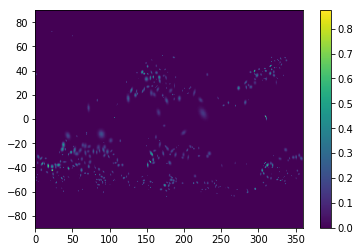

 0% [=====>               ]25% | Elapsed Time:725 s | Estimated Time:2888 s | Info: eddyn_414 |key:  eddyn_415 Level:  0.09


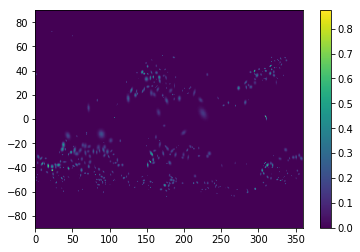

 0% [=====>               ]25% | Elapsed Time:727 s | Estimated Time:2889 s | Info: eddyn_415 |key:  eddyn_416 Level:  0.11


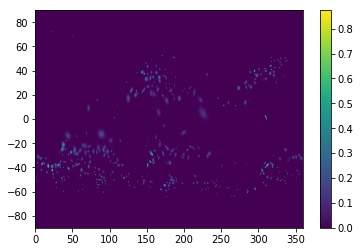

 0% [=====>               ]25% | Elapsed Time:729 s | Estimated Time:2890 s | Info: eddyn_416 |key:  eddyn_417 Level:  0.11


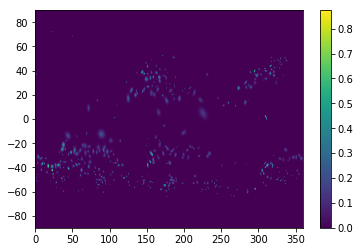

 0% [=====>               ]25% | Elapsed Time:730 s | Estimated Time:2887 s | Info: eddyn_417 |key:  eddyn_418 Level:  0.060000000000000005


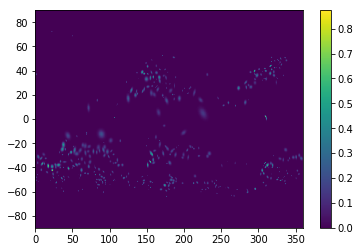

 0% [=====>               ]25% | Elapsed Time:732 s | Estimated Time:2888 s | Info: eddyn_418 |key:  eddyn_419 Level:  0.12


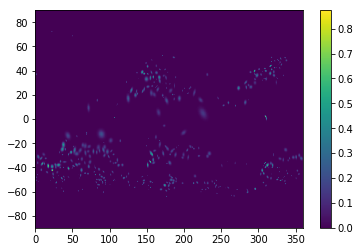

 0% [=====>               ]25% | Elapsed Time:734 s | Estimated Time:2889 s | Info: eddyn_419 |key:  eddyn_420 Level:  0.060000000000000005


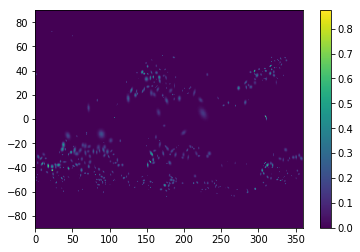

 0% [=====>               ]25% | Elapsed Time:736 s | Estimated Time:2890 s | Info: eddyn_420 |key:  eddyn_421 Level:  0.11


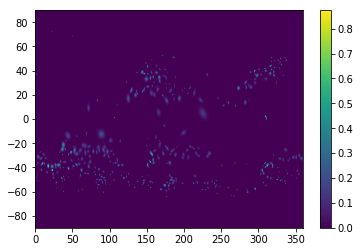

 0% [=====>               ]26% | Elapsed Time:737 s | Estimated Time:2887 s | Info: eddyn_421 |key:  eddyn_422 Level:  0.01


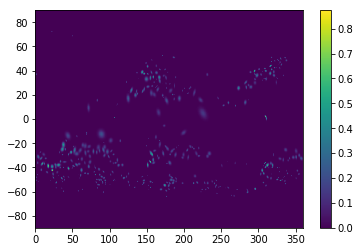

 0% [=====>               ]26% | Elapsed Time:739 s | Estimated Time:2888 s | Info: eddyn_422 |key:  eddyn_423 Level:  0.12


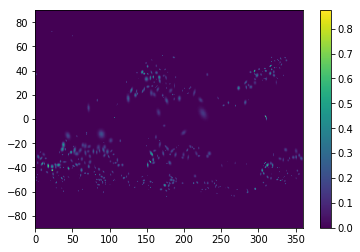

 0% [=====>               ]26% | Elapsed Time:741 s | Estimated Time:2889 s | Info: eddyn_423 |key:  eddyn_424 Level:  0.09999999999999999


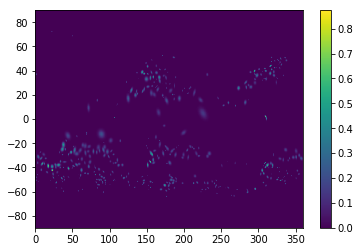

 0% [=====>               ]26% | Elapsed Time:742 s | Estimated Time:2886 s | Info: eddyn_424 |key:  eddyn_425 Level:  0.05


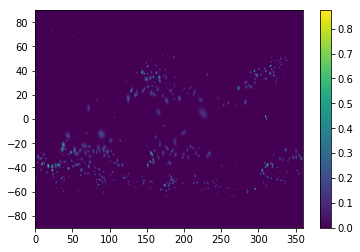

 0% [=====>               ]26% | Elapsed Time:744 s | Estimated Time:2887 s | Info: eddyn_425 |key:  eddyn_426 Level:  0.09999999999999999


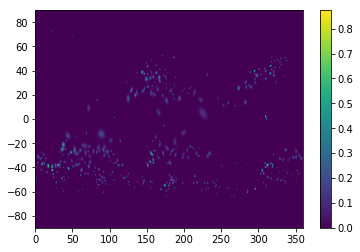

 0% [=====>               ]26% | Elapsed Time:746 s | Estimated Time:2888 s | Info: eddyn_426 |key:  eddyn_427 Level:  0.12


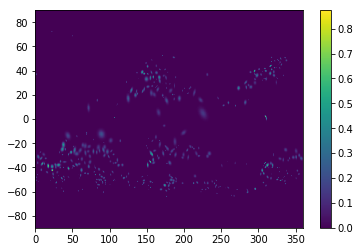

 0% [=====>               ]26% | Elapsed Time:747 s | Estimated Time:2885 s | Info: eddyn_427 |key:  eddyn_428 Level:  0.02


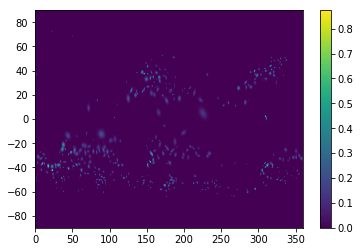

 0% [=====>               ]26% | Elapsed Time:749 s | Estimated Time:2886 s | Info: eddyn_428 |key:  eddyn_429 Level:  0.03


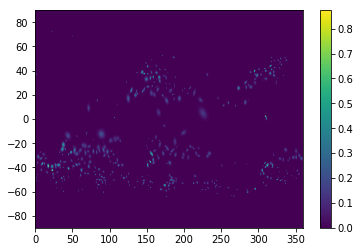

 0% [=====>               ]26% | Elapsed Time:751 s | Estimated Time:2887 s | Info: eddyn_429 |key:  eddyn_430 Level:  0.08


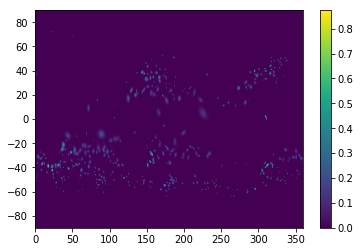

 0% [=====>               ]26% | Elapsed Time:753 s | Estimated Time:2888 s | Info: eddyn_430 |key:  eddyn_431 Level:  0.05


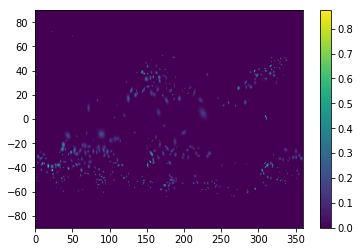

 0% [=====>               ]26% | Elapsed Time:754 s | Estimated Time:2885 s | Info: eddyn_431 |key:  eddyn_432 Level:  0.12


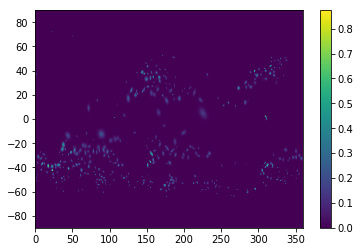

 0% [=====>               ]26% | Elapsed Time:756 s | Estimated Time:2886 s | Info: eddyn_432 |key:  eddyn_433 Level:  0.06999999999999999


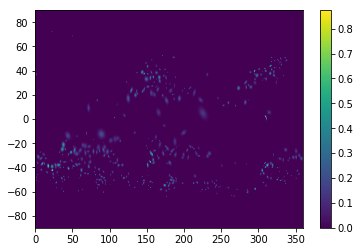

 0% [=====>               ]26% | Elapsed Time:758 s | Estimated Time:2887 s | Info: eddyn_433 |key:  eddyn_434 Level:  0.01


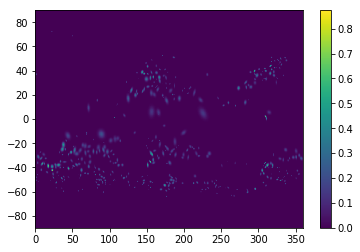

 0% [=====>               ]26% | Elapsed Time:759 s | Estimated Time:2884 s | Info: eddyn_434 |key:  eddyn_435 Level:  0.09999999999999999


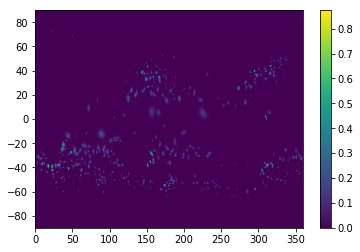

 0% [=====>               ]26% | Elapsed Time:761 s | Estimated Time:2885 s | Info: eddyn_435 |key:  eddyn_436 Level:  0.09


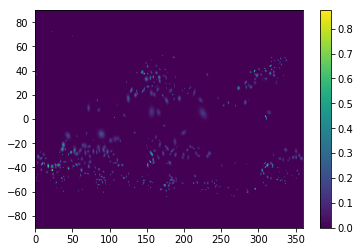

 0% [=====>               ]26% | Elapsed Time:763 s | Estimated Time:2886 s | Info: eddyn_436 |key:  eddyn_437 Level:  0.12


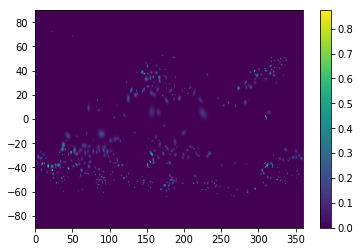

 0% [=====>               ]26% | Elapsed Time:765 s | Estimated Time:2887 s | Info: eddyn_437 |key:  eddyn_438 Level:  0.060000000000000005


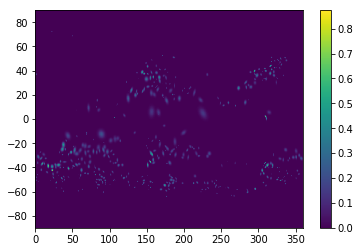

 0% [=====>               ]27% | Elapsed Time:766 s | Estimated Time:2884 s | Info: eddyn_438 |key:  eddyn_439 Level:  0.12


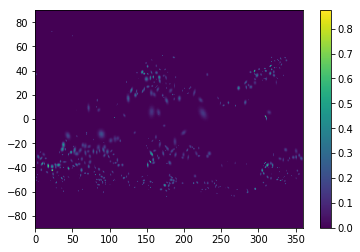

 0% [=====>               ]27% | Elapsed Time:768 s | Estimated Time:2885 s | Info: eddyn_439 |key:  eddyn_440 Level:  0.04


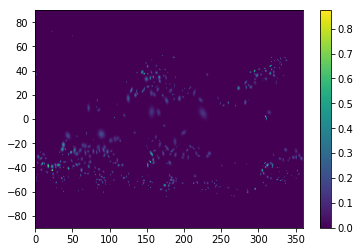

 0% [=====>               ]27% | Elapsed Time:770 s | Estimated Time:2886 s | Info: eddyn_440 |key:  eddyn_441 Level:  0.08


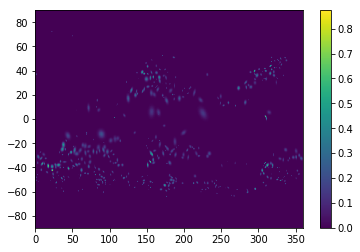

 0% [=====>               ]27% | Elapsed Time:772 s | Estimated Time:2887 s | Info: eddyn_441 |key:  eddyn_442 Level:  0.060000000000000005


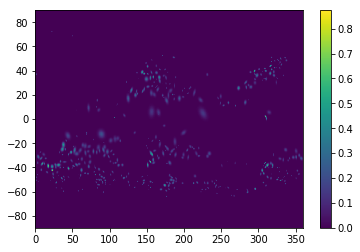

 0% [=====>               ]27% | Elapsed Time:773 s | Estimated Time:2884 s | Info: eddyn_442 |key:  eddyn_443 Level:  0.11


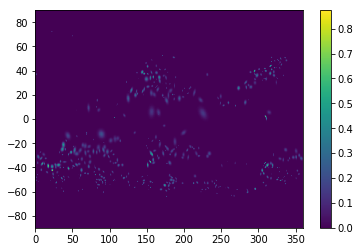

 0% [=====>               ]27% | Elapsed Time:775 s | Estimated Time:2885 s | Info: eddyn_443 |key:  eddyn_444 Level:  0.11


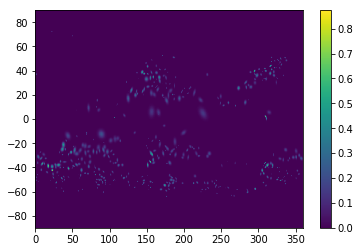

 0% [=====>               ]27% | Elapsed Time:777 s | Estimated Time:2886 s | Info: eddyn_444 |key:  eddyn_445 Level:  0.04


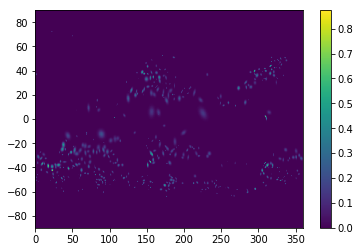

 0% [=====>               ]27% | Elapsed Time:779 s | Estimated Time:2887 s | Info: eddyn_445 |key:  eddyn_446 Level:  0.11


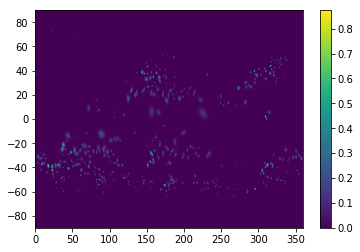

 0% [=====>               ]27% | Elapsed Time:780 s | Estimated Time:2884 s | Info: eddyn_446 |key:  eddyn_447 Level:  0.12


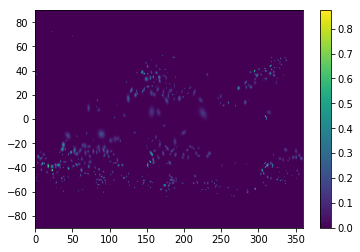

 0% [=====>               ]27% | Elapsed Time:782 s | Estimated Time:2885 s | Info: eddyn_447 |key:  eddyn_448 Level:  0.060000000000000005


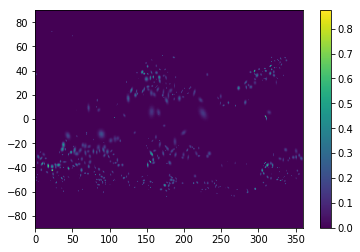

 0% [=====>               ]27% | Elapsed Time:784 s | Estimated Time:2886 s | Info: eddyn_448 |key:  eddyn_449 Level:  0.08


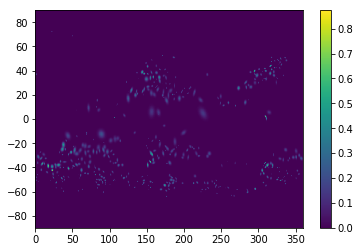

 0% [=====>               ]27% | Elapsed Time:785 s | Estimated Time:2884 s | Info: eddyn_449 |key:  eddyn_450 Level:  0.060000000000000005


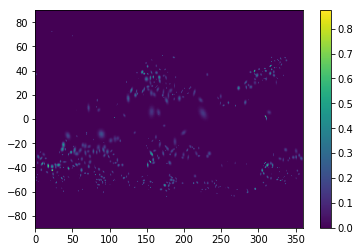

 0% [=====>               ]27% | Elapsed Time:787 s | Estimated Time:2885 s | Info: eddyn_450 |key:  eddyn_451 Level:  0.12


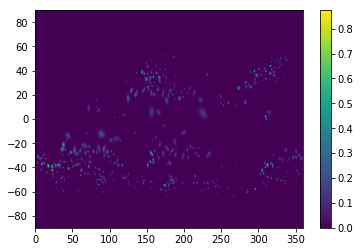

 0% [=====>               ]27% | Elapsed Time:789 s | Estimated Time:2885 s | Info: eddyn_451 |key:  eddyn_452 Level:  0.12


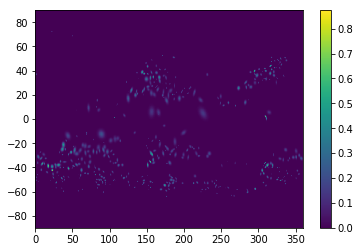

 0% [=====>               ]27% | Elapsed Time:791 s | Estimated Time:2886 s | Info: eddyn_452 |key:  eddyn_453 Level:  0.06999999999999999


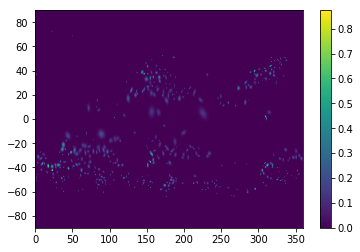

 0% [=====>               ]27% | Elapsed Time:792 s | Estimated Time:2884 s | Info: eddyn_453 |key:  eddyn_454 Level:  0.12


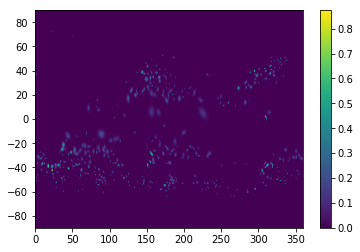

 0% [=====>               ]28% | Elapsed Time:794 s | Estimated Time:2885 s | Info: eddyn_454 |key:  eddyn_455 Level:  0.09999999999999999


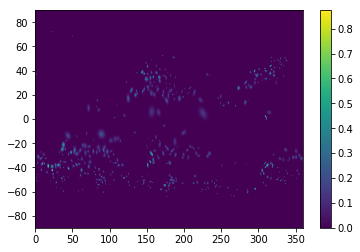

 0% [=====>               ]28% | Elapsed Time:796 s | Estimated Time:2886 s | Info: eddyn_455 |key:  eddyn_456 Level:  0.12


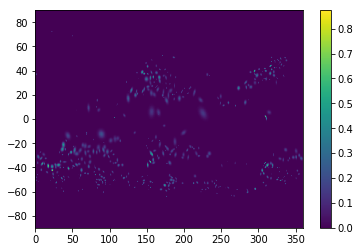

 0% [=====>               ]28% | Elapsed Time:798 s | Estimated Time:2886 s | Info: eddyn_456 |key:  eddyn_457 Level:  0.060000000000000005


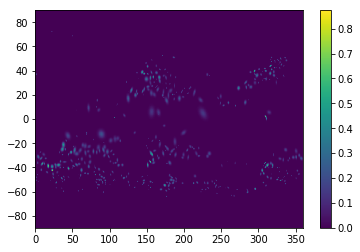

 0% [=====>               ]28% | Elapsed Time:799 s | Estimated Time:2884 s | Info: eddyn_457 |key:  eddyn_458 Level:  0.11


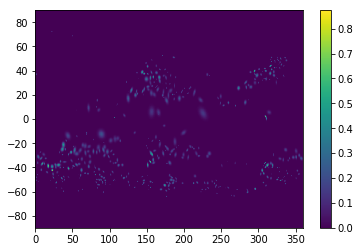

 0% [=====>               ]28% | Elapsed Time:801 s | Estimated Time:2885 s | Info: eddyn_458 |key:  eddyn_459 Level:  0.11


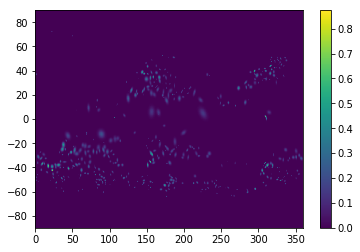

 0% [=====>               ]28% | Elapsed Time:803 s | Estimated Time:2886 s | Info: eddyn_459 |key:  eddyn_460 Level:  0.11


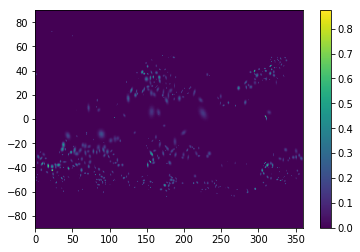

 0% [=====>               ]28% | Elapsed Time:804 s | Estimated Time:2883 s | Info: eddyn_460 |key:  eddyn_461 Level:  0.08


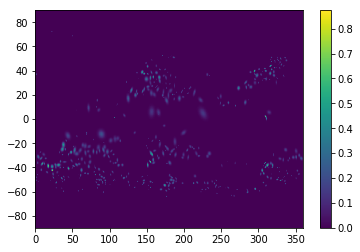

 0% [=====>               ]28% | Elapsed Time:806 s | Estimated Time:2884 s | Info: eddyn_461 |key:  eddyn_462 Level:  0.11


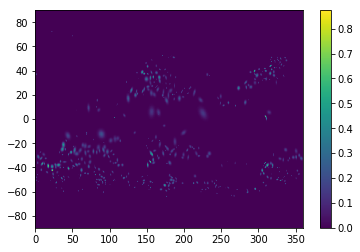

 0% [=====>               ]28% | Elapsed Time:808 s | Estimated Time:2885 s | Info: eddyn_462 |key:  eddyn_463 Level:  0.09


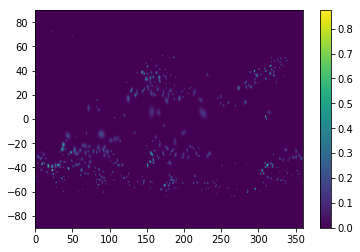

 0% [=====>               ]28% | Elapsed Time:810 s | Estimated Time:2886 s | Info: eddyn_463 |key:  eddyn_464 Level:  0.04


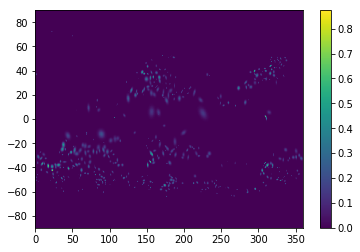

 0% [=====>               ]28% | Elapsed Time:811 s | Estimated Time:2883 s | Info: eddyn_464 |key:  eddyn_465 Level:  0.06999999999999999


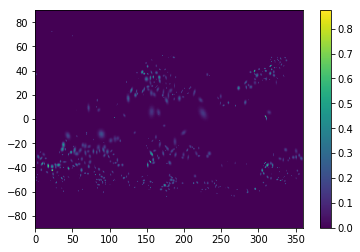

 0% [=====>               ]28% | Elapsed Time:813 s | Estimated Time:2884 s | Info: eddyn_465 |key:  eddyn_466 Level:  0.11


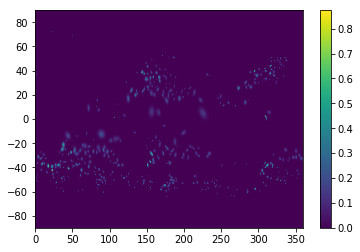

 0% [=====>               ]28% | Elapsed Time:815 s | Estimated Time:2885 s | Info: eddyn_466 |key:  eddyn_467 Level:  0.09999999999999999


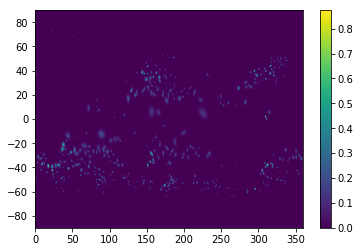

 0% [=====>               ]28% | Elapsed Time:817 s | Estimated Time:2886 s | Info: eddyn_467 |key:  eddyn_468 Level:  0.09999999999999999


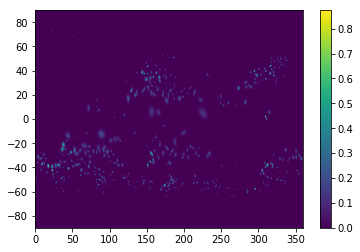

 0% [=====>               ]28% | Elapsed Time:818 s | Estimated Time:2883 s | Info: eddyn_468 |key:  eddyn_469 Level:  0.09999999999999999


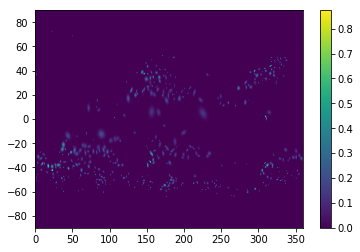

 0% [=====>               ]28% | Elapsed Time:820 s | Estimated Time:2884 s | Info: eddyn_469 |key:  eddyn_470 Level:  0.09999999999999999


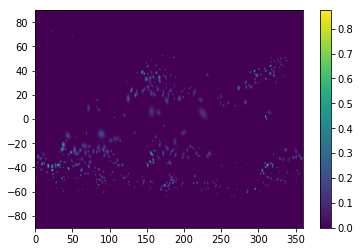

 0% [=====>               ]28% | Elapsed Time:822 s | Estimated Time:2885 s | Info: eddyn_470 |key:  eddyn_471 Level:  0.11


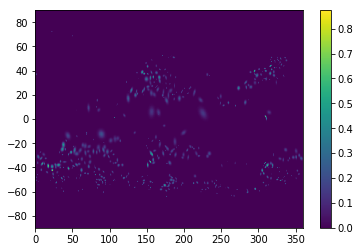

 0% [=====>               ]29% | Elapsed Time:824 s | Estimated Time:2886 s | Info: eddyn_471 |key:  eddyn_472 Level:  0.09


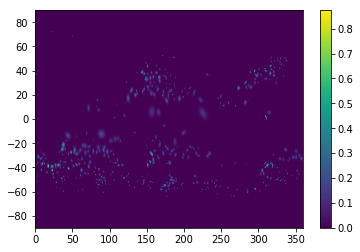

 0% [=====>               ]29% | Elapsed Time:825 s | Estimated Time:2883 s | Info: eddyn_472 |key:  eddyn_473 Level:  0.03


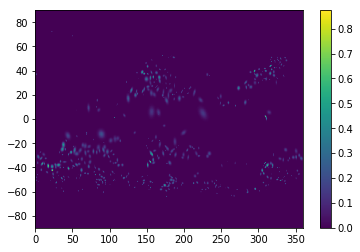

 0% [=====>               ]29% | Elapsed Time:827 s | Estimated Time:2884 s | Info: eddyn_473 |key:  eddyn_474 Level:  0.11


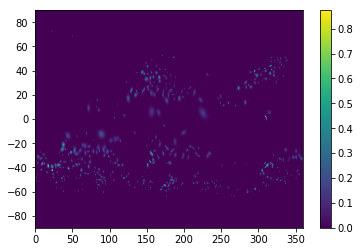

 0% [=====>               ]29% | Elapsed Time:829 s | Estimated Time:2885 s | Info: eddyn_474 |key:  eddyn_475 Level:  0.09


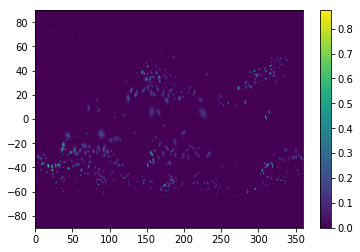

 0% [=====>               ]29% | Elapsed Time:831 s | Estimated Time:2886 s | Info: eddyn_475 |key:  eddyn_476 Level:  0.09


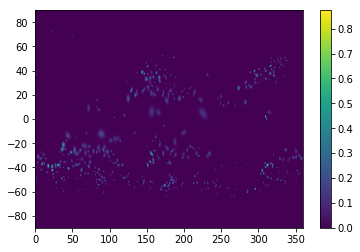

 0% [=====>               ]29% | Elapsed Time:832 s | Estimated Time:2883 s | Info: eddyn_476 |key:  eddyn_477 Level:  0.01


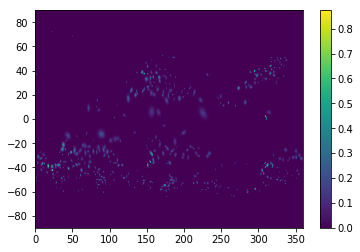

 0% [=====>               ]29% | Elapsed Time:834 s | Estimated Time:2884 s | Info: eddyn_477 |key:  eddyn_478 Level:  0.06999999999999999


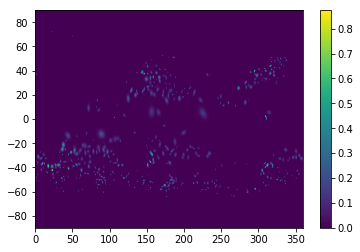

 0% [=====>               ]29% | Elapsed Time:836 s | Estimated Time:2885 s | Info: eddyn_478 |key:  eddyn_479 Level:  0.060000000000000005


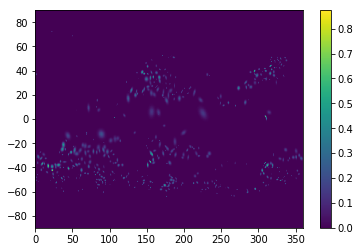

 0% [=====>               ]29% | Elapsed Time:837 s | Estimated Time:2882 s | Info: eddyn_479 |key:  eddyn_480 Level:  0.05


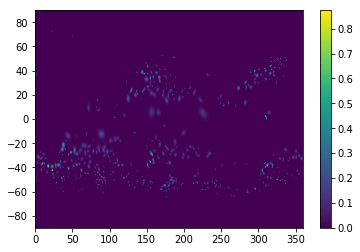

 0% [=====>               ]29% | Elapsed Time:839 s | Estimated Time:2883 s | Info: eddyn_480 |key:  eddyn_481 Level:  0.11


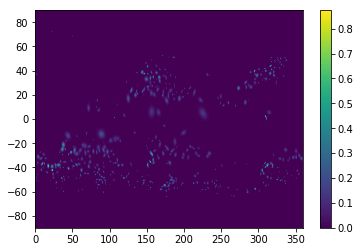

 0% [=====>               ]29% | Elapsed Time:841 s | Estimated Time:2884 s | Info: eddyn_481 |key:  eddyn_482 Level:  0.08


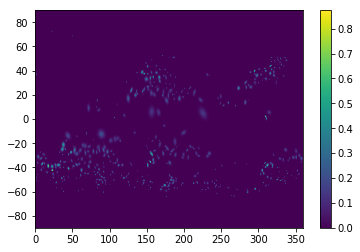

 0% [=====>               ]29% | Elapsed Time:843 s | Estimated Time:2885 s | Info: eddyn_482 |key:  eddyn_483 Level:  0.06999999999999999


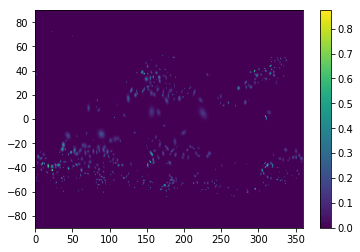

 0% [=====>               ]29% | Elapsed Time:844 s | Estimated Time:2883 s | Info: eddyn_483 |key:  eddyn_484 Level:  0.06999999999999999


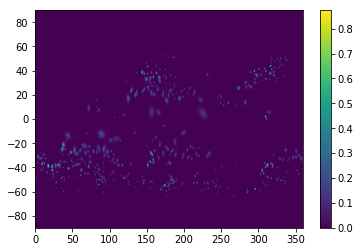

 0% [=====>               ]29% | Elapsed Time:846 s | Estimated Time:2883 s | Info: eddyn_484 |key:  eddyn_485 Level:  0.08


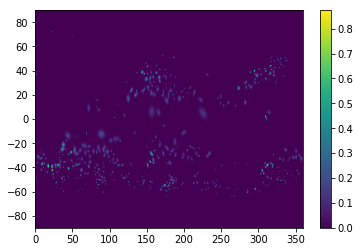

 0% [=====>               ]29% | Elapsed Time:848 s | Estimated Time:2884 s | Info: eddyn_485 |key:  eddyn_486 Level:  0.08


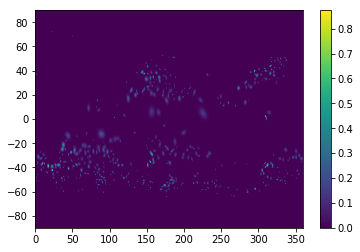

 0% [=====>               ]29% | Elapsed Time:850 s | Estimated Time:2885 s | Info: eddyn_486 |key:  eddyn_487 Level:  0.08


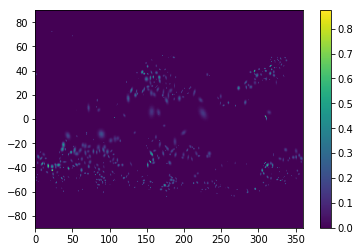

 0% [=====>               ]30% | Elapsed Time:851 s | Estimated Time:2883 s | Info: eddyn_487 |key:  eddyn_488 Level:  0.03


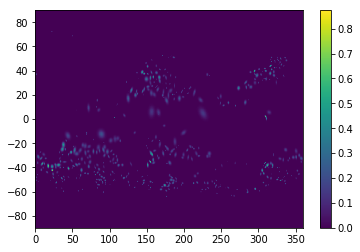

 0% [=====>               ]30% | Elapsed Time:853 s | Estimated Time:2883 s | Info: eddyn_488 |key:  eddyn_489 Level:  0.06999999999999999


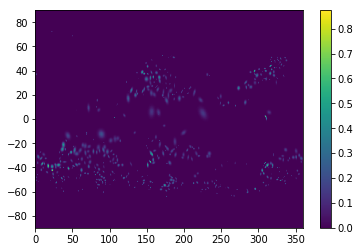

 0% [=====>               ]30% | Elapsed Time:855 s | Estimated Time:2884 s | Info: eddyn_489 |key:  eddyn_490 Level:  0.11


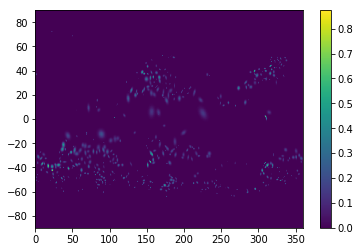

 0% [=====>               ]30% | Elapsed Time:856 s | Estimated Time:2882 s | Info: eddyn_490 |key:  eddyn_491 Level:  0.04


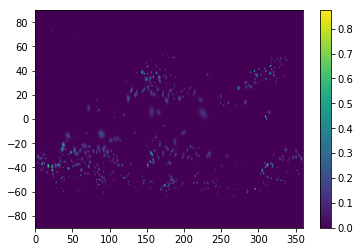

 0% [=====>               ]30% | Elapsed Time:858 s | Estimated Time:2883 s | Info: eddyn_491 |key:  eddyn_492 Level:  0.04


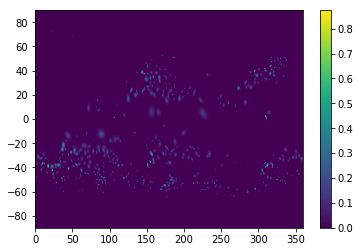

 0% [=====>               ]30% | Elapsed Time:860 s | Estimated Time:2884 s | Info: eddyn_492 |key:  eddyn_493 Level:  0.09


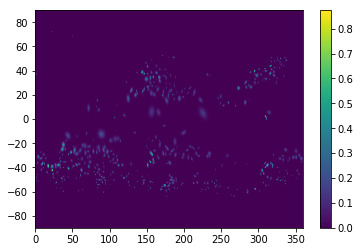

 0% [=====>               ]30% | Elapsed Time:861 s | Estimated Time:2881 s | Info: eddyn_493 |key:  eddyn_494 Level:  0.06999999999999999


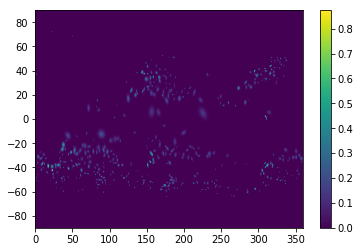

 0% [=====>               ]30% | Elapsed Time:863 s | Estimated Time:2882 s | Info: eddyn_494 |key:  eddyn_495 Level:  0.06999999999999999


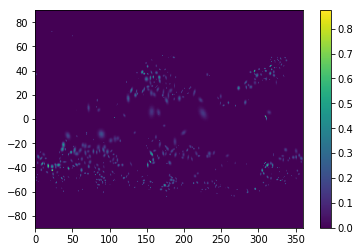

 0% [======>              ]30% | Elapsed Time:865 s | Estimated Time:2883 s | Info: eddyn_495 |key:  eddyn_496 Level:  0.06999999999999999


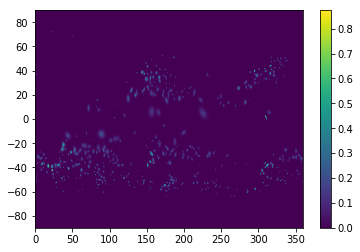

 0% [======>              ]30% | Elapsed Time:867 s | Estimated Time:2884 s | Info: eddyn_496 |key:  eddyn_497 Level:  0.11


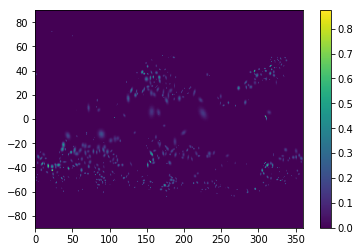

 0% [======>              ]30% | Elapsed Time:868 s | Estimated Time:2881 s | Info: eddyn_497 |key:  eddyn_498 Level:  0.11


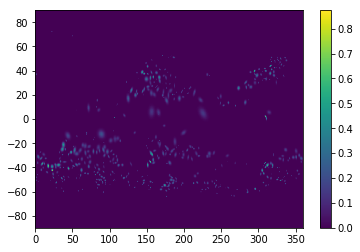

 0% [======>              ]30% | Elapsed Time:870 s | Estimated Time:2882 s | Info: eddyn_498 |key:  eddyn_499 Level:  0.09


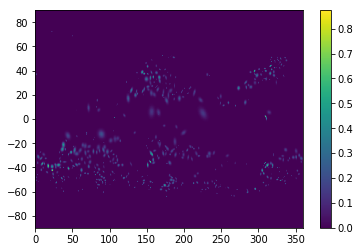

 0% [======>              ]30% | Elapsed Time:872 s | Estimated Time:2883 s | Info: eddyn_499 |key:  eddyn_500 Level:  0.08


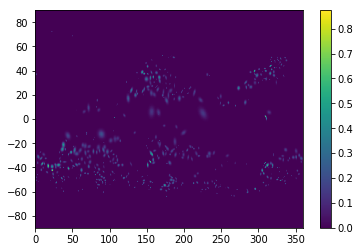

 0% [======>              ]30% | Elapsed Time:874 s | Estimated Time:2884 s | Info: eddyn_500 |key:  eddyn_501 Level:  0.03


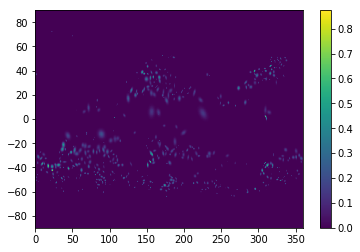

 0% [======>              ]30% | Elapsed Time:875 s | Estimated Time:2881 s | Info: eddyn_501 |key:  eddyn_502 Level:  0.08


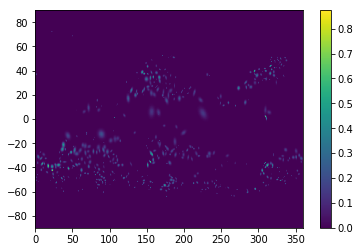

 0% [======>              ]30% | Elapsed Time:877 s | Estimated Time:2882 s | Info: eddyn_502 |key:  eddyn_503 Level:  0.060000000000000005


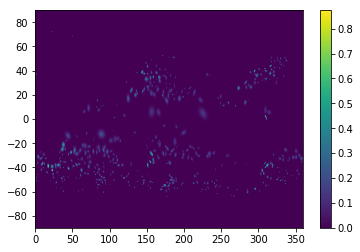

 0% [======>              ]30% | Elapsed Time:879 s | Estimated Time:2883 s | Info: eddyn_503 |key:  eddyn_504 Level:  0.03


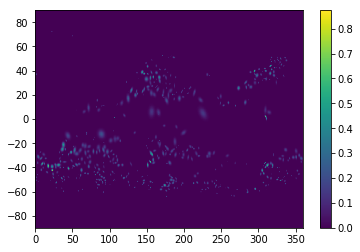

 0% [======>              ]31% | Elapsed Time:880 s | Estimated Time:2880 s | Info: eddyn_504 |key:  eddyn_505 Level:  0.060000000000000005


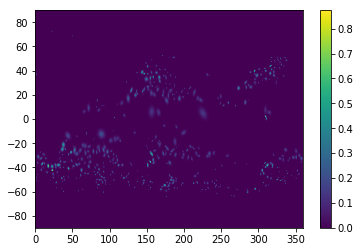

 0% [======>              ]31% | Elapsed Time:882 s | Estimated Time:2881 s | Info: eddyn_505 |key:  eddyn_506 Level:  0.09


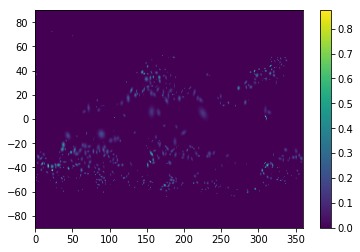

 0% [======>              ]31% | Elapsed Time:884 s | Estimated Time:2882 s | Info: eddyn_506 |key:  eddyn_507 Level:  0.04


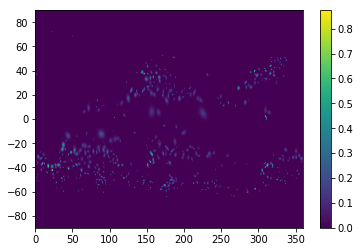

 0% [======>              ]31% | Elapsed Time:885 s | Estimated Time:2880 s | Info: eddyn_507 |key:  eddyn_508 Level:  0.09999999999999999


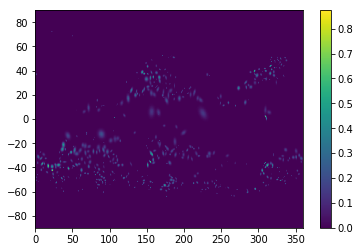

 0% [======>              ]31% | Elapsed Time:887 s | Estimated Time:2881 s | Info: eddyn_508 |key:  eddyn_509 Level:  0.09


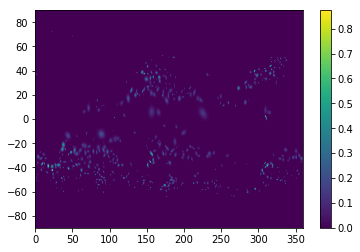

 0% [======>              ]31% | Elapsed Time:889 s | Estimated Time:2881 s | Info: eddyn_509 |key:  eddyn_510 Level:  0.01


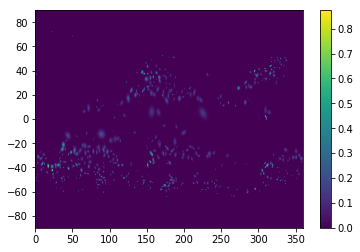

 0% [======>              ]31% | Elapsed Time:891 s | Estimated Time:2882 s | Info: eddyn_510 |key:  eddyn_511 Level:  0.08


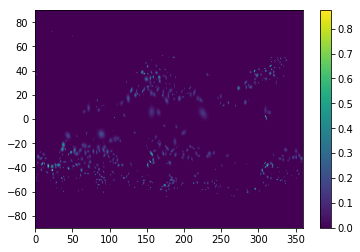

 0% [======>              ]31% | Elapsed Time:893 s | Estimated Time:2883 s | Info: eddyn_511 |key:  eddyn_512 Level:  0.02


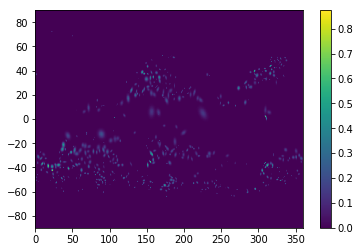

 0% [======>              ]31% | Elapsed Time:894 s | Estimated Time:2881 s | Info: eddyn_512 |key:  eddyn_513 Level:  0.11


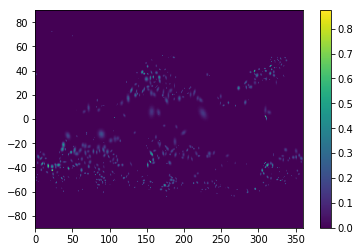

 0% [======>              ]31% | Elapsed Time:896 s | Estimated Time:2881 s | Info: eddyn_513 |key:  eddyn_514 Level:  0.11


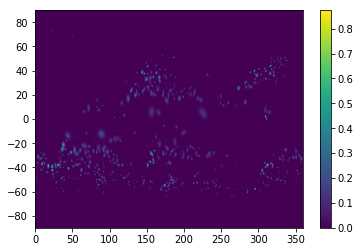

 0% [======>              ]31% | Elapsed Time:898 s | Estimated Time:2882 s | Info: eddyn_514 |key:  eddyn_515 Level:  0.05


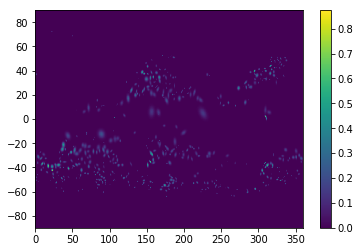

 0% [======>              ]31% | Elapsed Time:899 s | Estimated Time:2880 s | Info: eddyn_515 |key:  eddyn_516 Level:  0.06999999999999999


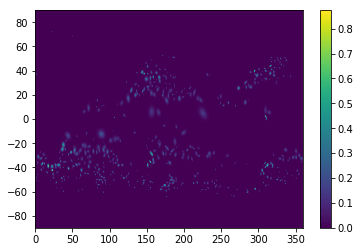

 0% [======>              ]31% | Elapsed Time:901 s | Estimated Time:2881 s | Info: eddyn_516 |key:  eddyn_517 Level:  0.11


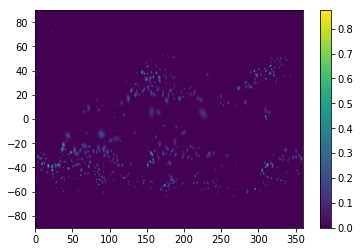

 0% [======>              ]31% | Elapsed Time:903 s | Estimated Time:2882 s | Info: eddyn_517 |key:  eddyn_518 Level:  0.04


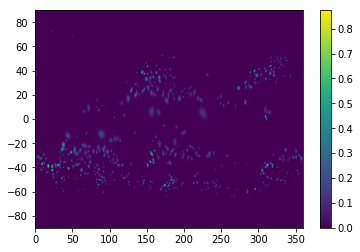

 0% [======>              ]31% | Elapsed Time:905 s | Estimated Time:2882 s | Info: eddyn_518 |key:  eddyn_519 Level:  0.11


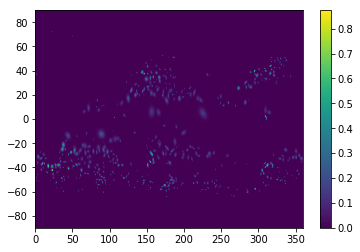

 0% [======>              ]31% | Elapsed Time:906 s | Estimated Time:2880 s | Info: eddyn_519 |key:  eddyn_520 Level:  0.09999999999999999


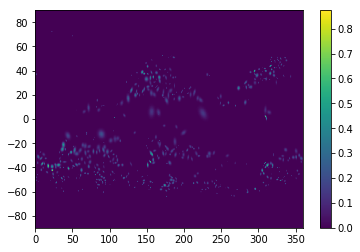

 0% [======>              ]32% | Elapsed Time:908 s | Estimated Time:2881 s | Info: eddyn_520 |key:  eddyn_521 Level:  0.09999999999999999


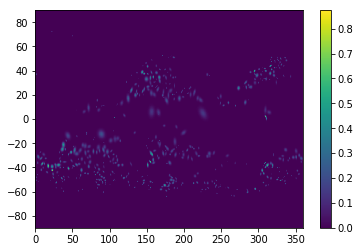

 0% [======>              ]32% | Elapsed Time:910 s | Estimated Time:2882 s | Info: eddyn_521 |key:  eddyn_522 Level:  0.08


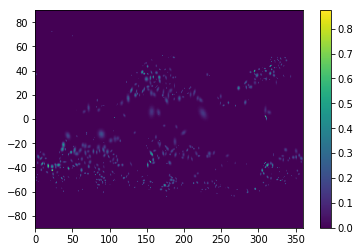

 0% [======>              ]32% | Elapsed Time:912 s | Estimated Time:2882 s | Info: eddyn_522 |key:  eddyn_523 Level:  0.11


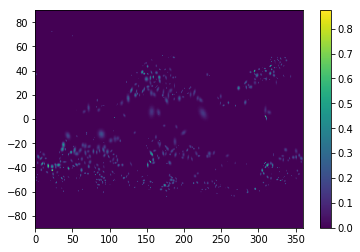

 0% [======>              ]32% | Elapsed Time:913 s | Estimated Time:2880 s | Info: eddyn_523 |key:  eddyn_524 Level:  0.09999999999999999


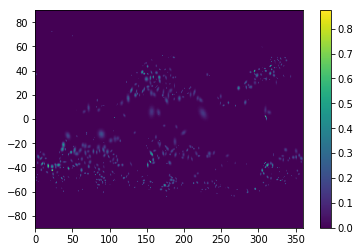

 0% [======>              ]32% | Elapsed Time:915 s | Estimated Time:2881 s | Info: eddyn_524 |key:  eddyn_525 Level:  0.08


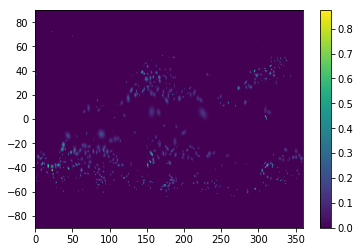

 0% [======>              ]32% | Elapsed Time:917 s | Estimated Time:2882 s | Info: eddyn_525 |key:  eddyn_526 Level:  0.06999999999999999


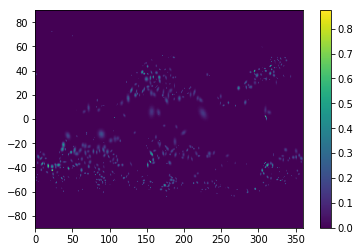

 0% [======>              ]32% | Elapsed Time:919 s | Estimated Time:2883 s | Info: eddyn_526 |key:  eddyn_527 Level:  0.06999999999999999


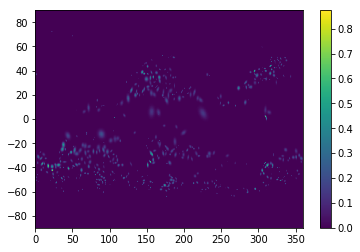

 0% [======>              ]32% | Elapsed Time:920 s | Estimated Time:2880 s | Info: eddyn_527 |key:  eddyn_528 Level:  0.09999999999999999


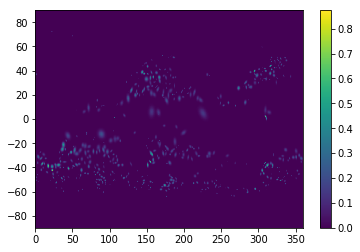

 0% [======>              ]32% | Elapsed Time:922 s | Estimated Time:2881 s | Info: eddyn_528 |key:  eddyn_529 Level:  0.09


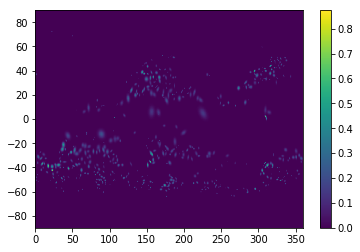

 0% [======>              ]32% | Elapsed Time:924 s | Estimated Time:2882 s | Info: eddyn_529 |key:  eddyn_530 Level:  0.060000000000000005


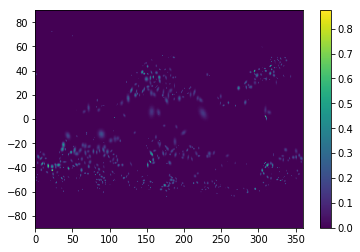

 0% [======>              ]32% | Elapsed Time:925 s | Estimated Time:2880 s | Info: eddyn_530 |key:  eddyn_531 Level:  0.09999999999999999


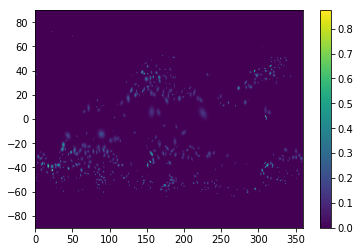

 0% [======>              ]32% | Elapsed Time:927 s | Estimated Time:2880 s | Info: eddyn_531 |key:  eddyn_532 Level:  0.08


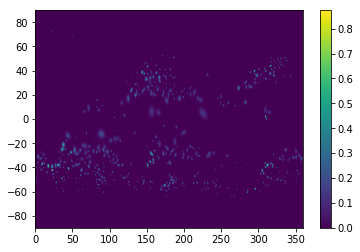

 0% [======>              ]32% | Elapsed Time:929 s | Estimated Time:2881 s | Info: eddyn_532 |key:  eddyn_533 Level:  0.09


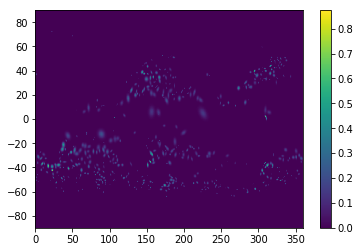

 0% [======>              ]32% | Elapsed Time:931 s | Estimated Time:2882 s | Info: eddyn_533 |key:  eddyn_534 Level:  0.08


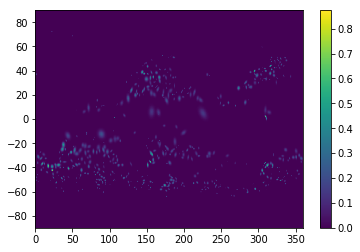

 0% [======>              ]32% | Elapsed Time:932 s | Estimated Time:2880 s | Info: eddyn_534 |key:  eddyn_535 Level:  0.08


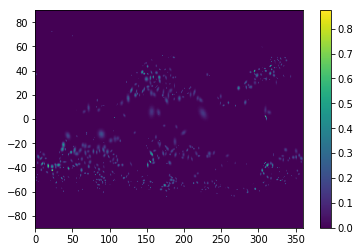

 0% [======>              ]32% | Elapsed Time:934 s | Estimated Time:2880 s | Info: eddyn_535 |key:  eddyn_536 Level:  0.08


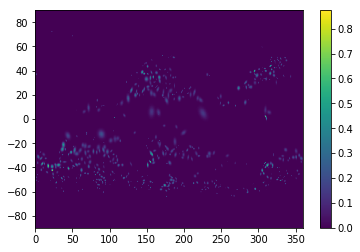

 0% [======>              ]32% | Elapsed Time:936 s | Estimated Time:2881 s | Info: eddyn_536 |key:  eddyn_537 Level:  0.09


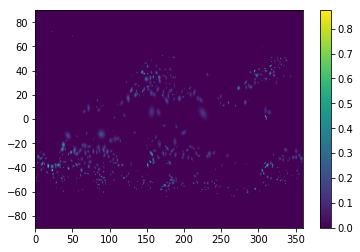

 0% [======>              ]33% | Elapsed Time:937 s | Estimated Time:2879 s | Info: eddyn_537 |key:  eddyn_538 Level:  0.04


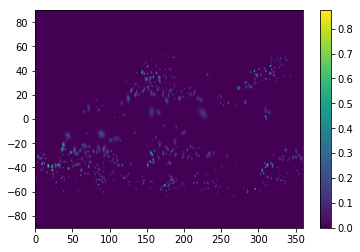

 0% [======>              ]33% | Elapsed Time:939 s | Estimated Time:2880 s | Info: eddyn_538 |key:  eddyn_539 Level:  0.05


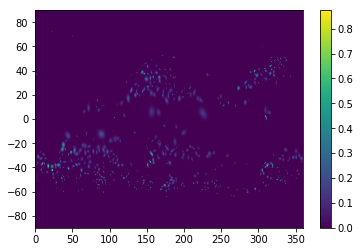

 0% [======>              ]33% | Elapsed Time:941 s | Estimated Time:2881 s | Info: eddyn_539 |key:  eddyn_540 Level:  0.06999999999999999


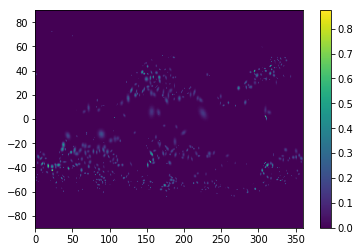

 0% [======>              ]33% | Elapsed Time:942 s | Estimated Time:2878 s | Info: eddyn_540 |key:  eddyn_541 Level:  0.08


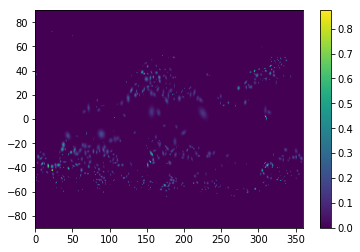

 0% [======>              ]33% | Elapsed Time:944 s | Estimated Time:2879 s | Info: eddyn_541 |key:  eddyn_542 Level:  0.060000000000000005


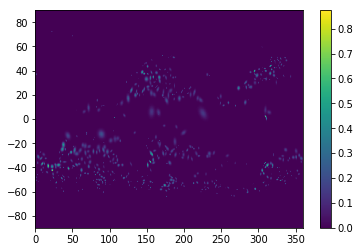

 0% [======>              ]33% | Elapsed Time:946 s | Estimated Time:2880 s | Info: eddyn_542 |key:  eddyn_543 Level:  0.05


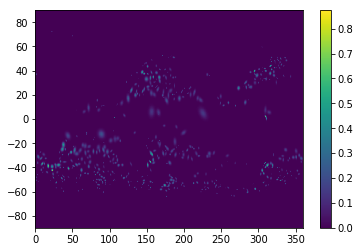

 0% [======>              ]33% | Elapsed Time:947 s | Estimated Time:2878 s | Info: eddyn_543 |key:  eddyn_544 Level:  0.06999999999999999


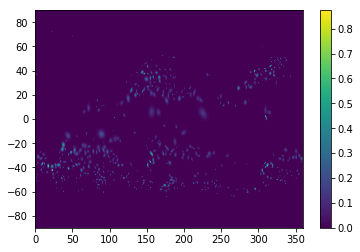

 0% [======>              ]33% | Elapsed Time:949 s | Estimated Time:2878 s | Info: eddyn_544 |key:  eddyn_545 Level:  0.05


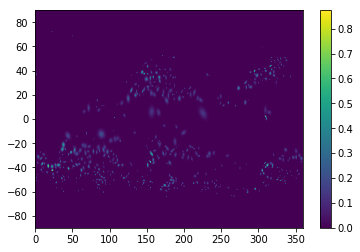

 0% [======>              ]33% | Elapsed Time:951 s | Estimated Time:2879 s | Info: eddyn_545 |key:  eddyn_546 Level:  0.08


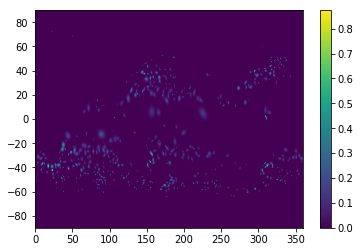

 0% [======>              ]33% | Elapsed Time:953 s | Estimated Time:2880 s | Info: eddyn_546 |key:  eddyn_547 Level:  0.09999999999999999


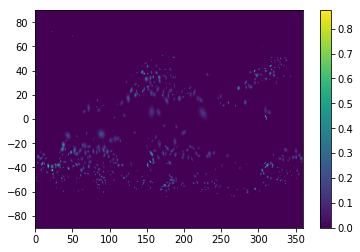

 0% [======>              ]33% | Elapsed Time:954 s | Estimated Time:2878 s | Info: eddyn_547 |key:  eddyn_548 Level:  0.05


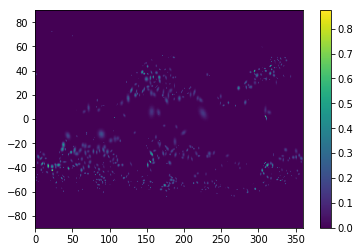

 0% [======>              ]33% | Elapsed Time:956 s | Estimated Time:2878 s | Info: eddyn_548 |key:  eddyn_549 Level:  0.060000000000000005


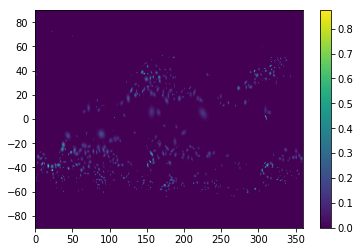

 0% [======>              ]33% | Elapsed Time:958 s | Estimated Time:2879 s | Info: eddyn_549 |key:  eddyn_550 Level:  0.060000000000000005


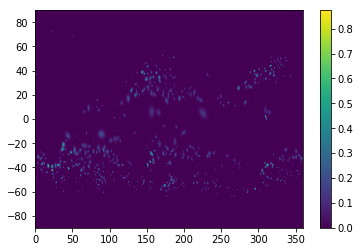

 0% [======>              ]33% | Elapsed Time:959 s | Estimated Time:2877 s | Info: eddyn_550 |key:  eddyn_551 Level:  0.06999999999999999


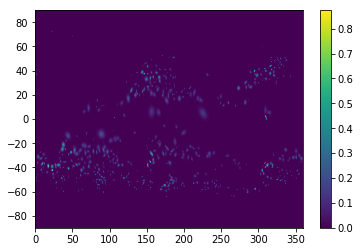

 0% [======>              ]33% | Elapsed Time:961 s | Estimated Time:2878 s | Info: eddyn_551 |key:  eddyn_552 Level:  0.09999999999999999


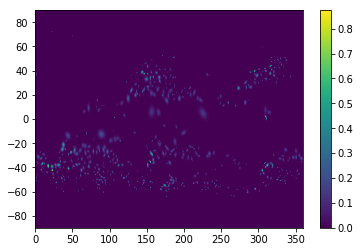

 0% [======>              ]33% | Elapsed Time:963 s | Estimated Time:2879 s | Info: eddyn_552 |key:  eddyn_553 Level:  0.09999999999999999


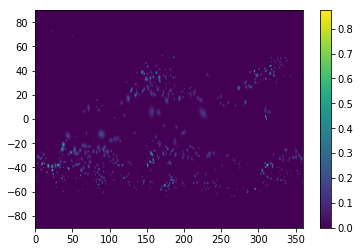

 0% [======>              ]34% | Elapsed Time:964 s | Estimated Time:2876 s | Info: eddyn_553 |key:  eddyn_554 Level:  0.08


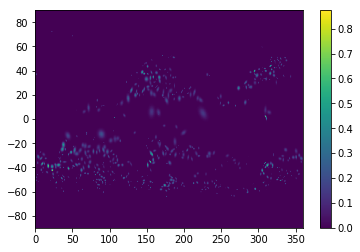

 0% [======>              ]34% | Elapsed Time:966 s | Estimated Time:2877 s | Info: eddyn_554 |key:  eddyn_555 Level:  0.08


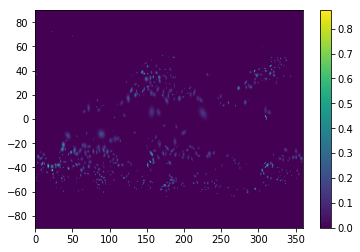

 0% [======>              ]34% | Elapsed Time:968 s | Estimated Time:2878 s | Info: eddyn_555 |key:  eddyn_556 Level:  0.09999999999999999


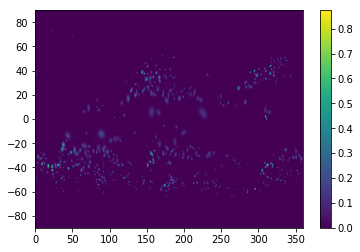

 0% [======>              ]34% | Elapsed Time:970 s | Estimated Time:2879 s | Info: eddyn_556 |key:  eddyn_557 Level:  0.05


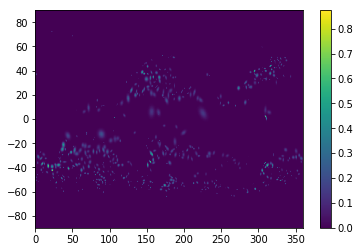

 0% [======>              ]34% | Elapsed Time:971 s | Estimated Time:2876 s | Info: eddyn_557 |key:  eddyn_558 Level:  0.06999999999999999


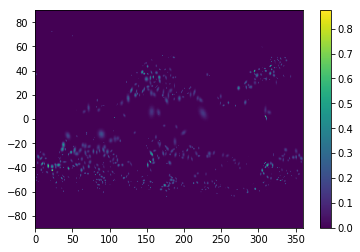

 0% [======>              ]34% | Elapsed Time:973 s | Estimated Time:2877 s | Info: eddyn_558 |key:  eddyn_559 Level:  0.060000000000000005


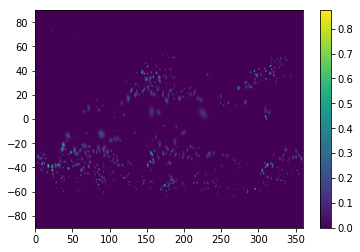

 0% [======>              ]34% | Elapsed Time:975 s | Estimated Time:2878 s | Info: eddyn_559 |key:  eddyn_560 Level:  0.08


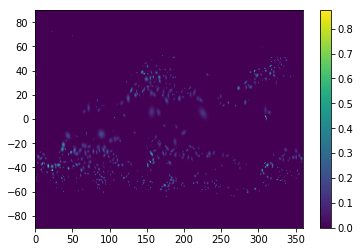

 0% [======>              ]34% | Elapsed Time:977 s | Estimated Time:2879 s | Info: eddyn_560 |key:  eddyn_561 Level:  0.02


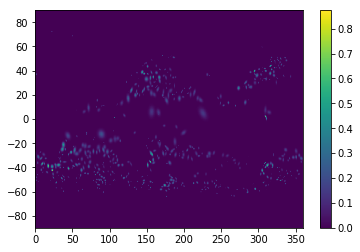

 0% [======>              ]34% | Elapsed Time:978 s | Estimated Time:2877 s | Info: eddyn_561 |key:  eddyn_562 Level:  0.060000000000000005


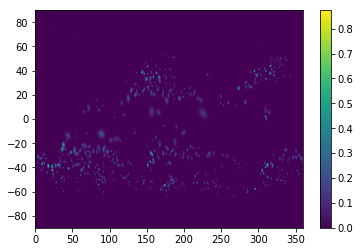

 0% [======>              ]34% | Elapsed Time:980 s | Estimated Time:2877 s | Info: eddyn_562 |key:  eddyn_563 Level:  0.060000000000000005


In [ ]:
eddysplot=reconstruct_syntetic(shape(ssha),lon,lat,eddytd,diagnostics=True)

In [ ]:
eddytdn=analyseddyzt(ssha[0:2,:,:],lon,lat,0,1,1,ssha[0:2,:,:].min(),-0.01,-0.01\
                     ,data_meant='',areamap=areamap,mask=''\
                     ,eccenfit=0.85,gaussrsquarefit=0.7,ellipsrsquarefit=0.7\
                     ,maskopt='contour',sfilter='uniform',sfsize=50\
                     ,destdir='',physics='',diagnostics=False,pprint=False)

In [ ]:
eddysplotn=reconstruct_syntetic(shape(ssha),lon,lat,eddytdn,diagnostics=False)

In [ ]:
key='eddyn_34'
eddytd[key]

In [ ]:
#pcolormesh(lon,lat,eddysplot[0,:,:])

Lon,Lat=meshgrid(lon,lat)

gausssianfitp=eddytd[key]['2dgaussianfit'][0]

gaussianfit=twoD_Gaussian((Lon,Lat,eddytd[key]['position_maxvalue'][0][2],\
                         eddytd[key]['position_maxvalue'][0][0],\
                         eddytd[key]['position_maxvalue'][0][1]),*gausssianfitp)

gaussarea= gaussareacheck((lon,lat,eddytd[key]['position_maxvalue'][0][2],\
                         eddytd[key]['position_maxvalue'][0][0],\
                         eddytd[key]['position_maxvalue'][0][1])\
                          ,eddytd[key]['level'],gausssianfitp,eddytd[key]['area'][2])
print(gaussarea)
print(eddytd[key]['area'])
print(gausssianfitp)

fit=gaussianfit.reshape(len(lat),len(lon))
pcolormesh(lon,lat,fit)

plot(eddytd[key]['ellipse'][0][0],eddytd[key]['ellipse'][0][1],'-r')
plot(eddytd[key]['contour'][0][0],eddytd[key]['contour'][0][1],'-k')
print(fit.max())


In [ ]:
basemap_mplot(lon,lat,[ssha[0,:,:],ssha[0,:,:]-eddysplot[0,:,:]-eddysplotn[0,:,:],eddysplotn[0,:,:],eddysplot[0,:,:]]\
              ,title=["SSHa","Eddies extraction","Negative Eddies extraction","Positive Eddies extraction"]\
              ,projection='mbtfpq',lat_0=-90,lon_0=-180,scale='Lin',cmap=cm.cm.balance,\
              vmin=-0.5,vmax=0.5,xan=2,yan=2,figsize=(20,10),fontsize=20);

In [ ]:
mask=ma.getmask(ssha[0,:,:])

In [ ]:
u_g,v_g=geovelfield(ssha[0,:,:],lon,lat,mask,5)
plt.pcolormesh(u_g,vmin=0)
print(nanmax(u_g),nanmax(v_g))

In [ ]:
eddyu,eddyv=geovelfield(eddysplotn[0,:,:]+eddysplot[0,:,:],lon,lat,mask)

In [ ]:
ke=KE(u_g,v_g)
eke=KE(eddyu,eddyv)
bjke=ke-eke#KE(u_g-eddyu,v_g-eddyv)

LO,LA=meshgrid(lon,lat)
newmask=np.ma.masked_where((LA <= -5) | (LA >= 5), LA)
newmask.mask

print(mean(ke*newmask.mask),mean(bjke*newmask.mask),mean(eke*newmask.mask))

In [ ]:
eu,ev=geovelfield(nofilterdata,lon,lat,mask)


In [ ]:
eeke=KE(eu,ev)
mean(eeke)


In [ ]:
print(mean(ke*newmask.mask),mean(bjke*newmask.mask),mean(eke*newmask.mask))

In [ ]:
basemap_mplot(lon,lat,[ke,bjke,eke]\
              ,title=["TKE","B&J KE","EKE"],scale='Lin',cmap=cm.cm.tempo,\
              projection='mbtfpq',lat_0=-90,lon_0=-180,vmin=0,vmax=10,xan=3,yan=1,figsize=(20,30),fontsize=20);

In [ ]:
basemap_mplot(lon,lat,ke*newmask.mask\
              ,title="TKE",scale='Lin',cmap=cm.cm.tempo,\
              projection='mbtfpq',lat_0=-90,lon_0=-180,vmin=0,vmax=10,xan=1,yan=1,figsize=(20,10),fontsize=20);
colorbar()

In [ ]:
basemap_mplot(lon,lat,eke*newmask.mask\
              ,title="EKE",scale='Lin',cmap=cm.cm.tempo,\
              projection='mbtfpq',lat_0=-90,lon_0=-180,vmin=0,vmax=10,xan=1,yan=1,figsize=(20,10),fontsize=20);
colorbar()

In [ ]:
basemap_mplot(lon,lat,ke*newmask.mask-eke*newmask.mask\
              ,title="BKE",scale='Lin',cmap=cm.cm.tempo,\
              projection='mbtfpq',lat_0=-90,lon_0=-180,vmin=0,vmax=10,xan=1,yan=1,figsize=(20,10),fontsize=20);
colorbar()

In [ ]:
u_g=zeros(shape(ssha))
v_g=zeros(shape(ssha))
for ii in range(30):
    u_g[ii,:,:],v_g[ii,:,:]=geovelfield(ssha[ii,:,:],lon,lat,mask)

In [ ]:
threshold=3
eddysup=exeddydt(eddytd,lat,lon,u_g,threshold,inside=ssha[:,:,:],diagnostics=False)
eddysun=exeddydt(eddytdn,lat,lon,u_g,threshold,inside=ssha[:,:,:],diagnostics=False)

In [ ]:
threshold=3
eddysvp=exeddydt(eddytd,lat,lon,v_g,threshold,inside=ssha[:,:,:],diagnostics=False)
eddysvn=exeddydt(eddytdn,lat,lon,v_g,threshold,inside=ssha[:,:,:],diagnostics=False)

In [ ]:
eddyu=(eddysun+eddysup)
eddyv=(eddysvn+eddysvp)

In [ ]:
###Creating animation of KE
eke =zeros(shape(eddyu))
print(shape(eke))
for ii in range(30):
    eke[ii,:,:]=KE(eddyu[ii,:,:],eddyv[ii,:,:])
    bjke=KE(u_g[ii,:,:]-eddyu[ii,:,:],v_g[ii,:,:]-eddyv[ii,:,:])
    ke=KE(u_g[ii,:,:],v_g[ii,:,:])

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.gridspec as gridspec
import matplotlib.animation as animation
from matplotlib import rc
rc('animation', html='html5')
############################
#Create the figure

fig = plt.figure(figsize=(15, 10),facecolor='white')
gs = gridspec.GridSpec(1, 1)

#############################

ax1 = plt.subplot(gs[0,0])

lonmm,latmm=np.meshgrid(lon,lat)
#############################
#Plot the background and other things, This will be in all the frames
map = Basemap(projection='mbtfpq',lat_0=-90,lon_0=-180,resolution='c',ax=ax1)
lonm,latm=map(lonmm,latmm)
map.drawmeridians(np.arange(0,360,30),labels=[1,1,0,0],fontsize=10)
map.drawparallels(np.arange(0,360,30),labels=[1,1,0,0],fontsize=10)
map.fillcontinents(color='black',lake_color='aqua')
map.drawcoastlines()
map.drawcoastlines()
quad1 = ax1.pcolormesh(lonm,latm,eke[0,:,:],shading='gouraud',cmap=cm.cm.tempo,\
              vmin=0,vmax=0.2)
cb1 = fig.colorbar(quad1,ax=ax1)
##############################

##############################
#Intitial stage blank
def init():
    quad1.set_array([])
    return quad1
##############################

##############################
#Animation function, replace the values of the eke in a '1d list'
def animate(iter):
    quad1.set_array(eke[iter,:,:].ravel())
    return quad1
##############################

##############################
#Remove edges
gs.tight_layout(fig)
##############################

##############################
#Animation structure
anim2 = animation.FuncAnimation(fig,animate,frames=30,interval=1000,blit=False,repeat=False)
##############################
plt.close()
##############################
#Display and convert animation to html5
anim2



In [ ]:
Writer = animation.writers['ffmpeg']
writer = Writer(fps=15, metadata=dict(artist='Me'), bitrate=1800)

In [ ]:
##############################
#Save animation
anim2.save('../output/eke_30days_ecc0-08_1axis.mp4', writer=writer)

In [ ]:
import xarray as xr
ncfile=xr.open_dataset('/home/156/jm5970/github/trackeddy/data.input/meanssh_10yrs_AEXP.nc',decode_times=False)

In [ ]:
ncfile.SSH_mean.plot()

In [ ]:
sqrt(1-1/4)